In [1]:
# standard imports
import warnings
import math
import cmath
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.linear_model import LinearRegression
import os.path
import datetime
import random
from nsetools import Nse

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# creating a Nse object
nse = Nse()

pd.set_option('display.max_rows', None)

# Find the most recent working day, to avoid trying to download all stocks data from weekends
end_dt = dt.datetime.today()
day_of_the_week = end_dt.weekday() # starts from 0 for Monday end ends on 6 for Sunday
if ( day_of_the_week == 5): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=1)
elif ( day_of_the_week == 6): # Saturday & Sunday
    end_dt = end_dt - dt.timedelta(days=2)

DD = dt.timedelta(days=365*20)
start_dt = end_dt - DD
end = end_dt.strftime("%Y-%m-%d")
start = start_dt.strftime("%Y-%m-%d")
print("Date as string - start:{} end:{}".format(start, end))
annual_risk_free_interest_rate = (5.1/100)
# compound interest rate is translated into a monthly rate with this formula: i_monthly = (1 + i_annual) ^ (1/12) – 1
monthly_risk_free_interest_rate = (1 + annual_risk_free_interest_rate / 100 )**(1/12) - 1
equity_risk_premium = (8.0/100) # India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
#tickers=['^NSEI', 'ACC.NS','TCS.NS', 'INFY.NS', 'WIPRO.NS']
t=['^NSEI', 'ACC.NS', 'AJANTSOY.BO', 'AMARAJABAT.NS', 'AROGRANITE.NS', 'ASHOKLEY.NS', 'ATULAUTO.NS', 'BAJAJST.BO', 'BHARTIARTL.NS', 'CANBK.NS', 'CYIENT.NS', 'DABUR.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DIXON.NS', 'DWARKESH.NS', 'EIDPARRY.NS', 'FSL.NS', 'GPIL.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HEMIPROP.NS', 'HGS.NS', 'HINDALCO.NS', 'IGPL.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDNIPPON.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'ITC.NS', 'JENBURPH.BO', 'JKTYRE.NS', 'JSLHISAR.NS', 'LGBBROSLTD.NS', 'LINCOLN.NS', 'LT.NS', 'MANALIPETC.NS', 'MCX.NS', 'MIDHANI.NS', 'MINDTREE.NS', 'MPHASIS.NS', 'NMDC.NS', 'NTPC.NS', 'OPTOCIRCUI.NS', 'PNB.NS', 'POWERGRID.NS', 'RELIANCE.NS', 'RPOWER.NS', 'SUZLON.NS', 'TATACHEM.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCS.NS', 'TINPLATE.NS', 'TITAN.NS', 'ULTRACEMCO.NS', 'WOCKPHARMA.NS', 'ZEEL.NS']
j=['^NSEI', 'ACC.NS', 'ANSALHSG.NS', 'DABUR.NS', 'DLF.NS', 'GICHSGFIN.NS', 'GMRINFRA.NS', 'IDBI.NS', 'JPASSOCIAT.NS', 'LT.NS', 'Parsvnath.NS', 'PURVA.NS', 'RELCAPITAL.NS', 'Reliance.NS', 'Suzlon.NS', 'TTML.NS', 'UNITECH.NS']
nifty500=['^NSEI', '3MINDIA.NS', 'ABB.NS', 'ACC.NS', 'AIAENG.NS', 'APLAPOLLO.NS', 'AUBANK.NS', 'POWERINDIA.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AAVAS.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ACC.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANITRANS.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AIAENG.NS', 'AJANTPHARM.NS', 'ALEMBICLTD.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALOKINDS.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBUJACEM.NS', 'ANGELBRKG.NS', 'ANURAS.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLOHOSP.NS', 'APOLLOTYRE.NS', 'ASAHIINDIA.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANPAINT.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAZEN.NS', 'ATGL.NS', 'ATUL.NS', 'AUBANK.NS', 'AUROPHARMA.NS', 'AVANTIFEED.NS', 'AXISBANK.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAMINES.NS', 'BALKRISIND.NS', 'BALRAMCHIN.NS', 'BANDHANBNK.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BASF.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBTC.NS', 'BDL.NS', 'BEL.NS', 'BEML.NS', 'BERGEPAINT.NS', 'BHARATFORG.NS', 'BHARATRAS.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIOCON.NS', 'BIRLACORPN.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BSE.NS', 'BSOFT.NS', 'BURGERKING.NS', 'CADILAHC.NS', 'CAMS.NS', 'CANBK.NS', 'CANFINHOME.NS', 'CAPLIPOINT.NS', 'CARBORUNIV.NS', 'CASTROLIND.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CENTRALBK.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIPLA.NS', 'COALINDIA.NS', 'COCHINSHIP.NS', 'COFORGE.NS', 'COLPAL.NS', 'CONCOR.NS', 'COROMANDEL.NS', 'CREDITACC.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CUB.NS', 'CUMMINSIND.NS', 'CYIENT.NS', 'DABUR.NS', 'DALBHARAT.NS', 'DBL.NS', 'DCBBANK.NS', 'DCMSHRIRAM.NS', 'DEEPAKNTR.NS', 'DELTACORP.NS', 'DHANI.NS', 'DHANUKA.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DMART.NS', 'DRREDDY.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIHOTEL.NS', 'ELGIEQUIP.NS', 'EMAMILTD.NS', 'ENDURANCE.NS', 'ENGINERSIN.NS', 'EPL.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'ESCORTS.NS', 'EXIDEIND.NS', 'FACT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINPIPE.NS', 'FLUOROCHEM.NS', 'FORTIS.NS', 'FRETAIL.NS', 'FSL.NS', 'GAEL.NS', 'GAIL.NS', 'GALAXYSURF.NS', 'GARFIBRES.NS', 'GESHIP.NS', 'GICRE.NS', 'GILLETTE.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GMMPFAUDLR.NS', 'GNFC.NS', 'GODFRYPHLP.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GPPL.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GREAVESCOT.NS', 'GRINDWELL.NS', 'GSFC.NS', 'GSPL.NS', 'GUJALKALI.NS', 'GUJGASLTD.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HEROMOTOCO.NS', 'HFCL.NS', 'HGS.NS', 'HIKAL.NS', 'HINDALCO.NS', 'HINDCOPPER.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HUDCO.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBIND.NS', 'IGL.NS', 'IIFL.NS', 'IIFLWAM.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDOCO.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INFIBEAM.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INTELLECT.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'ISEC.NS', 'ITC.NS', 'ITI.NS', 'JAMNAAUTO.NS', 'JBCHEPHARM.NS', 'JCHAC.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JKCEMENT.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMFINANCIL.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWSTEEL.NS', 'JUBLFOOD.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'KAJARIACER.NS', 'KALPATPOWR.NS', 'KALYANKJIL.NS', 'KANSAINER.NS', 'KARURVYSYA.NS', 'KEC.NS', 'KEI.NS', 'KNRCON.NS', 'KOTAKBANK.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KSB.NS', 'KSCL.NS', 'L&TFH.NS', 'LALPATHLAB.NS', 'LAOPALA.NS', 'LAURUSLABS.NS', 'LAXMIMACH.NS', 'LEMONTREE.NS', 'LICHSGFIN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'M&M.NS', 'M&MFIN.NS', 'MAHABANK.NS', 'MAHINDCIE.NS', 'MAHLOG.NS', 'MANAPPURAM.NS', 'MARICO.NS', 'MARUTI.NS', 'MASTEK.NS', 'MAXHEALTH.NS', 'MAZDOCK.NS', 'MCDOWELL-N.NS', 'MCX.NS', 'METROPOLIS.NS', 'MFSL.NS', 'MGL.NS', 'MHRIL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTREE.NS', 'MMTC.NS', 'MOIL.NS', 'MOTILALOFS.NS', 'MPHASIS.NS', 'MRF.NS', 'MRPL.NS', 'MUTHOOTFIN.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATIONALUM.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAZARA.NS', 'NBCC.NS', 'NCC.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NFL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NILKAMAL.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NTPC.NS', 'OBEROIRLTY.NS', 'OFSS.NS', 'OIL.NS', 'ONGC.NS', 'ORIENTELEC.NS', 'PAGEIND.NS', 'PEL.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PGHH.NS', 'PGHL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PNB.NS', 'PNBHOUSING.NS', 'PNCINFRA.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'PRAJIND.NS', 'PRESTIGE.NS', 'PRINCEPIPE.NS', 'PRSMJOHNSN.NS', 'PVR.NS', 'QUESS.NS', 'RADICO.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RALLIS.NS', 'RAMCOCEM.NS', 'RATNAMANI.NS', 'RBLBANK.NS', 'RCF.NS', 'RECLTD.NS', 'REDINGTON.NS', 'RELAXO.NS', 'RELIANCE.NS', 'RHIM.NS', 'RITES.NS', 'ROSSARI.NS', 'ROUTE.NS', 'RVNL.NS', 'SAIL.NS', 'SANOFI.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCHAEFFLER.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SEQUENT.NS', 'SFL.NS', 'SHARDACROP.NS', 'SHILPAMED.NS', 'SHREECEM.NS', 'SHRIRAMCIT.NS', 'SIEMENS.NS', 'SIS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPICEJET.NS', 'SRF.NS', 'SRTRANSFIN.NS', 'STAR.NS', 'STARCEMENT.NS', 'STLTECH.NS', 'SUDARSCHEM.NS', 'SUMICHEM.NS', 'SUNDARMFIN.NS', 'SUNDRMFAST.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEIND.NS', 'SUVENPHAR.NS', 'SUZLON.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TANLA.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TCIEXP.NS', 'TCNSBRANDS.NS', 'TCS.NS', 'TEAMLEASE.NS', 'TECHM.NS', 'THERMAX.NS', 'THYROCARE.NS', 'TIINDIA.NS', 'TIMKEN.NS', 'TITAN.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TRENT.NS', 'TRIDENT.NS', 'TRITURBINE.NS', 'TTKPRESTIG.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSMOTOR.NS', 'UBL.NS', 'UCOBANK.NS', 'UFLEX.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UNIONBANK.NS', 'UPL.NS', 'UTIAMC.NS', 'VAIBHAVGBL.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARROC.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VGUARD.NS', 'VINATIORGA.NS', 'VIPIND.NS', 'VMART.NS', 'VOLTAS.NS', 'VTL.NS', 'WABCOINDIA.NS', 'WELCORP.NS', 'WELSPUNIND.NS', 'WESTLIFE.NS', 'WHIRLPOOL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'YESBANK.NS', 'ZEEL.NS', 'ZENSARTECH.NS', 'ZYDUSWELL.NS']
all_stocks_nifty1 = ['^NSEI', 'RELIANCE.NS', 'TCS.NS', 'HDFCBANK.NS', 'INFY.NS', 'HINDUNILVR.NS', 'HDFC.NS', 'ICICIBANK.NS', 'KOTAKBANK.NS', 'SBIN.NS', 'BAJFINANCE.NS', 'BHARTIARTL.NS', 'ITC.NS', 'HCLTECH.NS', 'ASIANPAINT.NS', 'WIPRO.NS', 'AXISBANK.NS', 'MARUTI.NS', 'LT.NS', 'ULTRACEMCO.NS', 'DMART.NS', 'ADANIGREEN.NS', 'BAJAJFINSV.NS', 'SUNPHARMA.NS', 'ADANIPORTS.NS', 'HDFCLIFE.NS', 'TITAN.NS', 'ONGC.NS', 'HINDZINC.NS', 'ADANIENT.NS', 'JSWSTEEL.NS', 'POWERGRID.NS', 'SHREECEM.NS', 'BAJAJ-AUTO.NS', 'ATGL.NS', 'NTPC.NS', 'TATAMOTORS.NS', 'ADANITRANS.NS', 'M&M.NS', 'DIVISLAB.NS', 'TECHM.NS', 'DABUR.NS', 'GRASIM.NS', 'BPCL.NS', 'PIDILITIND.NS', 'TATASTEEL.NS', 'SBILIFE.NS', 'BRITANNIA.NS', 'SBICARD.NS', 'IOC.NS', 'VEDL.NS', 'COALINDIA.NS', 'DRREDDY.NS', 'GODREJCP.NS', 'BERGEPAINT.NS', 'INDUSINDBK.NS', 'HINDALCO.NS', 'EICHERMOT.NS', 'DLF.NS', 'LTI.NS', 'INDUSTOWER.NS', 'HAVELLS.NS', 'CIPLA.NS', 'SIEMENS.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'MOTHERSUMI.NS', 'INDIGO.NS', 'HDFCAMC.NS', 'AMBUJACEM.NS', 'GAIL.NS', 'TATACONSUM.NS', 'HEROMOTOCO.NS', 'NAUKRI.NS', 'BANDHANBNK.NS', 'MARICO.NS', 'AUROPHARMA.NS', 'BIOCON.NS', 'UPL.NS', 'MUTHOOTFIN.NS', 'LUPIN.NS', 'CHOLAFIN.NS', 'CADILAHC.NS', 'TORNTPHARM.NS', 'COLPAL.NS', 'HONAUT.NS', 'APOLLOHOSP.NS', 'BOSCHLTD.NS', 'IDBI.NS', 'PGHH.NS', 'GLAND.NS', 'MCDOWELL-N.NS', 'NMDC.NS', 'PEL.NS', 'GODREJPROP.NS', 'YESBANK.NS', 'JUBLFOOD.NS', 'PNB.NS', 'AUBANK.NS', 'BANKBARODA.NS', 'GUJGASLTD.NS', 'BAJAJHLDNG.NS', 'CONCOR.NS', 'SRTRANSFIN.NS', 'IGL.NS', 'ACC.NS', 'JINDALSTEL.NS', 'GICRE.NS', 'MRF.NS', 'HINDPETRO.NS', 'MINDTREE.NS', '3MINDIA.NS', 'PIIND.NS', 'PAGEIND.NS', 'PETRONET.NS', 'ASHOKLEY.NS', 'HAL.NS', 'MPHASIS.NS', 'VOLTAS.NS', 'ALKEM.NS', 'TATAPOWER.NS', 'UBL.NS', 'ADANIPOWER.NS', 'BALKRISIND.NS', 'SAIL.NS', 'ASTRAL.NS', 'KANSAINER.NS', 'SRF.NS', 'IDFCFIRSTB.NS', 'BEL.NS', 'TATACOMM.NS', 'PFC.NS', 'IRFC.NS', 'ABB.NS', 'DALBHARAT.NS', 'MFSL.NS', 'VBL.NS', 'ABCAPITAL.NS', 'SUNDARMFIN.NS', 'WHIRLPOOL.NS', 'IRCTC.NS', 'LTTS.NS', 'TVSMOTOR.NS', 'BHARATFORG.NS', 'OFSS.NS', 'TRENT.NS', 'IDEA.NS', 'IOB.NS', 'SUPREMEIND.NS', 'RECLTD.NS', 'CUMMINSIND.NS', 'NIACL.NS', 'CANBK.NS', 'CROMPTON.NS', 'M&MFIN.NS', 'NHPC.NS', 'GLAXO.NS', 'IPCALAB.NS', 'L&TFH.NS', 'RAMCOCEM.NS', 'INDIAMART.NS', 'TIINDIA.NS', 'AARTIIND.NS', 'COROMANDEL.NS', 'DEEPAKNTR.NS', 'LALPATHLAB.NS', 'JKCEMENT.NS', 'BANKINDIA.NS', 'UNIONBANK.NS', 'RELAXO.NS', 'SYNGENE.NS', 'LICHSGFIN.NS', 'EMAMILTD.NS', 'DIXON.NS', 'ATUL.NS', 'OBEROIRLTY.NS', 'NAM-INDIA.NS', 'PFIZER.NS', 'POLYCAB.NS', 'ENDURANCE.NS', 'TORNTPOWER.NS', 'MAXHEALTH.NS', 'ZEEL.NS', 'LAURUSLABS.NS', 'AIAENG.NS', 'GILLETTE.NS', 'TATACHEM.NS', 'AAVAS.NS', 'RUCHI.NS', 'APLLTD.NS', 'SUNTV.NS', 'GODREJIND.NS', 'SANOFI.NS', 'BATAINDIA.NS', 'COFORGE.NS', 'APLAPOLLO.NS', 'ESCORTS.NS', 'ABFRL.NS', 'SCHAEFFLER.NS', 'BHEL.NS', 'SUNDRMFAST.NS', 'TATAELXSI.NS', 'THERMAX.NS', 'HATSUN.NS', 'EXIDEIND.NS', 'AJANTPHARM.NS', 'GSPL.NS', 'LINDEINDIA.NS', 'FEDERALBNK.NS', 'NATCOPHARM.NS', 'FORTIS.NS', 'KAJARIACER.NS', 'MINDAIND.NS', 'PERSISTENT.NS', 'GMRINFRA.NS', 'AMARAJABAT.NS', 'SUMICHEM.NS', 'JSWENERGY.NS', 'VINATIORGA.NS', 'APOLLOTYRE.NS', 'RAJESHEXPO.NS', 'AFFLE.NS', 'MAHABANK.NS', 'NAVINFLUOR.NS', 'PHOENIXLTD.NS', 'CRISIL.NS', 'OIL.NS', 'BLUEDART.NS', 'INDHOTEL.NS', 'GLENMARK.NS', 'INDIANB.NS', 'SUVENPHAR.NS', 'MANAPPURAM.NS', 'ZYDUSWELL.NS', 'VAIBHAVGBL.NS', 'WABCOINDIA.NS', 'RBLBANK.NS', 'CASTROLIND.NS', 'ISEC.NS', 'PRESTIGE.NS', 'ALKYLAMINE.NS', 'SOLARINDS.NS', 'MGL.NS', 'CUB.NS', 'METROPOLIS.NS', 'INDIGOPNTS.NS', 'CHOLAHLDNG.NS', 'BAJAJELEC.NS', 'AMBER.NS', 'SKFINDIA.NS', 'TANLA.NS', 'HINDCOPPER.NS', 'UCOBANK.NS', 'IIFLWAM.NS', 'JUBLPHARMA.NS', 'VGUARD.NS', 'ITI.NS', 'IIFL.NS', 'KEC.NS', 'GRINDWELL.NS', 'AEGISCHEM.NS', 'AKZOINDIA.NS', 'CREDITACC.NS', 'QUESS.NS', 'PGHL.NS', 'SJVN.NS', 'NATIONALUM.NS', 'GODREJAGRO.NS', 'TTKPRESTIG.NS', 'ALOKINDS.NS', 'GRAPHITE.NS', 'IEX.NS', 'INTELLECT.NS', 'ORCHPHARMA.NS', 'TIMKEN.NS', 'JBCHEPHARM.NS', 'CARBORUNIV.NS', 'SFL.NS', 'CENTRALBK.NS', 'CHAMBLFERT.NS', 'MOTILALOFS.NS', 'IBULHSGFIN.NS', 'GALAXYSURF.NS', 'SHRIRAMCIT.NS', 'BLUESTARCO.NS', 'BASF.NS', 'CGPOWER.NS', 'RATNAMANI.NS', 'DHANI.NS', 'SYMPHONY.NS', 'HUDCO.NS', 'KIOCL.NS', 'NBCC.NS', 'NH.NS', 'ERIS.NS', 'CANFINHOME.NS', 'ROUTE.NS', 'WELSPUNIND.NS', 'JMFINANCIL.NS', 'DBL.NS', 'HAPPSTMNDS.NS', 'FSL.NS', 'FINPIPE.NS', 'POLYMED.NS', 'CESC.NS', 'DCMSHRIRAM.NS', 'BBTC.NS', 'STLTECH.NS', 'STAR.NS', 'IDFC.NS', 'ASAHIINDIA.NS', 'ASTRAZEN.NS', 'GRANULES.NS', 'RADICO.NS', 'VTL.NS', 'EPL.NS', 'PVR.NS', 'REDINGTON.NS', 'UTIAMC.NS', 'KPRMILL.NS', 'BIRLACORPN.NS', 'LAXMIMACH.NS', 'JCHAC.NS', 'TRIDENT.NS', 'CYIENT.NS', 'CENTURYPLY.NS', 'BSOFT.NS', 'KALYANKJIL.NS', 'FINEORG.NS', 'NLCINDIA.NS', 'ASTERDM.NS', 'EQUITASBNK.NS', 'CDSL.NS', 'MRPL.NS', 'CGCL.NS', 'PNCINFRA.NS', 'ORIENTELEC.NS', 'PRSMJOHNSN.NS', 'AARTIDRUGS.NS', 'TEAMLEASE.NS', 'MMTC.NS', 'FLUOROCHEM.NS', 'INFIBEAM.NS', 'PNBHOUSING.NS', 'CEATLTD.NS', 'GMMPFAUDLR.NS', 'SUNCLAYLTD.NS', 'ZENSARTECH.NS', 'MAHINDCIE.NS', 'BDL.NS', 'RVNL.NS', 'ELGIEQUIP.NS', 'KNRCON.NS', 'SEQUENT.NS', 'VAKRANGEE.NS', 'EDELWEISS.NS', 'BRIGADE.NS', 'FINCABLES.NS', 'EIHOTEL.NS', 'POWERINDIA.NS', 'RITES.NS', 'SIS.NS', 'TATASTLBSL.NS', 'BALAMINES.NS', 'HEG.NS', 'AVANTIFEED.NS', 'EIDPARRY.NS', 'KALPATPOWR.NS', 'VMART.NS', 'ROSSARI.NS', 'SONATSOFTW.NS', 'JUSTDIAL.NS', 'HEIDELBERG.NS', 'GARFIBRES.NS', 'UJJIVANSFB.NS', 'TATAINVEST.NS', 'VSTIND.NS', 'BEML.NS', 'CENTURYTEX.NS', 'INDIACEM.NS', 'SCI.NS', 'JKLAKSHMI.NS', 'CERA.NS', 'JYOTHYLAB.NS', 'VIPIND.NS', 'SOLARA.NS', 'TV18BRDCST.NS', 'COCHINSHIP.NS', 'BURGERKING.NS', 'VARROC.NS', 'RALLIS.NS', 'ANURAS.NS', 'KPITTECH.NS', 'FDC.NS', 'NCC.NS', 'RAIN.NS', 'THYROCARE.NS', 'GODFRYPHLP.NS', 'KEI.NS', 'GPPL.NS', 'GNFC.NS', 'MASFIN.NS', 'LXCHEM.NS', 'GESHIP.NS', 'PRINCEPIPE.NS', 'WOCKPHARMA.NS', 'HATHWAY.NS', 'BALRAMCHIN.NS', 'IFBIND.NS', 'NAZARA.NS', 'RESPONIND.NS', 'KARURVYSYA.NS', 'LUXIND.NS', 'ENGINERSIN.NS', 'DELTACORP.NS', 'MAZDOCK.NS', 'RCF.NS', 'JSWHL.NS', 'SUZLON.NS', 'KRBL.NS', 'MAHLOG.NS', 'IRCON.NS', 'SWSOLAR.NS', 'SOBHA.NS', 'JUBLINGREA.NS', 'SUNTECK.NS', 'MAHSCOOTER.NS', 'RAILTEL.NS', 'CSBBANK.NS', 'BHARATRAS.NS', 'STARCEMENT.NS', 'SUPPETRO.NS', 'HOMEFIRST.NS', 'HEMIPROP.NS', 'SPANDANA.NS', 'AGCNET.NS', 'INDOSTAR.NS', 'ADVENZYMES.NS', 'SUPRAJIT.NS', 'ECLERX.NS', 'BAJAJCON.NS', 'IRB.NS', 'NETWORK18.NS', 'FACT.NS', 'SPARC.NS', 'NESCO.NS', 'IBREALEST.NS', 'TASTYBITE.NS', 'TCIEXP.NS', 'GULFOILLUB.NS', 'WELCORP.NS', 'HGS.NS', 'SUDARSCHEM.NS', 'MOIL.NS', 'PRAJIND.NS', 'TATASTLLP.NS', 'TECHNOE.NS', 'PAISALO.NS', 'PRIVISCL.NS', 'MIDHANI.NS', 'SWANENERGY.NS', 'ITDC.NS', 'JSL.NS', 'TRITURBINE.NS', 'PHILIPCARB.NS', 'JINDALPOLY.NS', 'GSFC.NS', 'KSCL.NS', 'IOLCP.NS', 'HFCL.NS', 'DHANUKA.NS', 'INOXLEISUR.NS', 'BORORENEW.NS', 'DCBBANK.NS', 'ICRA.NS', 'MTARTECH.NS', 'KSB.NS', 'TCNSBRANDS.NS', 'CCL.NS', 'MASTEK.NS', 'CAPLIPOINT.NS', 'ALLCARGO.NS', 'CHALET.NS', 'CRAFTSMAN.NS', 'EQUITAS.NS', 'GET&D.NS', 'MAGMA.NS', 'MEGH.NS', 'GREAVESCOT.NS', 'JSLHISAR.NS', 'GAEL.NS', 'LEMONTREE.NS', 'MAHLIFE.NS', 'NILKAMAL.NS', 'SURYODAY.NS', 'NOCIL.NS', 'ASHOKA.NS', 'MHRIL.NS', 'SAREGAMA.NS', 'TTML.NS', 'ESABINDIA.NS', 'UFLEX.NS', 'SHILPAMED.NS', 'ORIENTREF.NS', 'POLYPLEX.NS', 'JAMNAAUTO.NS', 'JKTYRE.NS', 'NEULANDLAB.NS', 'NFL.NS', 'INDOCO.NS', 'ALEMBICLTD.NS', 'ICIL.NS', 'SHARDACROP.NS', 'TATAMETALI.NS', 'BSE.NS', 'UJJIVAN.NS', 'JKPAPER.NS', 'GPIL.NS', 'GUJALKALI.NS', 'HERANBA.NS', 'LAOPALA.NS', 'RUPA.NS', 'RAYMOND.NS', 'MINDACORP.NS', 'HCG.NS', 'ANGELBRKG.NS', 'JINDALSAW.NS', 'KIRLOSENG.NS', 'SHOPERSTOP.NS', 'DEN.NS', 'DEEPAKFERT.NS', 'BEPL.NS', 'FRETAIL.NS', 'PTC.NS', 'HIL.NS', 'IFCI.NS', 'RELIGARE.NS', 'GREENLAM.NS', 'SCHNEIDER.NS', 'EASEMYTRIP.NS', 'TATACOFFEE.NS', 'JPPOWER.NS', 'RAMCOIND.NS', 'GDL.NS', 'BALMLAWRIE.NS', 'MATRIMONY.NS', 'VENKEYS.NS', 'UNICHEMLAB.NS', 'GHCL.NS', 'INGERRAND.NS', 'SUVIDHAA.NS', 'GRSE.NS', 'HUHTAMAKI.NS', 'REPCOHOME.NS', 'MSTCLTD.NS', 'VRLLOG.NS', 'GREENPLY.NS', 'JTEKTINDIA.NS', 'MARKSANS.NS', 'TRIVENI.NS', 'ATFL.NS', 'SUBROS.NS', 'NEOGEN.NS', 'AHLUCONT.NS', 'ORIENTCEM.NS', 'SUBEXLTD.NS', 'JBMA.NS', 'BANARISUG.NS', 'NEWGEN.NS', 'BECTORFOOD.NS', 'TCI.NS', 'OAL.NS', 'ASTEC.NS', 'GREENPANEL.NS', 'SHIL.NS', 'NIITLTD.NS', 'EVEREADY.NS', 'VESUVIUS.NS', 'RENUKA.NS', 'HGINFRA.NS', 'GEPIL.NS', 'BOROLTD.NS', 'KIRLOSBROS.NS', 'KTKBANK.NS', 'SURYAROSNI.NS', 'DAAWAT.NS', 'MAYURUNIQ.NS', 'THOMASCOOK.NS', 'MAHSEAMLES.NS', 'NAVNETEDUL.NS', 'DFMFOODS.NS', 'J&KBANK.NS', 'APARINDS.NS', 'SOMANYCERA.NS', 'CAMLINFINE.NS', 'ADFFOODS.NS', 'OLECTRA.NS', 'SHRIPISTON.NS', 'HIKAL.NS', 'GMDCLTD.NS', 'ACE.NS', 'PILANIINVS.NS', 'HSCL.NS', 'PDSMFL.NS', 'KOLTEPATIL.NS', 'PFOCUS.NS', 'DCAL.NS', 'ARVIND.NS', 'DISHTV.NS', 'JPASSOCIAT.NS', 'TINPLATE.NS', 'SAGCEM.NS', 'RKFORGE.NS', 'PSPPROJECT.NS', 'PURVA.NS', 'AMRUTANJAN.NS', 'JAGRAN.NS', 'INEOSSTYRO.NS', 'HESTERBIO.NS', 'RAMCOSYS.NS', 'WELENT.NS', 'ANANTRAJ.NS', 'AUTOAXLES.NS', 'WSTCSTPAPR.NS', 'SWARAJENG.NS', 'TVTODAY.NS', 'SHK.NS', 'DBCORP.NS', 'MAITHANALL.NS', 'FMGOETZE.NS', 'WABAG.NS', 'VSTTILLERS.NS', 'INOXWIND.NS', 'DALMIASUG.NS', 'JAICORPLTD.NS', 'SARDAEN.NS', 'TIDEWATER.NS', 'LUMAXIND.NS', 'SOUTHBANK.NS', 'CHEMCON.NS', 'STOVEKRAFT.NS', 'CHENNPETRO.NS', 'GABRIEL.NS', 'ORISSAMINE.NS', 'TEJASNET.NS', 'FILATEX.NS', 'JKIL.NS', 'BOMDYEING.NS', 'MOREPENLAB.NS', 'HMT.NS', 'HIMATSEIDE.NS', 'IIFLSEC.NS', 'KIRIINDUS.NS', 'NUCLEUS.NS', 'KSL.NS', 'DIAMONDYD.NS', 'SOTL.NS', 'ARVINDFASN.NS', 'CAPACITE.NS', 'TIMETECHNO.NS', 'HERITGFOOD.NS', 'RSYSTEMS.NS', 'TVSSRICHAK.NS', 'SAFARI.NS', 'ASHIANA.NS', 'GTPL.NS', 'ITDCEM.NS', 'SASKEN.NS', 'DOLLAR.NS', 'APOLLOPIPE.NS', 'INDIAGLYCO.NS', 'GANECOS.NS', 'HINDOILEXP.NS', 'ACCELYA.NS', 'PRAKASH.NS', 'IGPL.NS', 'PCJEWELLER.NS', 'JMCPROJECT.NS', 'RTNPOWER.NS', 'GATI.NS', 'OMAXE.NS', 'GENUSPOWER.NS', 'SANDHAR.NS', 'PSB.NS', 'JSWISPL.NS', 'NBVENTURES.NS', 'CONFIPET.NS', 'IMFA.NS', 'RPOWER.NS', 'HCC.NS', 'DHAMPURSUG.NS', 'CARERATING.NS', '3IINFOTECH.NS', 'KIRLOSIND.NS', 'GEOJITFSL.NS', 'QUICKHEAL.NS', 'MMFL.NS', 'FCONSUMER.NS', 'MTNL.NS', 'CENTRUM.NS', 'MUKANDLTD.NS', 'SHARDAMOTR.NS', 'PFS.NS', 'DIGISPICE.NS', 'SUNDARMHLD.NS', 'GIPCL.NS', 'DPSCLTD.NS', 'IFGLEXPOR.NS', 'SUNFLAG.NS', 'COSMOFILMS.NS', 'ASTRAMICRO.NS', 'NXTDIGITAL.NS', 'SEAMECLTD.NS', 'VOLTAMP.NS', 'LUMAXTECH.NS', 'BODALCHEM.NS', 'PANACEABIO.NS', 'MOLDTKPAC.NS', 'SSWL.NS', 'WHEELS.NS', 'SHALBY.NS', 'WONDERLA.NS', 'JETAIRWAYS.NS', 'ELECTCAST.NS', 'GOCLCORP.NS', 'KCP.NS', 'PUNJABCHEM.NS', 'SADBHAV.NS', 'KKCL.NS', 'SANGHIIND.NS', 'YAARII.NS', 'VIDHIING.NS', 'EXCELINDUS.NS', 'NRBBEARING.NS', 'SMSPHARMA.NS', 'OPTIEMUS.NS', 'DREDGECORP.NS', 'BFINVEST.NS', 'MANINFRA.NS', 'GALLISPAT.NS', 'SESHAPAPER.NS', 'MANALIPETC.NS', 'BLISSGVS.NS', 'TNPL.NS', 'USHAMART.NS', 'INDORAMA.NS', 'BANCOINDIA.NS', 'KESORAMIND.NS', 'GTLINFRA.NS', 'HSIL.NS', 'BUTTERFLY.NS', 'FLFL.NS', 'INSECTICID.NS', 'SHANTIGEAR.NS', 'FAIRCHEMOR.NS', 'ESTER.NS', 'VINDHYATEL.NS', 'HONDAPOWER.NS', 'JINDWORLD.NS', 'TIIL.NS', 'LGBBROSLTD.NS', 'SHAKTIPUMP.NS', 'BLS.NS', 'SHANKARA.NS', 'PRABHAT.NS', 'APCOTEXIND.NS', 'BFUTILITIE.NS', 'HBLPOWER.NS', 'RELINFRA.NS', 'ONMOBILE.NS', 'OCCL.NS', 'GLOBUSSPR.NS', 'JISLJALEQS.NS', 'ASHAPURMIN.NS', 'SUVEN.NS', 'RPSGVENT.NS', 'TEXINFRA.NS', 'GUFICBIO.NS', 'PARAGMILK.NS', 'CIGNITITEC.NS', 'SHREDIGCEM.NS', 'EKC.NS', 'PANAMAPET.NS', 'TIRUMALCHM.NS', 'SIYSIL.NS', 'ANDHRAPAP.NS', 'PNBGILTS.NS', 'ARSHIYA.NS', 'SIRCA.NS', 'POWERMECH.NS', 'CLNINDIA.NS', 'IGARASHI.NS', 'TARC.NS', 'MANGCHEFER.NS', 'PRICOLLTD.NS', 'IMPAL.NS', 'RANEHOLDIN.NS', 'SHAREINDIA.NS', 'MPSLTD.NS', 'INDNIPPON.NS', 'INDIANHUME.NS', 'MAXVIL.NS', 'ACRYSIL.NS', 'POKARNA.NS', 'SATIA.NS', 'RADIOCITY.NS', 'MARINE.NS', 'SRIPIPES.NS', 'THANGAMAYL.NS', 'GFLLIMITED.NS', 'RAJRATAN.NS', 'PGEL.NS', 'ANDHRSUGAR.NS', 'VISAKAIND.NS', 'SMCGLOBAL.NS', 'NCLIND.NS', 'GMBREW.NS', 'ASALCBR.NS', 'APTECHT.NS', 'GOLDIAM.NS', 'EMAMIPAP.NS', 'MANGLMCEM.NS', 'KARDA.NS', 'NACLIND.NS', 'SNOWMAN.NS', 'FIEMIND.NS', 'GNA.NS', 'FOSECOIND.NS', 'FCL.NS', 'XCHANGING.NS', 'TEXRAIL.NS', 'EIHAHOTELS.NS', 'ELECON.NS', 'KINGFA.NS', 'AARTISURF.NS', 'RTNINFRA.NS', 'STERTOOLS.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'KELLTONTEC.NS', 'ENIL.NS', 'SADBHIN.NS', 'BHAGERIA.NS', 'KICL.NS', 'AVTNPL.NS', 'TAJGVK.NS', 'AWHCL.NS', 'DCW.NS', 'DATAMATICS.NS', 'JAYNECOIND.NS', 'TAKE.NS', 'KITEX.NS', 'SMLISUZU.NS', 'APEX.NS', 'VADILALIND.NS', 'SUTLEJTEX.NS', 'RPGLIFE.NS', '5PAISA.NS', 'SPENCERS.NS', 'BBL.NS', 'WENDT.NS', 'LIKHITHA.NS', 'CEREBRAINT.NS', 'GICHSGFIN.NS', 'SKIPPER.NS', 'GRAVITA.NS', 'RBL.NS', 'CANTABIL.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'MUTHOOTCAP.NS', 'NURECA.NS', 'DYNAMATECH.NS', 'PLASTIBLEN.NS', 'SPIC.NS', 'UNIENTER.NS', 'DYNPRO.NS', 'ALICON.NS', 'KUANTUM.NS', 'DBREALTY.NS', 'SUMMITSEC.NS', 'ANUP.NS', 'DECCANCE.NS', 'DWARKESH.NS', 'BALAJITELE.NS', 'HARITASEAT.NS', 'NATHBIOGEN.NS', 'KABRAEXTRU.NS', 'VSSL.NS', 'VHL.NS', 'NELCAST.NS', 'MUNJALSHOW.NS', 'RGL.NS', 'CENTENKA.NS', 'KOKUYOCMLN.NS', 'RIIL.NS', 'MIRZAINT.NS', 'PATELENG.NS', 'NSIL.NS', 'EXPLEOSOL.NS', 'MUNJALAU.NS', 'RAMKY.NS', 'APCL.NS', 'UNIDT.NS', 'TWL.NS', 'GAYAPROJ.NS', 'EBIXFOREX.NS', 'SHALPAINTS.NS', 'BALAXI.NS', 'ORIENTPPR.NS', 'ARMANFIN.NS', 'RML.NS', 'AMBIKCO.NS', 'SALASAR.NS', 'TFCILTD.NS', 'JAYBARMARU.NS', 'INDRAMEDCO.NS', 'DHFL.NS', 'SANDESH.NS', 'CENTUM.NS', 'SUULD.NS', 'HTMEDIA.NS', 'ALLSEC.NS', 'NBIFIN.NS', 'RICOAUTO.NS', 'STEELXIND.NS', 'THEINVEST.NS', 'RCOM.NS', 'MONTECARLO.NS', 'NAVKARCORP.NS', 'BINDALAGRO.NS', 'TDPOWERSYS.NS', 'MANINDS.NS', 'KOPRAN.NS', 'NITINSPIN.NS', 'LINCOLN.NS', 'EVERESTIND.NS', 'PRECWIRE.NS', 'SATIN.NS', 'STCINDIA.NS', 'ASIANTILES.NS', 'VISHWARAJ.NS', 'HMVL.NS', 'RSWM.NS', 'TNPETRO.NS', 'UNIVCABLES.NS', 'SANGHVIMOV.NS', 'SORILINFRA.NS', 'HITECH.NS', 'GULPOLY.NS', 'UNITECH.NS', 'NELCO.NS', 'V2RETAIL.NS', 'INDSWFTLAB.NS', 'REPRO.NS', 'SHREEPUSHK.NS', 'BCG.NS', 'AJMERA.NS', 'NECLIFE.NS', 'BLKASHYAP.NS', 'RUSHIL.NS', 'TBZ.NS', 'THEJO.NS', 'HEXATRADEX.NS', 'JAYAGROGN.NS', 'ADORWELD.NS', 'PILITA.NS', 'MADRASFERT.NS', 'ORIENTHOT.NS', 'TCPLPACK.NS', 'SRHHYPOLTD.NS', 'JAIBALAJI.NS', 'NRAIL.NS', 'KANORICHEM.NS', 'MAHEPC.NS', 'CONTROLPR.NS', 'SPAL.NS', 'ATULAUTO.NS', 'HINDCOMPOS.NS', 'SHRIRAMEPC.NS', 'KAYA.NS', 'ROSSELLIND.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'IFBAGRO.NS', 'SAKSOFT.NS', 'PRECAM.NS', 'NAGAFERT.NS', 'NAHARSPING.NS', 'KAMDHENU.NS', 'DHANBANK.NS', 'DLINKINDIA.NS', 'PARSVNATH.NS', 'SCHAND.NS', 'PGIL.NS', 'AVADHSUGAR.NS', 'SASTASUNDR.NS', 'TI.NS', 'NDTV.NS', 'HLVLTD.NS', 'FEL.NS', 'DICIND.NS', 'JASH.NS', 'VIMTALABS.NS', 'HERCULES.NS', 'XELPMOC.NS', 'AKASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'SREEL.NS', 'GANDHITUBE.NS', 'INFOBEAN.NS', 'UTTAMSUGAR.NS', 'DVL.NS', 'MAXIND.NS', 'ARVSMART.NS', 'ZOTA.NS', 'VENUSREM.NS', 'VISHNU.NS', 'ZEELEARN.NS', 'GOKEX.NS', 'KDDL.NS', 'CYBERTECH.NS', 'URJA.NS', 'MANAKSIA.NS', 'VASCONEQ.NS', 'BAFNAPH.NS', 'BIRLATYRE.NS', 'VERTOZ.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', '63MOONS.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'AURIONPRO.NS', 'HPL.NS', 'UCALFUEL.NS', 'MIRCELECTR.NS', 'SWELECTES.NS', 'PPL.NS', 'ASHIMASYN.NS', 'ZEEMEDIA.NS', 'MENONBE.NS', 'GKWLIMITED.NS', 'VARDHACRLC.NS', 'ORIENTBELL.NS', 'GSCLCEMENT.NS', 'HCL-INSYS.NS', 'ARTEMISMED.NS', 'MEP.NS', 'HINDNATGLS.NS', 'MARATHON.NS', 'MSPL.NS', 'ORICONENT.NS', 'JUBLINDS.NS', 'CUPID.NS', 'FSC.NS', 'PPAP.NS', 'RUBYMILLS.NS', 'GANESHHOUC.NS', 'NAHARPOLY.NS', 'RELCAPITAL.NS', 'GOKULAGRO.NS', 'NIPPOBATRY.NS', 'KHADIM.NS', 'ADVANIHOTR.NS', 'AHLWEST.NS', 'DPABHUSHAN.NS', 'JINDRILL.NS', 'BCLIND.NS', 'THEMISMED.NS', 'GUJAPOLLO.NS', 'HARRMALAYA.NS', 'PTL.NS', 'CHEMBOND.NS', 'PROZONINTU.NS', 'SREINFRA.NS', 'GOACARBON.NS', 'TALBROAUTO.NS', 'ORIENTABRA.NS', 'INVENTURE.NS', 'RAMANEWS.NS', 'MCL.NS', 'LASA.NS', 'CREST.NS', 'BRNL.NS', 'EROSMEDIA.NS', 'MODIRUBBER.NS', 'WALCHANNAG.NS', 'TVSELECT.NS', 'CAREERP.NS', 'ZUARIGLOB.NS', 'SECURKLOUD.NS', 'KRISHANA.NS', 'AYMSYNTEX.NS', 'PENIND.NS', 'BIRLAMONEY.NS', 'PDMJEPAPER.NS', 'KOTARISUG.NS', 'ALANKIT.NS', 'PENINLAND.NS', 'GIRRESORTS.NS', 'HDIL.NS', 'LINCPEN.NS', 'JPINFRATEC.NS', 'VETO.NS', 'MAHESHWARI.NS', 'ADSL.NS', 'RNAVAL.NS', 'TRIL.NS', 'OMINFRAL.NS', 'LIBERTSHOE.NS', 'MMP.NS', 'MBAPL.NS', 'ALBERTDAVD.NS', 'BRFL.NS', 'VINYLINDIA.NS', 'PITTIENG.NS', 'KHAICHEM.NS', 'HITECHCORP.NS', 'GEECEE.NS', 'SDBL.NS', 'SPTL.NS', 'JAGSNPHARM.NS', 'ZODIACLOTH.NS', 'MBLINFRA.NS', 'BIL.NS', 'KANPRPLA.NS', 'SILINV.NS', 'WANBURY.NS', 'SINTERCOM.NS', 'SELAN.NS', 'SARLAPOLY.NS', 'SINTEX.NS', 'PODDARMENT.NS', 'MCLEODRUSS.NS', 'WINDMACHIN.NS', 'UFO.NS', 'HIRECT.NS', 'REFEX.NS', 'SALZERELEC.NS', 'VIKASMCORP.NS', 'UGARSUGAR.NS', 'AIRAN.NS', 'EIMCOELECO.NS', 'BASML.NS', 'EIFFL.NS', 'JAYSREETEA.NS', 'ASTRON.NS', 'TRIGYN.NS', 'AKSHARCHEM.NS', 'APOLLO.NS', 'KOTHARIPRO.NS', 'MAJESCO.NS', 'STARPAPER.NS', 'SETCO.NS', 'ONWARDTEC.NS', 'GENCON.NS', 'CONSOFINVT.NS', 'GULFPETRO.NS', 'SHIVATEX.NS', 'GENUSPAPER.NS', 'AHLEAST.NS', 'BIRLACABLE.NS', 'MAZDA.NS', 'DTIL.NS', 'SHIVAMAUTO.NS', 'GOKUL.NS', 'SPECIALITY.NS', 'CHEMFAB.NS', 'INSPIRISYS.NS', 'SHEMAROO.NS', 'SAKAR.NS', 'RANEENGINE.NS', 'NAHARINDUS.NS', 'NAHARCAP.NS', 'SIMPLEXINF.NS', 'UNIVPHOTO.NS', 'ROHLTD.NS', 'ABAN.NS', 'BANSWRAS.NS', 'NILAINFRA.NS', 'KREBSBIO.NS', 'KCPSUGIND.NS', 'RAJTV.NS', 'NIRAJ.NS', 'PREMEXPLN.NS', 'AGARIND.NS', 'DHUNINV.NS', 'BBTCL.NS', 'ESSARSHPNG.NS', 'EMKAY.NS', 'DCMNVL.NS', 'MANGALAM.NS', 'ANDHRACEMT.NS', 'ISMTLTD.NS', 'GREENPOWER.NS', 'ORBTEXP.NS', 'BIGBLOC.NS', 'SHREYAS.NS', 'MANAKSTEEL.NS', 'DONEAR.NS', 'CAPTRUST.NS', 'BHARATWIRE.NS', 'KOTHARIPET.NS', '3RDROCK.NS', 'GOODLUCK.NS', 'TIL.NS', 'WELINV.NS', 'BROOKS.NS', 'STEL.NS', 'NDL.NS', 'PARACABLES.NS', 'RUCHIRA.NS', 'AXISCADES.NS', 'ASPINWALL.NS', 'SOUTHWEST.NS', 'UNITEDTEA.NS', 'SMSLIFE.NS', 'EMMBI.NS', 'RANASUG.NS', 'APOLSINHOT.NS', 'BSHSL.NS', 'ARIHANTSUP.NS', 'IRISDOREME.NS', 'DPWIRES.NS', 'REVATHI.NS', 'RKEC.NS', 'PIONDIST.NS', 'MAGADSUGAR.NS', 'ELECTHERM.NS', 'SHREYANIND.NS', 'MAWANASUG.NS', 'BHAGYANGR.NS', 'HINDMOTORS.NS', 'NITCO.NS', 'SUNDRMBRAK.NS', 'GINNIFILA.NS', 'VIDEOIND.NS', 'OSWALAGRO.NS', 'CEBBCO.NS', 'BALLARPUR.NS', 'SUPERHOUSE.NS', 'MBECL.NS', 'WEALTH.NS', 'MARALOVER.NS', 'VIVIMEDLAB.NS', 'EMKAYTOOLS.NS', 'DENORA.NS', 'ROML.NS', 'ELGIRUBCO.NS', 'DANGEE.NS', 'WEBELSOLAR.NS', 'AAKASH.NS', 'KAKATCEM.NS', 'UMANGDAIRY.NS', 'PRECOT.NS', 'CLEDUCATE.NS', 'RPPINFRA.NS', 'JHS.NS', 'JOCIL.NS', 'PONNIERODE.NS', 'SIL.NS', 'IITL.NS', 'AUTOIND.NS', 'KILITCH.NS', 'INDTERRAIN.NS', '20MICRONS.NS', 'JMTAUTOLTD.NS', 'SKMEGGPROD.NS', 'SEYAIND.NS', 'MAHASTEEL.NS', 'PASHUPATI.NS', 'LOVABLE.NS', 'JBFIND.NS', 'CREATIVE.NS', 'RUCHINFRA.NS', 'COMPINFO.NS', 'TPLPLASTEH.NS', 'PENTAGOLD.NS', 'IVC.NS', 'PODDARHOUS.NS', 'AHLADA.NS', 'RAMASTEEL.NS', 'TOUCHWOOD.NS', 'RHFL.NS', 'VIPCLOTHNG.NS', 'ASIANHOTNR.NS', 'SHYAMCENT.NS', 'BETA.NS', 'MGEL.NS', 'MOLDTECH.NS', 'TCIDEVELOP.NS', 'SHRENIK.NS', 'DRCSYSTEMS.NS', 'ALPHAGEO.NS', 'SAKUMA.NS', 'SAKHTISUG.NS', 'NOIDATOLL.NS', 'NDRAUTO.NS', 'SMARTLINK.NS', 'HUBTOWN.NS', 'BPL.NS', 'FCSSOFT.NS', 'EMAMIREAL.NS', 'DRSDILIP.NS', 'PRIMESECU.NS', 'UTTAMSTL.NS', 'RAJMET.NS', 'DEEPENR.NS', 'SILVERTUC.NS', 'KMSUGAR.NS', 'BIOFILCHEM.NS', 'MINDTECK.NS', 'GRPLTD.NS', 'GPTINFRA.NS', 'DUCON.NS', 'PIONEEREMB.NS', 'ICEMAKE.NS', 'MAANALU.NS', 'KSOLVES.NS', 'LSIL.NS', 'PRAXIS.NS', 'INNOVANA.NS', 'PAVNAIND.NS', 'MURUDCERA.NS', 'ARIES.NS', 'IVP.NS', 'KAPSTON.NS', 'ISFT.NS', 'SOFTTECH.NS', 'TEMBO.NS', 'TTL.NS', 'RVHL.NS', 'SPLIL.NS', 'MOTOGENFIN.NS', 'ARROWGREEN.NS', 'TRF.NS', 'GROBTEA.NS', 'MAHAPEXLTD.NS', 'ANSALAPI.NS', 'PALREDTEC.NS', 'BHAGYAPROP.NS', 'RPPL.NS', 'INDOTECH.NS', 'MACPOWER.NS', 'PANSARI.NS', 'AMJLAND.NS', 'LGBFORGE.NS', 'ADHUNIKIND.NS', 'GSS.NS', 'SIGIND.NS', 'CINELINE.NS', 'GILLANDERS.NS', 'OPTOCIRCUI.NS', 'AKSHOPTFBR.NS', 'CORALFINAC.NS', 'OMAXAUTO.NS', 'XPROINDIA.NS', 'SPECTRUM.NS', 'LOTUSEYE.NS', 'JINDALPHOT.NS', 'OSIAHYPER.NS', 'KERNEX.NS', 'GTL.NS', 'KECL.NS', 'REMSONSIND.NS', 'GEEKAYWIRE.NS', 'URAVI.NS', 'SVLL.NS', 'INDIANCARD.NS', 'ORIENTLTD.NS', 'MANAKCOAT.NS', 'ALMONDZ.NS', 'AARVI.NS', 'INDOSOLAR.NS', 'PAR.NS', 'BALPHARMA.NS', 'WORTH.NS', 'ALPA.NS', 'ACCURACY.NS', 'WEIZMANIND.NS', 'VISASTEEL.NS', 'HOVS.NS', 'LYKALABS.NS', 'SHIVAUM.NS', 'PREMIERPOL.NS', 'SITINET.NS', 'NDGL.NS', 'BYKE.NS', 'JMA.NS', 'TEXMOPIPES.NS', 'KALYANIFRG.NS', 'INTENTECH.NS', 'AKG.NS', 'GOLDENTOBC.NS', 'COMPUSOFT.NS', 'KAMATHOTEL.NS', 'IL&FSTRANS.NS', 'LCCINFOTEC.NS', 'PANACHE.NS', 'FMNL.NS', 'DSSL.NS', 'ABMINTLTD.NS', 'PKTEA.NS', 'BHARATGEAR.NS', 'SUPREMEENG.NS', 'IZMO.NS', 'CCHHL.NS', 'TOKYOPLAST.NS', 'A2ZINFRA.NS', 'GAMMNINFRA.NS', 'MAHICKRA.NS', 'KRITIKA.NS', 'ARCHIDPLY.NS', 'MUKTAARTS.NS', 'CMICABLES.NS', 'LIBAS.NS', 'VIKASECO.NS', 'AROGRANITE.NS', 'AUSOMENT.NS', 'TOTAL.NS', 'DEVIT.NS', 'RSSOFTWARE.NS', 'BANKA.NS', 'SONAMCLOCK.NS', 'ARVEE.NS', 'HISARMETAL.NS', 'SICAL.NS', 'SRPL.NS', 'PNC.NS', 'SHREERAMA.NS', 'GANGESSECU.NS', 'GOENKA.NS', 'BDR.NS', 'SILGO.NS', 'TARMAT.NS', 'MCDHOLDING.NS', 'JAKHARIA.NS', 'AARON.NS', 'SICAGEN.NS', 'PARIN.NS', 'SUNDARAM.NS', 'MANAKALUCO.NS', 'ROLLT.NS', 'E2E.NS', 'LOKESHMACH.NS', 'INDBANK.NS', 'DAMODARIND.NS', 'SURANAT&P.NS', 'INDOTHAI.NS', 'IMAGICAA.NS', 'SAGARDEEP.NS', 'SKIL.NS', 'MITCON.NS', 'WFL.NS', 'AVG.NS', 'SARVESHWAR.NS', 'PRAENG.NS', 'GLOBALVECT.NS', 'ROLTA.NS', 'ATLANTA.NS', 'JYOTISTRUC.NS', 'MOKSH.NS', 'TAINWALCHM.NS', 'NILASPACES.NS', 'STEELCITY.NS', 'ASAL.NS', 'GODHA.NS', 'MORARJEE.NS', 'CORDSCABLE.NS', 'WIPL.NS', 'ALKALI.NS', 'LAMBODHARA.NS', 'PRESSMN.NS', 'PUNJLLOYD.NS', 'CTE.NS', 'FLEXITUFF.NS', 'RAJSREESUG.NS', 'GLOBE.NS', 'BEDMUTHA.NS', 'SALONA.NS', 'SURYALAXMI.NS', 'UJAAS.NS', 'NITIRAJ.NS', 'HPIL.NS', 'SUMEETINDS.NS', 'PALASHSECU.NS', 'TERASOFT.NS', 'OSWALSEEDS.NS', 'MRO-TEK.NS', 'MRO.NS', 'MTEDUCARE.NS', 'NIBL.NS', 'GANGAFORGE.NS', 'DCM.NS', 'TARACHAND.NS', 'SURANASOL.NS', 'MALUPAPER.NS', 'MHHL.NS', 'SHRADHA.NS', 'UNIVASTU.NS', 'ARSSINFRA.NS', 'MADHAV.NS', 'MEGASOFT.NS', 'TIRUPATI.NS', 'ENERGYDEV.NS', 'DGCONTENT.NS', 'CNOVAPETRO.NS', 'AARVEEDEN.NS', 'PATINTLOG.NS', 'KANANIIND.NS', 'BAGFILMS.NS', 'AIROLAM.NS', 'SANWARIA.NS', 'NECCLTD.NS', 'ANIKINDS.NS', 'ARTNIRMAN.NS', 'BVCL.NS', 'SHAIVAL.NS', 'VARDMNPOLY.NS', 'SAMBHAAV.NS', 'IL&FSENGG.NS', 'ZENITHEXPO.NS', 'KEYFINSERV.NS', 'MDL.NS', 'KHFM.NS', 'SERVOTECH.NS', 'GLOBAL.NS', 'MADHUCON.NS', 'SHIVAMILLS.NS', 'BANG.NS', 'AAATECH.NS', 'SOMICONVEY.NS', 'SPMLINFRA.NS', 'MANUGRAPH.NS', 'KRIDHANINF.NS', 'TREJHARA.NS', 'VAISHALI.NS', 'DELTAMAGNT.NS', 'CINEVISTA.NS', 'ARCHIES.NS', 'ASCOM.NS', 'CENTEXT.NS', 'LGHL.NS', 'BSL.NS', 'INDOWIND.NS', 'BLBLIMITED.NS', 'AMDIND.NS', 'SANGINITA.NS', 'MKPL.NS', 'AISL.NS', 'BANARBEADS.NS', 'BHANDARI.NS', 'ONEPOINT.NS', 'VINNY.NS', 'BCONCEPTS.NS', 'ANSALHSG.NS', 'TREEHOUSE.NS', 'AJOONI.NS', 'GAL.NS', 'DBSTOCKBRO.NS', 'VASWANI.NS', 'LATTEYS.NS', 'EDUCOMP.NS', 'SIMBHALS.NS', 'SUMIT.NS', 'UNITEDPOLY.NS', 'TIRUPATIFL.NS', 'GIRIRAJ.NS', 'SANGHVIFOR.NS', 'DCI.NS', 'SIKKO.NS', 'PIGL.NS', 'AURDIS.NS', 'BEARDSELL.NS', 'TMRVL.NS', 'CELEBRITY.NS', 'VCL.NS', 'SALSTEEL.NS', 'UCL.NS', 'LPDC.NS', 'SHANTI.NS', 'LAGNAM.NS', 'KGL.NS', 'NANDANI.NS', 'LFIC.NS', 'ORTINLAB.NS', 'GUJRAFFIA.NS', 'HINDCON.NS', 'OILCOUNTUB.NS', 'LEXUS.NS', 'PRITI.NS', 'RELIABLE.NS', 'KEERTI.NS', 'FOCUS.NS', 'CUBEXTUB.NS', 'MERCATOR.NS', 'HECPROJECT.NS', 'OMKARCHEM.NS', 'BRIGHT.NS', 'AGROPHOS.NS', 'PEARLPOLY.NS', 'GOLDSTAR.NS', 'NEXTMEDIA.NS', 'AMBANIORG.NS', 'FELIX.NS', 'HUSYSLTD.NS', 'SUPERSPIN.NS', 'EXCEL.NS', 'SGL.NS', 'METALFORGE.NS', 'DHARSUGAR.NS', 'MANGTIMBER.NS', 'BALKRISHNA.NS', 'TIMESGTY.NS', 'KSHITIJPOL.NS', 'UNIINFO.NS', 'PROLIFE.NS', 'ZODIAC.NS', 'VIVIDHA.NS', 'ROHITFERRO.NS', 'JITFINFRA.NS', 'DIAPOWER.NS', 'SONAHISONA.NS', 'MMNL.NS', 'MUKANDENGG.NS', 'RMCL.NS', 'WILLAMAGOR.NS', 'COX&KINGS.NS', 'MILTON.NS', 'NAGREEKEXP.NS', 'SILLYMONKS.NS', 'SOMATEX.NS', 'TIJARIA.NS', 'SEZAL.NS', 'MAGNUM.NS', 'AGRITECH.NS', 'JETFREIGHT.NS', 'SIGMA.NS', 'BURNPUR.NS', 'AVSL.NS', 'RKDL.NS', 'LAXMICOT.NS', 'MARSHALL.NS', 'ORIENTALTL.NS', 'KHANDSE.NS', 'SOLEX.NS', 'WSI.NS', 'ATALREAL.NS', 'SHAHALLOYS.NS', 'KKVAPOW.NS', 'ASLIND.NS', 'GOLDTECH.NS', 'NATNLSTEEL.NS', 'GICL.NS', 'VSCL.NS', 'NITINFIRE.NS', 'VERA.NS', 'ADROITINFO.NS', 'UWCSL.NS', 'KARMAENG.NS', 'SEPOWER.NS', 'SURANI.NS', 'ADL.NS', 'COUNCODOS.NS', 'SRIRAM.NS', '3PLAND.NS', 'INNOVATIVE.NS', 'INFOMEDIA.NS', 'ARIHANT.NS', 'PATSPINLTD.NS', '21STCENMGM.NS', 'MIC.NS', 'CADSYS.NS', 'ANKITMETAL.NS', 'PRAKASHSTL.NS', 'RMDRIP.NS', 'WEWIN.NS', 'SPYL.NS', 'NARMADA.NS', 'NKIND.NS', 'MOHITIND.NS', 'GAYAHWS.NS', 'SSINFRA.NS', 'CALSOFT.NS', 'LYPSAGEMS.NS', 'ZODJRDMKJ.NS', 'S&SPOWER.NS', 'TGBHOTELS.NS', 'AVROIND.NS', 'CYBERMEDIA.NS', 'HBSL.NS', 'EASTSILK.NS', 'SHUBHLAXMI.NS', 'MITTAL.NS', 'INDLMETER.NS', 'PARTYCRUS.NS', 'HILTON.NS', 'CASTEXTECH.NS', 'EMCO.NS', 'AHIMSA.NS', 'HAVISHA.NS', 'CANDC.NS', 'BTML.NS', 'TNTELE.NS', 'PERFECT.NS', 'MOHOTAIND.NS', 'UNITY.NS', 'SETUINFRA.NS', 'MASKINVEST.NS', 'ACEINTEG.NS', 'SECL.NS', 'ZENITHSTL.NS', 'SYNCOM.NS', 'CROWN.NS', 'DALALSTCOM.NS', 'UMESLTD.NS', 'ABINFRA.NS', 'IMPEXFERRO.NS', 'TVVISION.NS', 'VICEROY.NS', 'PAEL.NS', 'ABNINT.NS', 'EASUNREYRL.NS', 'BSELINFRA.NS', 'DNAMEDIA.NS', 'SKSTEXTILE.NS', 'BARTRONICS.NS', 'SANCO.NS', 'ONELIFECAP.NS', 'PREMIER.NS', 'NAGREEKCAP.NS', 'CMMIPL.NS', 'JETKNIT.NS', 'MPTODAY.NS', 'EUROTEXIND.NS', 'MINDPOOL.NS', 'THIRUSUGAR.NS', 'RAJRAYON.NS', 'ALPSINDUS.NS', 'NORBTEAEXP.NS', 'GLFL.NS', 'SPENTEX.NS', 'NIRAJISPAT.NS', 'DSML.NS', 'SECURCRED.NS', 'AMJUMBO.NS', 'SUBCAPCITY.NS', 'ACCORD.NS', 'OMFURN.NS', 'GTNTEX.NS', 'GFSTEELS.NS', 'CONTI.NS', 'TCIFINANCE.NS', 'KALYANI.NS', 'TFL.NS', 'CREATIVEYE.NS', 'VIJIFIN.NS', 'KAUSHALYA.NS', 'BKMINDST.NS', 'JALAN.NS', 'PULZ.NS', 'DRL.NS', 'TANTIACONS.NS', 'TRANSWIND.NS', 'SONISOYA.NS', 'BHALCHANDR.NS', 'GRETEX.NS', 'TECHIN.NS', 'RADAAN.NS', 'SMVD.NS', 'LAKPRE.NS', 'EUROCERA.NS', 'NTL.NS', 'RAMSARUP.NS', 'MANAV.NS', 'ARENTERP.NS', 'POWERFUL.NS', 'VASA.NS', 'JIKIND.NS', 'THOMASCOTT.NS', 'MELSTAR.NS', 'ORTEL.NS', 'BOHRA.NS', 'GBGLOBAL.NS', 'DCMFINSERV.NS', 'GISOLUTION.NS', 'JAINSTUDIO.NS', 'HOTELRUGBY.NS', 'SABEVENTS.NS', 'BLUECHIP.NS', 'ORIENTREF.NS', 'PRABHAT.NS', 'FCL.NS', 'TEXRAIL.NS', 'BAJAJHIND.NS', 'TTKHLTCARE.NS', 'ENIL.NS', 'BHAGERIA.NS', 'DCW.NS', 'DATAMATICS.NS', 'KITEX.NS', 'SUTLEJTEX.NS', 'ZENTEC.NS', 'TIPSINDLTD.NS', 'PLASTIBLEN.NS', 'DECCANCE.NS', 'VHL.NS', 'NELCAST.NS', 'EXPLEOSOL.NS', 'GAYAPROJ.NS', 'ALLSEC.NS', 'TDPOWERSYS.NS', 'LINCOLN.NS', 'STCINDIA.NS', 'NELCO.NS', 'RUSHIL.NS', 'ATULAUTO.NS', 'ZUARI.NS', 'ASAHISONG.NS', 'SAKSOFT.NS', 'NAHARSPING.NS', 'JASH.NS', 'GALLANTT.NS', 'VIPULLTD.NS', 'REPL.NS', 'GANDHITUBE.NS', 'DVL.NS', 'CYBERTECH.NS', 'MANAKSIA.NS', 'GENESYS.NS', 'HITECHGEAR.NS', 'SANGAMIND.NS', 'VLSFINANCE.NS', 'BGRENERGY.NS', 'MENONBE.NS', 'MARATHON.NS', 'CUPID.NS', 'PPAP.NS', 'NAHARPOLY.NS', 'GUJAPOLLO.NS', 'PTL.NS', 'ORIENTABRA.NS', 'CAREERP.NS', 'TRIL.NS', 'VINYLINDIA.NS', 'KHAICHEM.NS', 'BBTCL.NS', 'PENTAGOLD.NS', 'DRSDILIP.NS', 'KSOLVES.NS', 'ADHUNIKIND.NS', 'OSIAHYPER.NS', 'ABMINTLTD.NS', 'KRITIKA.NS', 'SONAMCLOCK.NS', 'JAKHARIA.NS', 'E2E.NS', 'AVG.NS', 'OSWALSEEDS.NS', 'MHHL.NS', 'SHAIVAL.NS', 'AAATECH.NS', 'LGHL.NS', 'LATTEYS.NS', 'GIRIRAJ.NS', 'AURDIS.NS', 'UCL.NS', 'LEXUS.NS', 'BRIGHT.NS', 'HUSYSLTD.NS', 'PROLIFE.NS', 'MILTON.NS', 'JETFREIGHT.NS', 'SOLEX.NS', 'ASLIND.NS', 'VERA.NS', 'SURANI.NS', 'CADSYS.NS', 'AVROIND.NS', 'PARTYCRUS.NS', 'BTML.NS', 'ACEINTEG.NS', 'ABINFRA.NS', 'SKSTEXTILE.NS', 'MINDPOOL.NS', 'AMJUMBO.NS', 'KALYANI.NS', 'TRANSWIND.NS', 'SMVD.NS', 'POWERFUL.NS', 'MRO.NS', 'WFL.NS', 'SANGHVIFOR.NS', 'UNIINFO.NS', 'WEWIN.NS', 'SECURCRED.NS', 'DRL.NS', 'VASA.NS', 'EMAMIPAP.NS', 'GUJRAFFIA.NS', 'MMNL.NS', 'NIRAJISPAT.NS', 'SUBCAPCITY.NS', 'ZODIAC.NS', '3IINFOTECH.NS', 'EBIXFOREX.NS', 'EMKAYTOOLS.NS', 'SILVERTUC.NS', 'SPECTRUM.NS', 'GAMMNINFRA.NS', 'BDR.NS', 'MITCON.NS', 'TARACHAND.NS', 'KHFM.NS', 'MKPL.NS', 'DCI.NS', 'NANDANI.NS', 'AMBANIORG.NS', 'SONAHISONA.NS', 'AVSL.NS', 'GICL.NS', 'SRIRAM.NS', 'SHUBHLAXMI.NS', 'PERFECT.NS', 'ABNINT.NS', 'DSML.NS', 'PULZ.NS', 'MANAV.NS', 'PAVNAIND.NS', 'PRITI.NS', 'SECL.NS', 'GRETEX.NS', 'RTNINFRA.NS', 'BETA.NS', 'SHIVAUM.NS', 'PARIN.NS', 'TIRUPATI.NS', 'UNITEDPOLY.NS', 'HECPROJECT.NS', 'SEZAL.NS', 'UWCSL.NS', 'AHIMSA.NS', 'JETKNIT.NS', 'BHALCHANDR.NS', 'AISL.NS', 'OMFURN.NS', 'VIKASMCORP.NS', 'DEVIT.NS', 'ASCOM.NS', 'KSHITIJPOL.NS', 'RMDRIP.NS', 'ACCORD.NS', 'SIGMA.NS', 'INNOVANA.NS', 'VCL.NS', 'CROWN.NS', 'SARVESHWAR.NS', 'HPIL.NS', 'BOHRA.NS', 'ATALREAL.NS']

print("len(all_stocks_nifty1):", len(all_stocks_nifty1))


all_stocks_nifty = t 
# ['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.NS', 'ALBERTDAVD.NS', 'ALEMBICLTD.NS', 'ALICON.NS', 'ALKALI.NS', 'ALKEM.NS', 'ALKYLAMINE.NS', 'ALLCARGO.NS', 'ALLSEC.NS', 'ALMONDZ.NS', 'ALOKINDS.NS', 'ALPA.NS', 'ALPHAGEO.NS', 'AMARAJABAT.NS', 'AMBER.NS', 'AMBICAAGAR.NS', 'AMBIKCO.NS', 'AMBUJACEM.NS', 'AMDIND.NS', 'AMIORG.NS', 'AMJLAND.NS', 'AMRUTANJAN.NS', 'ANANDRATHI.NS', 'ANANTRAJ.NS', 'ANDHRACEMT.NS', 'ANDHRAPAP.NS', 'ANDHRSUGAR.NS', 'ANDREWYU.NS', 'ANGELONE.NS', 'ANIKINDS.NS', 'ANKITMETAL.NS', 'ANMOL.NS', 'ANSALAPI.NS', 'ANSALHSG.NS', 'ANTGRAPHIC.NS', 'ANUP.NS', 'ANURAS.NS', 'APARINDS.NS', 'APCL.NS', 'APCOTEXIND.NS', 'APEX.NS', 'APLAPOLLO.NS', 'APLLTD.NS', 'APOLLO.NS', 'APOLLOHOSP.NS', 'APOLLOPIPE.NS', 'APOLLOTYRE.NS', 'APOLSINHOT.NS', 'APTECHT.NS', 'APTUS.NS', 'ARCHIDPLY.NS', 'ARCHIES.NS', 'ARENTERP.NS', 'ARIES.NS', 'ARIHANT.NS', 'ARIHANTCAP.NS', 'ARIHANTSUP.NS', 'ARMANFIN.NS', 'AROGRANITE.NS', 'ARROWGREEN.NS', 'ARSHIYA.NS', 'ARSSINFRA.NS', 'ARTEMISMED.NS', 'ARTNIRMAN.NS', 'ARVEE.NS', 'ARVIND.NS', 'ARVINDFASN.NS', 'ARVSMART.NS', 'ASAHIINDIA.NS', 'ASAHISONG.NS', 'ASAL.NS', 'ASALCBR.NS', 'ASHAPURMIN.NS', 'ASHIANA.NS', 'ASHIMASYN.NS', 'ASHOKA.NS', 'ASHOKLEY.NS', 'ASIANENE.NS', 'ASIANHOTNR.NS', 'ASIANPAINT.NS', 'ASIANTILES.NS', 'ASPINWALL.NS', 'ASTEC.NS', 'ASTERDM.NS', 'ASTRAL.NS', 'ASTRAMICRO.NS', 'ASTRAZEN.NS', 'ASTRON.NS', 'ATFL.NS', 'ATGL.NS', 'ATLANTA.NS', 'ATUL.NS', 'ATULAUTO.NS', 'AUBANK.NS', 'AURIONPRO.NS', 'AUROPHARMA.NS', 'AURUM.NS', 'AUSOMENT.NS', 'AUTOAXLES.NS', 'AUTOIND.NS', 'AVADHSUGAR.NS', 'AVANTIFEED.NS', 'AVTNPL.NS', 'AWHCL.NS', 'AXISBANK.NS', 'AXISCADES.NS', 'AYMSYNTEX.NS', 'BAFNAPH.NS', 'BAGFILMS.NS', 'BAJAJ-AUTO.NS', 'BAJAJCON.NS', 'BAJAJELEC.NS', 'BAJAJFINSV.NS', 'BAJAJHCARE.NS', 'BAJAJHIND.NS', 'BAJAJHLDNG.NS', 'BAJFINANCE.NS', 'BALAJITELE.NS', 'BALAMINES.NS', 'BALAXI.NS', 'BALKRISHNA.NS', 'BALKRISIND.NS', 'BALLARPUR.NS', 'BALMLAWRIE.NS', 'BALPHARMA.NS', 'BALRAMCHIN.NS', 'BANARBEADS.NS', 'BANARISUG.NS', 'BANCOINDIA.NS', 'BANDHANBNK.NS', 'BANG.NS', 'BANKA.NS', 'BANKBARODA.NS', 'BANKINDIA.NS', 'BANSWRAS.NS', 'BARBEQUE.NS', 'BARTRONICS.NS', 'BASF.NS', 'BASML.NS', 'BATAINDIA.NS', 'BAYERCROP.NS', 'BBL.NS', 'BBOX.NS', 'BBTC.NS', 'BCG.NS', 'BCLIND.NS', 'BCP.NS', 'BDL.NS', 'BEARDSELL.NS', 'BECTORFOOD.NS', 'BEDMUTHA.NS', 'BEL.NS', 'BEML.NS', 'BEPL.NS', 'BERGEPAINT.NS', 'BESTAGRO.NS', 'BFINVEST.NS', 'BFUTILITIE.NS', 'BGLOBAL.NS', 'BGRENERGY.NS', 'BHAGCHEM.NS', 'BHAGERIA.NS', 'BHAGYANGR.NS', 'BHAGYAPROP.NS', 'BHANDARI.NS', 'BHARATFORG.NS', 'BHARATGEAR.NS', 'BHARATRAS.NS', 'BHARATWIRE.NS', 'BHARTIARTL.NS', 'BHEL.NS', 'BIGBLOC.NS', 'BIL.NS', 'BINDALAGRO.NS', 'BIOCON.NS', 'BIOFILCHEM.NS', 'BIRLACABLE.NS', 'BIRLACORPN.NS', 'BIRLAMONEY.NS', 'BIRLATYRE.NS', 'BKMINDST.NS', 'BLBLIMITED.NS', 'BLISSGVS.NS', 'BLKASHYAP.NS', 'BLS.NS', 'BLUECHIP.NS', 'BLUECOAST.NS', 'BLUEDART.NS', 'BLUESTARCO.NS', 'BODALCHEM.NS', 'BOMDYEING.NS', 'BOROLTD.NS', 'BORORENEW.NS', 'BOSCHLTD.NS', 'BPCL.NS', 'BPL.NS', 'BRFL.NS', 'BRIGADE.NS', 'BRITANNIA.NS', 'BRNL.NS', 'BROOKS.NS', 'BSE.NS', 'BSHSL.NS', 'BSL.NS', 'BSOFT.NS', 'BURGERKING.NS', 'BURNPUR.NS', 'BUTTERFLY.NS', 'BVCL.NS', 'BYKE.NS', 'CADILAHC.NS', 'CALSOFT.NS', 'CAMLINFINE.NS', 'CAMS.NS', 'CANBK.NS', 'CANDC.NS', 'CANFINHOME.NS', 'CANTABIL.NS', 'CAPACITE.NS', 'CAPLIPOINT.NS', 'CAPTRUST.NS', 'CARBORUNIV.NS', 'CAREERP.NS', 'CARERATING.NS', 'CARTRADE.NS', 'CASTROLIND.NS', 'CCCL.NS', 'CCHHL.NS', 'CCL.NS', 'CDSL.NS', 'CEATLTD.NS', 'CEBBCO.NS', 'CELEBRITY.NS', 'CENTENKA.NS', 'CENTEXT.NS', 'CENTRALBK.NS', 'CENTRUM.NS', 'CENTUM.NS', 'CENTURYPLY.NS', 'CENTURYTEX.NS', 'CERA.NS', 'CEREBRAINT.NS', 'CESC.NS', 'CGCL.NS', 'CGPOWER.NS', 'CHALET.NS', 'CHAMBLFERT.NS', 'CHEMBOND.NS', 'CHEMCON.NS', 'CHEMFAB.NS', 'CHEMPLASTS.NS', 'CHENNPETRO.NS', 'CHOLAFIN.NS', 'CHOLAHLDNG.NS', 'CIGNITITEC.NS', 'CINELINE.NS', 'CINEVISTA.NS', 'CIPLA.NS', 'CLEAN.NS', 'CLEDUCATE.NS', 'CLNINDIA.NS', 'CLSEL.NS', 'CMICABLES.NS', 'COALINDIA.NS', 'COASTCORP.NS', 'COCHINSHIP.NS', 'COFFEEDAY.NS', 'COFORGE.NS', 'COLPAL.NS', 'COMPINFO.NS', 'COMPUSOFT.NS', 'CONCOR.NS', 'CONFIPET.NS', 'CONSOFINVT.NS', 'CONTROLPR.NS', 'CORALFINAC.NS', 'CORDSCABLE.NS', 'COROMANDEL.NS', 'COSMOFILMS.NS', 'COUNCODOS.NS', 'COX&KINGS.NS', 'CRAFTSMAN.NS', 'CREATIVE.NS', 'CREATIVEYE.NS', 'CREDITACC.NS', 'CREST.NS', 'CRISIL.NS', 'CROMPTON.NS', 'CSBBANK.NS', 'CTE.NS', 'CUB.NS', 'CUBEXTUB.NS', 'CUMMINSIND.NS', 'CUPID.NS', 'CYBERMEDIA.NS', 'CYBERTECH.NS', 'CYIENT.NS', 'DAAWAT.NS', 'DABUR.NS', 'DALALSTCOM.NS', 'DALBHARAT.NS', 'DALMIASUG.NS', 'DAMODARIND.NS', 'DANGEE.NS', 'DATAMATICS.NS', 'DATAPATTNS.NS', 'DBCORP.NS', 'DBL.NS', 'DBREALTY.NS', 'DBSTOCKBRO.NS', 'DCAL.NS', 'DCBBANK.NS', 'DCM.NS', 'DCMFINSERV.NS', 'DCMNVL.NS', 'DCMSHRIRAM.NS', 'DCMSRIND.NS', 'DCW.NS', 'DECCANCE.NS', 'DEEPAKFERT.NS', 'DEEPAKNTR.NS', 'DEEPENR.NS', 'DEEPINDS.NS', 'DELPHIFX.NS', 'DELTACORP.NS', 'DELTAMAGNT.NS', 'DEN.NS', 'DENORA.NS', 'DEVYANI.NS', 'DFMFOODS.NS', 'DGCONTENT.NS', 'DHAMPURSUG.NS', 'DHANBANK.NS', 'DHANI.NS', 'DHANUKA.NS', 'DHARAMSI.NS', 'DHARSUGAR.NS', 'DHRUV.NS', 'DHUNINV.NS', 'DIAMONDYD.NS', 'DIAPOWER.NS', 'DICIND.NS', 'DIGISPICE.NS', 'DIGJAMLMTD.NS', 'DISHTV.NS', 'DIVISLAB.NS', 'DIXON.NS', 'DLF.NS', 'DLINKINDIA.NS', 'DMART.NS', 'DNAMEDIA.NS', 'DODLA.NS', 'DOLATALGO.NS', 'DOLLAR.NS', 'DONEAR.NS', 'DPABHUSHAN.NS', 'DPSCLTD.NS', 'DPWIRES.NS', 'DRCSYSTEMS.NS', 'DREDGECORP.NS', 'DRREDDY.NS', 'DSSL.NS', 'DTIL.NS', 'DUCON.NS', 'DVL.NS', 'DWARKESH.NS', 'DYNAMATECH.NS', 'DYNPRO.NS', 'EASEMYTRIP.NS', 'EASTSILK.NS', 'EASUNREYRL.NS', 'ECLERX.NS', 'EDELWEISS.NS', 'EDUCOMP.NS', 'EICHERMOT.NS', 'EIDPARRY.NS', 'EIFFL.NS', 'EIHAHOTELS.NS', 'EIHOTEL.NS', 'EIMCOELECO.NS', 'EKC.NS', 'ELECON.NS', 'ELECTCAST.NS', 'ELECTHERM.NS', 'ELGIEQUIP.NS', 'ELGIRUBCO.NS', 'EMAMILTD.NS', 'EMAMIPAP.NS', 'EMAMIREAL.NS', 'EMKAY.NS', 'EMMBI.NS', 'ENDURANCE.NS', 'ENERGYDEV.NS', 'ENGINERSIN.NS', 'ENIL.NS', 'EPL.NS', 'EQUIPPP.NS', 'EQUITAS.NS', 'EQUITASBNK.NS', 'ERIS.NS', 'EROSMEDIA.NS', 'ESABINDIA.NS', 'ESCORTS.NS', 'ESSARSHPNG.NS', 'ESTER.NS', 'EUROTEXIND.NS', 'EVEREADY.NS', 'EVERESTIND.NS', 'EXCEL.NS', 'EXCELINDUS.NS', 'EXIDEIND.NS', 'EXPLEOSOL.NS', 'EXXARO.NS', 'FACT.NS', 'FAIRCHEMOR.NS', 'FCL.NS', 'FCONSUMER.NS', 'FCSSOFT.NS', 'FDC.NS', 'FEDERALBNK.NS', 'FEL.NS', 'FELDVR.NS', 'FIEMIND.NS', 'FILATEX.NS', 'FINCABLES.NS', 'FINEORG.NS', 'FINOPB.NS', 'FINPIPE.NS', 'FLEXITUFF.NS', 'FLFL.NS', 'FLUOROCHEM.NS', 'FMGOETZE.NS', 'FMNL.NS', 'FOCUS.NS', 'FOODSIN.NS', 'FORCEMOT.NS', 'FORTIS.NS', 'FOSECOIND.NS', 'FRETAIL.NS', 'FSC.NS', 'FSL.NS', 'GABRIEL.NS', 'GAEL.NS', 'GAIL.NS', 'GAL.NS', 'GALAXYSURF.NS', 'GALLANTT.NS', 'GALLISPAT.NS', 'GANDHITUBE.NS', 'GANECOS.NS', 'GANESHBE.NS', 'GANESHHOUC.NS', 'GANGAFORGE.NS', 'GANGESSECU.NS', 'GANGOTRI.NS', 'GARFIBRES.NS', 'GATI.NS', 'GAYAHWS.NS', 'GAYAPROJ.NS', 'GDL.NS', 'GEECEE.NS', 'GEEKAYWIRE.NS', 'GENCON.NS', 'GENESYS.NS', 'GENUSPAPER.NS', 'GENUSPOWER.NS', 'GEOJITFSL.NS', 'GEPIL.NS', 'GESHIP.NS', 'GET&D.NS', 'GFLLIMITED.NS', 'GFSTEELS.NS', 'GHCL.NS', 'GICHSGFIN.NS', 'GICRE.NS', 'GILLANDERS.NS', 'GILLETTE.NS', 'GINNIFILA.NS', 'GIPCL.NS', 'GISOLUTION.NS', 'GKWLIMITED.NS', 'GLAND.NS', 'GLAXO.NS', 'GLENMARK.NS', 'GLFL.NS', 'GLOBAL.NS', 'GLOBALVECT.NS', 'GLOBE.NS', 'GLOBUSSPR.NS', 'GLS.NS', 'GMBREW.NS', 'GMDCLTD.NS', 'GMMPFAUDLR.NS', 'GMRINFRA.NS', 'GNA.NS', 'GNFC.NS', 'GOACARBON.NS', 'GOCLCORP.NS', 'GOCOLORS.NS', 'GODFRYPHLP.NS', 'GODHA.NS', 'GODREJAGRO.NS', 'GODREJCP.NS', 'GODREJIND.NS', 'GODREJPROP.NS', 'GOENKA.NS', 'GOKEX.NS', 'GOKUL.NS', 'GOKULAGRO.NS', 'GOLDENTOBC.NS', 'GOLDIAM.NS', 'GOLDTECH.NS', 'GOODLUCK.NS', 'GOODYEAR.NS', 'GPIL.NS', 'GPPL.NS', 'GPTINFRA.NS', 'GRANULES.NS', 'GRAPHITE.NS', 'GRASIM.NS', 'GRAUWEIL.NS', 'GRAVITA.NS', 'GREAVESCOT.NS', 'GREENLAM.NS', 'GREENPANEL.NS', 'GREENPLY.NS', 'GREENPOWER.NS', 'GRINDWELL.NS', 'GRINFRA.NS', 'GROBTEA.NS', 'GRPLTD.NS', 'GRSE.NS', 'GSCLCEMENT.NS', 'GSFC.NS', 'GSPL.NS', 'GSS.NS', 'GTL.NS', 'GTLINFRA.NS', 'GTNTEX.NS', 'GTPL.NS', 'GUFICBIO.NS', 'GUJALKALI.NS', 'GUJAPOLLO.NS', 'GUJGASLTD.NS', 'GUJRAFFIA.NS', 'GULFOILLUB.NS', 'GULFPETRO.NS', 'GULPOLY.NS', 'HAL.NS', 'HAPPSTMNDS.NS', 'HARRMALAYA.NS', 'HATHWAY.NS', 'HATSUN.NS', 'HAVELLS.NS', 'HAVISHA.NS', 'HBLPOWER.NS', 'HBSL.NS', 'HCC.NS', 'HCG.NS', 'HCL-INSYS.NS', 'HCLTECH.NS', 'HDFC.NS', 'HDFCAMC.NS', 'HDFCBANK.NS', 'HDFCLIFE.NS', 'HDIL.NS', 'HEG.NS', 'HEIDELBERG.NS', 'HEMIPROP.NS', 'HERANBA.NS', 'HERCULES.NS', 'HERITGFOOD.NS', 'HEROMOTOCO.NS', 'HESTERBIO.NS', 'HEXATRADEX.NS', 'HFCL.NS', 'HGINFRA.NS', 'HGS.NS', 'HIKAL.NS', 'HIL.NS', 'HILTON.NS', 'HIMATSEIDE.NS', 'HINDALCO.NS', 'HINDCOMPOS.NS', 'HINDCON.NS', 'HINDCOPPER.NS', 'HINDMOTORS.NS', 'HINDNATGLS.NS', 'HINDOILEXP.NS', 'HINDPETRO.NS', 'HINDUNILVR.NS', 'HINDZINC.NS', 'HIRECT.NS', 'HISARMETAL.NS', 'HITECH.NS', 'HITECHCORP.NS', 'HITECHGEAR.NS', 'HLEGLAS.NS', 'HLVLTD.NS', 'HMT.NS', 'HMVL.NS', 'HNDFDS.NS', 'HOMEFIRST.NS', 'HONAUT.NS', 'HONDAPOWER.NS', 'HOTELRUGBY.NS', 'HOVS.NS', 'HPAL.NS', 'HPL.NS', 'HSCL.NS', 'HSIL.NS', 'HTMEDIA.NS', 'HUBTOWN.NS', 'HUDCO.NS', 'HUHTAMAKI.NS', 'IBREALEST.NS', 'IBULHSGFIN.NS', 'ICDSLTD.NS', 'ICEMAKE.NS', 'ICICIBANK.NS', 'ICICIGI.NS', 'ICICIPRULI.NS', 'ICIL.NS', 'ICRA.NS', 'IDBI.NS', 'IDEA.NS', 'IDFC.NS', 'IDFCFIRSTB.NS', 'IEX.NS', 'IFBAGRO.NS', 'IFBIND.NS', 'IFCI.NS', 'IFGLEXPOR.NS', 'IGARASHI.NS', 'IGL.NS', 'IGPL.NS', 'IIFL.NS', 'IIFLSEC.NS', 'IIFLWAM.NS', 'IITL.NS', 'IL&FSENGG.NS', 'IL&FSTRANS.NS', 'IMAGICAA.NS', 'IMFA.NS', 'IMPAL.NS', 'IMPEXFERRO.NS', 'INCREDIBLE.NS', 'INDBANK.NS', 'INDHOTEL.NS', 'INDIACEM.NS', 'INDIAGLYCO.NS', 'INDIAMART.NS', 'INDIANB.NS', 'INDIANCARD.NS', 'INDIANHUME.NS', 'INDIGO.NS', 'INDIGOPNTS.NS', 'INDLMETER.NS', 'INDNIPPON.NS', 'INDOCO.NS', 'INDORAMA.NS', 'INDOSOLAR.NS', 'INDOSTAR.NS', 'INDOTECH.NS', 'INDOTHAI.NS', 'INDOWIND.NS', 'INDRAMEDCO.NS', 'INDSWFTLAB.NS', 'INDSWFTLTD.NS', 'INDTERRAIN.NS', 'INDUSINDBK.NS', 'INDUSTOWER.NS', 'INEOSSTYRO.NS', 'INFIBEAM.NS', 'INFOBEAN.NS', 'INFOMEDIA.NS', 'INFY.NS', 'INGERRAND.NS', 'INOXLEISUR.NS', 'INOXWIND.NS', 'INSECTICID.NS', 'INSPIRISYS.NS', 'INTEGRA.NS', 'INTELLECT.NS', 'INTENTECH.NS', 'INTLCONV.NS', 'INVENTURE.NS', 'IOB.NS', 'IOC.NS', 'IOLCP.NS', 'IPCALAB.NS', 'IPL.NS', 'IRB.NS', 'IRCON.NS', 'IRCTC.NS', 'IRFC.NS', 'IRIS.NS', 'IRISDOREME.NS', 'ISEC.NS', 'ISFT.NS', 'ISGEC.NS', 'ISMTLTD.NS', 'ITC.NS', 'ITDC.NS', 'ITDCEM.NS', 'ITI.NS', 'IVC.NS', 'IVP.NS', 'IWEL.NS', 'IZMO.NS', 'J&KBANK.NS', 'JAGRAN.NS', 'JAGSNPHARM.NS', 'JAIBALAJI.NS', 'JAICORPLTD.NS', 'JAINSTUDIO.NS', 'JAIPURKURT.NS', 'JAMNAAUTO.NS', 'JASH.NS', 'JAYAGROGN.NS', 'JAYBARMARU.NS', 'JAYNECOIND.NS', 'JAYSREETEA.NS', 'JBCHEPHARM.NS', 'JBFIND.NS', 'JBMA.NS', 'JCHAC.NS', 'JETAIRWAYS.NS', 'JETFREIGHT.NS', 'JHS.NS', 'JIKIND.NS', 'JINDALPHOT.NS', 'JINDALPOLY.NS', 'JINDALSAW.NS', 'JINDALSTEL.NS', 'JINDCOT.NS', 'JINDRILL.NS', 'JINDWORLD.NS', 'JISLDVREQS.NS', 'JISLJALEQS.NS', 'JITFINFRA.NS', 'JIYAECO.NS', 'JKCEMENT.NS', 'JKIL.NS', 'JKLAKSHMI.NS', 'JKPAPER.NS', 'JKTYRE.NS', 'JMA.NS', 'JMCPROJECT.NS', 'JMFINANCIL.NS', 'JOCIL.NS', 'JPASSOCIAT.NS', 'JPINFRATEC.NS', 'JPOLYINVST.NS', 'JPPOWER.NS', 'JSL.NS', 'JSLHISAR.NS', 'JSWENERGY.NS', 'JSWHL.NS', 'JSWISPL.NS', 'JSWSTEEL.NS', 'JTEKTINDIA.NS', 'JTLINFRA.NS', 'JUBLFOOD.NS', 'JUBLINDS.NS', 'JUBLINGREA.NS', 'JUBLPHARMA.NS', 'JUSTDIAL.NS', 'JYOTHYLAB.NS', 'JYOTISTRUC.NS', 'KABRAEXTRU.NS', 'KAJARIACER.NS', 'KAKATCEM.NS', 'KALPATPOWR.NS', 'KALYANI.NS', 'KALYANIFRG.NS', 'KALYANKJIL.NS', 'KAMATHOTEL.NS', 'KAMDHENU.NS', 'KANANIIND.NS', 'KANORICHEM.NS', 'KANPRPLA.NS', 'KANSAINER.NS', 'KAPSTON.NS', 'KARMAENG.NS', 'KARURVYSYA.NS', 'KAUSHALYA.NS', 'KAVVERITEL.NS', 'KAYA.NS', 'KBCGLOBAL.NS', 'KCP.NS', 'KCPSUGIND.NS', 'KDDL.NS', 'KEC.NS', 'KECL.NS', 'KEERTI.NS', 'KEI.NS', 'KELLTONTEC.NS', 'KENNAMET.NS', 'KERNEX.NS', 'KESORAMIND.NS', 'KEYFINSERV.NS', 'KHADIM.NS', 'KHAICHEM.NS', 'KHAITANLTD.NS', 'KHANDSE.NS', 'KICL.NS', 'KILITCH.NS', 'KIMS.NS', 'KINGFA.NS', 'KIOCL.NS', 'KIRIINDUS.NS', 'KIRLFER.NS', 'KIRLOSBROS.NS', 'KIRLOSENG.NS', 'KIRLOSIND.NS', 'KITEX.NS', 'KKCL.NS', 'KMSUGAR.NS', 'KNRCON.NS', 'KOKUYOCMLN.NS', 'KOLTEPATIL.NS', 'KOPRAN.NS', 'KOTAKBANK.NS', 'KOTARISUG.NS', 'KOTHARIPET.NS', 'KOTHARIPRO.NS', 'KOVAI.NS', 'KPIGLOBAL.NS', 'KPITTECH.NS', 'KPRMILL.NS', 'KRBL.NS', 'KREBSBIO.NS', 'KRIDHANINF.NS', 'KRISHANA.NS', 'KRITI.NS', 'KRSNAA.NS', 'KSB.NS', 'KSCL.NS', 'KSL.NS', 'KTKBANK.NS', 'KUANTUM.NS', 'L&TFH.NS', 'LAGNAM.NS', 'LAKPRE.NS', 'LALPATHLAB.NS', 'LAMBODHARA.NS', 'LAOPALA.NS', 'LASA.NS', 'LATENTVIEW.NS', 'LAURUSLABS.NS', 'LAXMICOT.NS', 'LAXMIMACH.NS', 'LCCINFOTEC.NS', 'LEMONTREE.NS', 'LFIC.NS', 'LGBBROSLTD.NS', 'LGBFORGE.NS', 'LIBAS.NS', 'LIBERTSHOE.NS', 'LICHSGFIN.NS', 'LIKHITHA.NS', 'LINC.NS', 'LINCOLN.NS', 'LINDEINDIA.NS', 'LODHA.NS', 'LOKESHMACH.NS', 'LOTUSEYE.NS', 'LOVABLE.NS', 'LPDC.NS', 'LSIL.NS', 'LT.NS', 'LTI.NS', 'LTTS.NS', 'LUMAXIND.NS', 'LUMAXTECH.NS', 'LUPIN.NS', 'LUXIND.NS', 'LXCHEM.NS', 'LYKALABS.NS', 'LYPSAGEMS.NS', 'M&M.NS', 'M&MFIN.NS', 'MAANALU.NS', 'MACPOWER.NS', 'MADHAV.NS', 'MADHUCON.NS', 'MADRASFERT.NS', 'MAGADSUGAR.NS', 'MAGNUM.NS', 'MAHABANK.NS', 'MAHAPEXLTD.NS', 'MAHASTEEL.NS', 'MAHEPC.NS', 'MAHESHWARI.NS', 'MAHINDCIE.NS', 'MAHLIFE.NS', 'MAHLOG.NS', 'MAHSCOOTER.NS', 'MAHSEAMLES.NS', 'MAITHANALL.NS', 'MALUPAPER.NS', 'MANAKALUCO.NS', 'MANAKCOAT.NS', 'MANAKSIA.NS', 'MANAKSTEEL.NS', 'MANALIPETC.NS', 'MANAPPURAM.NS', 'MANGALAM.NS', 'MANGCHEFER.NS', 'MANGLMCEM.NS', 'MANGTIMBER.NS', 'MANINDS.NS', 'MANINFRA.NS', 'MANORG.NS', 'MANUGRAPH.NS', 'MAPMYINDIA.NS', 'MARALOVER.NS', 'MARATHON.NS', 'MARICO.NS', 'MARINE.NS', 'MARKSANS.NS', 'MARSHALL.NS', 'MARUTI.NS', 'MASFIN.NS', 'MASKINVEST.NS', 'MASTEK.NS', 'MATRIMONY.NS', 'MAWANASUG.NS', 'MAXHEALTH.NS', 'MAXIND.NS', 'MAXVIL.NS', 'MAYURUNIQ.NS', 'MAZDA.NS', 'MAZDOCK.NS', 'MBAPL.NS', 'MBECL.NS', 'MBLINFRA.NS', 'MCDHOLDING.NS', 'MCDOWELL-N.NS', 'MCL.NS', 'MCLEODRUSS.NS', 'MCX.NS', 'MEDICAMEQ.NS', 'MEDPLUS.NS', 'MEGASOFT.NS', 'MELSTAR.NS', 'MENONBE.NS', 'MEP.NS', 'MERCATOR.NS', 'METALFORGE.NS', 'METROBRAND.NS', 'METROPOLIS.NS', 'MFL.NS', 'MFSL.NS', 'MGEL.NS', 'MGL.NS', 'MHRIL.NS', 'MICEL.NS', 'MIDHANI.NS', 'MINDACORP.NS', 'MINDAIND.NS', 'MINDTECK.NS', 'MINDTREE.NS', 'MIRCELECTR.NS', 'MIRZAINT.NS', 'MITTAL.NS', 'MMFL.NS', 'MMP.NS', 'MMTC.NS', 'MODIRUBBER.NS', 'MODISNME.NS', 'MOHITIND.NS', 'MOHOTAIND.NS', 'MOIL.NS', 'MOKSH.NS', 'MOL.NS', 'MOLDTECH.NS', 'MOLDTKPAC.NS', 'MONTECARLO.NS', 'MORARJEE.NS', 'MOREPENLAB.NS', 'MOTHERSUMI.NS', 'MOTILALOFS.NS', 'MOTOGENFIN.NS', 'MPHASIS.NS', 'MPSLTD.NS', 'MRF.NS', 'MRO-TEK.NS', 'MRPL.NS', 'MSPL.NS', 'MSTCLTD.NS', 'MTARTECH.NS', 'MTEDUCARE.NS', 'MTNL.NS', 'MUKANDENGG.NS', 'MUKANDLTD.NS', 'MUKTAARTS.NS', 'MUNJALAU.NS', 'MUNJALSHOW.NS', 'MURUDCERA.NS', 'MUTHOOTCAP.NS', 'MUTHOOTFIN.NS', 'NACLIND.NS', 'NAGAFERT.NS', 'NAGREEKCAP.NS', 'NAGREEKEXP.NS', 'NAHARCAP.NS', 'NAHARINDUS.NS', 'NAHARPOLY.NS', 'NAHARSPING.NS', 'NAM-INDIA.NS', 'NATCOPHARM.NS', 'NATHBIOGEN.NS', 'NATIONALUM.NS', 'NATNLSTEEL.NS', 'NAUKRI.NS', 'NAVINFLUOR.NS', 'NAVKARCORP.NS', 'NAVNETEDUL.NS', 'NAZARA.NS', 'NBCC.NS', 'NBIFIN.NS', 'NBVENTURES.NS', 'NCC.NS', 'NCLIND.NS', 'NDGL.NS', 'NDL.NS', 'NDRAUTO.NS', 'NDTV.NS', 'NECCLTD.NS', 'NECLIFE.NS', 'NELCAST.NS', 'NELCO.NS', 'NEOGEN.NS', 'NESCO.NS', 'NESTLEIND.NS', 'NETWORK18.NS', 'NEULANDLAB.NS', 'NEWGEN.NS', 'NEXTMEDIA.NS', 'NFL.NS', 'NGIL.NS', 'NH.NS', 'NHPC.NS', 'NIACL.NS', 'NIBL.NS', 'NIITLTD.NS', 'NILAINFRA.NS', 'NILASPACES.NS', 'NILKAMAL.NS', 'NIPPOBATRY.NS', 'NIRAJ.NS', 'NIRAJISPAT.NS', 'NITCO.NS', 'NITINFIRE.NS', 'NITINSPIN.NS', 'NITIRAJ.NS', 'NKIND.NS', 'NLCINDIA.NS', 'NMDC.NS', 'NOCIL.NS', 'NOIDATOLL.NS', 'NORBTEAEXP.NS', 'NOVARTIND.NS', 'NRAIL.NS', 'NRBBEARING.NS', 'NSIL.NS', 'NTL.NS', 'NTPC.NS', 'NUCLEUS.NS', 'NURECA.NS', 'NUVOCO.NS', 'NXTDIGITAL.NS', 'NYKAA.NS', 'OAL.NS', 'OBEROIRLTY.NS', 'OCCL.NS', 'OFSS.NS', 'OIL.NS', 'OILCOUNTUB.NS', 'OLECTRA.NS', 'OMAXAUTO.NS', 'OMAXE.NS', 'OMINFRAL.NS', 'OMKARCHEM.NS', 'ONELIFECAP.NS', 'ONEPOINT.NS', 'ONGC.NS', 'ONMOBILE.NS', 'ONWARDTEC.NS', 'OPTIEMUS.NS', 'OPTOCIRCUI.NS', 'ORBTEXP.NS', 'ORCHPHARMA.NS', 'ORICONENT.NS', 'ORIENTABRA.NS', 'ORIENTALTL.NS', 'ORIENTBELL.NS', 'ORIENTCEM.NS', 'ORIENTELEC.NS', 'ORIENTHOT.NS', 'ORIENTLTD.NS', 'ORIENTPPR.NS', 'ORISSAMINE.NS', 'ORTEL.NS', 'ORTINLAB.NS', 'OSWALAGRO.NS', 'PAEL.NS', 'PAGEIND.NS', 'PAISALO.NS', 'PALASHSECU.NS', 'PALREDTEC.NS', 'PANACEABIO.NS', 'PANACHE.NS', 'PANAMAPET.NS', 'PANSARI.NS', 'PAR.NS', 'PARACABLES.NS', 'PARAGMILK.NS', 'PARAS.NS', 'PARSVNATH.NS', 'PASUPTAC.NS', 'PATELENG.NS', 'PATINTLOG.NS', 'PATINTPP.NS', 'PATSPINLTD.NS', 'PAYTM.NS', 'PBAINFRA.NS', 'PCJEWELLER.NS', 'PDMJEPAPER.NS', 'PDPL.NS', 'PDSMFL.NS', 'PEARLPOLY.NS', 'PEL.NS', 'PENIND.NS', 'PENINLAND.NS', 'PERSISTENT.NS', 'PETRONET.NS', 'PFC.NS', 'PFIZER.NS', 'PFOCUS.NS', 'PFS.NS', 'PGEL.NS', 'PGHH.NS', 'PGHL.NS', 'PGIL.NS', 'PHILIPCARB.NS', 'PHOENIXLTD.NS', 'PIDILITIND.NS', 'PIIND.NS', 'PILANIINVS.NS', 'PILITA.NS', 'PIONDIST.NS', 'PIONEEREMB.NS', 'PITTIENG.NS', 'PKTEA.NS', 'PLASTIBLEN.NS', 'PNB.NS', 'PNBGILTS.NS', 'PNBHOUSING.NS', 'PNC.NS', 'PNCINFRA.NS', 'PODDARHOUS.NS', 'PODDARMENT.NS', 'POKARNA.NS', 'POLICYBZR.NS', 'POLYCAB.NS', 'POLYMED.NS', 'POLYPLEX.NS', 'PONNIERODE.NS', 'POONAWALLA.NS', 'POWERGRID.NS', 'POWERINDIA.NS', 'POWERMECH.NS', 'PPAP.NS', 'PPL.NS', 'PRAENG.NS', 'PRAJIND.NS', 'PRAKASH.NS', 'PRAKASHSTL.NS', 'PRAXIS.NS', 'PRECAM.NS', 'PRECOT.NS', 'PRECWIRE.NS', 'PREMEXPLN.NS', 'PREMIER.NS', 'PREMIERPOL.NS', 'PRESSMN.NS', 'PRESTIGE.NS', 'PRICOLLTD.NS', 'PRIMESECU.NS', 'PRINCEPIPE.NS', 'PRITIKAUTO.NS', 'PRIVISCL.NS', 'PROZONINTU.NS', 'PRSMJOHNSN.NS', 'PSB.NS', 'PSPPROJECT.NS', 'PTC.NS', 'PTL.NS', 'PUNJABCHEM.NS', 'PUNJLLOYD.NS', 'PURVA.NS', 'PVP.NS', 'PVR.NS', 'QUESS.NS', 'QUICKHEAL.NS', 'QUINTEGRA.NS', 'RADAAN.NS', 'RADICO.NS', 'RADIOCITY.NS', 'RAILTEL.NS', 'RAIN.NS', 'RAJESHEXPO.NS', 'RAJMET.NS', 'RAJRATAN.NS', 'RAJSREESUG.NS', 'RAJTV.NS', 'RAJVIR.NS', 'RALLIS.NS', 'RAMANEWS.NS', 'RAMASTEEL.NS', 'RAMCOCEM.NS', 'RAMCOIND.NS', 'RAMCOSYS.NS', 'RAMKY.NS', 'RANASUG.NS', 'RANEENGINE.NS', 'RANEHOLDIN.NS', 'RATEGAIN.NS', 'RATNAMANI.NS', 'RAYMOND.NS', 'RBL.NS', 'RBLBANK.NS', 'RCF.NS', 'RCOM.NS', 'RECLTD.NS', 'REDINGTON.NS', 'REFEX.NS', 'REGENCERAM.NS', 'RELAXO.NS', 'RELCAPITAL.NS', 'RELIANCE.NS', 'RELIGARE.NS', 'RELINFRA.NS', 'REMSONSIND.NS', 'RENUKA.NS', 'REPCOHOME.NS', 'REPL.NS', 'REPRO.NS', 'RESPONIND.NS', 'REVATHI.NS', 'RGL.NS', 'RHFL.NS', 'RHIM.NS', 'RICOAUTO.NS', 'RIIL.NS', 'RITES.NS', 'RKDL.NS', 'RKEC.NS', 'RKFORGE.NS', 'RMCL.NS', 'RML.NS', 'RNAVAL.NS', 'ROHITFERRO.NS', 'ROHLTD.NS', 'ROLEXRINGS.NS', 'ROLLT.NS', 'ROLTA.NS', 'ROML.NS', 'ROSSARI.NS', 'ROSSELLIND.NS', 'ROUTE.NS', 'RPGLIFE.NS', 'RPOWER.NS', 'RPPINFRA.NS', 'RPPL.NS', 'RPSGVENT.NS', 'RSSOFTWARE.NS', 'RSWM.NS', 'RSYSTEMS.NS', 'RTNINDIA.NS', 'RTNPOWER.NS', 'RUBYMILLS.NS', 'RUCHI.NS', 'RUCHINFRA.NS', 'RUCHIRA.NS', 'RUPA.NS', 'RUSHIL.NS', 'RVHL.NS', 'RVNL.NS', 'S&SPOWER.NS', 'SABEVENTS.NS', 'SABTN.NS', 'SADBHAV.NS', 'SADBHIN.NS', 'SAFARI.NS', 'SAGARDEEP.NS', 'SAGCEM.NS', 'SAIL.NS', 'SAKAR.NS', 'SAKHTISUG.NS', 'SAKSOFT.NS', 'SAKUMA.NS', 'SALASAR.NS', 'SALONA.NS', 'SALSTEEL.NS', 'SALZERELEC.NS', 'SAMBHAAV.NS', 'SANCO.NS', 'SANDESH.NS', 'SANDHAR.NS', 'SANGAMIND.NS', 'SANGHIIND.NS', 'SANGHVIMOV.NS', 'SANGINITA.NS', 'SANOFI.NS', 'SANSERA.NS', 'SANWARIA.NS', 'SAPPHIRE.NS', 'SARDAEN.NS', 'SAREGAMA.NS', 'SARLAPOLY.NS', 'SASKEN.NS', 'SASTASUNDR.NS', 'SATHAISPAT.NS', 'SATIA.NS', 'SATIN.NS', 'SBC.NS', 'SBCL.NS', 'SBICARD.NS', 'SBILIFE.NS', 'SBIN.NS', 'SCAPDVR.NS', 'SCHAEFFLER.NS', 'SCHAND.NS', 'SCHNEIDER.NS', 'SCI.NS', 'SDBL.NS', 'SEAMECLTD.NS', 'SECURKLOUD.NS', 'SEJALLTD.NS', 'SELAN.NS', 'SELMC.NS', 'SEPOWER.NS', 'SEQUENT.NS', 'SERVOTECH.NS', 'SESHAPAPER.NS', 'SETCO.NS', 'SETUINFRA.NS', 'SEYAIND.NS', 'SFL.NS', 'SGIL.NS', 'SGL.NS', 'SHAHALLOYS.NS', 'SHAKTIPUMP.NS', 'SHALBY.NS', 'SHALPAINTS.NS', 'SHANKARA.NS', 'SHANTI.NS', 'SHANTIGEAR.NS', 'SHARDACROP.NS', 'SHARDAMOTR.NS', 'SHAREINDIA.NS', 'SHEMAROO.NS', 'SHIL.NS', 'SHILPAMED.NS', 'SHIVALIK.NS', 'SHIVAMAUTO.NS', 'SHIVAMILLS.NS', 'SHIVATEX.NS', 'SHK.NS', 'SHOPERSTOP.NS', 'SHRADHA.NS', 'SHREDIGCEM.NS', 'SHREECEM.NS', 'SHREEPUSHK.NS', 'SHREERAMA.NS', 'SHRENIK.NS', 'SHREYANIND.NS', 'SHREYAS.NS', 'SHRIPISTON.NS', 'SHRIRAMCIT.NS', 'SHRIRAMEPC.NS', 'SHRIRAMPPS.NS', 'SHYAMCENT.NS', 'SHYAMMETL.NS', 'SHYAMTEL.NS', 'SICAL.NS', 'SIEMENS.NS', 'SIGACHI.NS', 'SIGIND.NS', 'SIKKO.NS', 'SIL.NS', 'SILGO.NS', 'SILINV.NS', 'SILLYMONKS.NS', 'SIMBHALS.NS', 'SIMPLEXINF.NS', 'SINTERCOM.NS', 'SINTEX.NS', 'SIRCA.NS', 'SIS.NS', 'SITINET.NS', 'SIYSIL.NS', 'SJS.NS', 'SJVN.NS', 'SKFINDIA.NS', 'SKIL.NS', 'SKIPPER.NS', 'SKMEGGPROD.NS', 'SMARTLINK.NS', 'SMCGLOBAL.NS', 'SMLISUZU.NS', 'SMLT.NS', 'SMSLIFE.NS', 'SMSPHARMA.NS', 'SNOWMAN.NS', 'SOBHA.NS', 'SOLARA.NS', 'SOLARINDS.NS', 'SOMANYCERA.NS', 'SOMATEX.NS', 'SOMICONVEY.NS', 'SONACOMS.NS', 'SONATSOFTW.NS', 'SORILINFRA.NS', 'SOTL.NS', 'SOUTHBANK.NS', 'SOUTHWEST.NS', 'SPAL.NS', 'SPANDANA.NS', 'SPARC.NS', 'SPCENET.NS', 'SPECIALITY.NS', 'SPENCERS.NS', 'SPENTEX.NS', 'SPIC.NS', 'SPICEJET.NS', 'SPLIL.NS', 'SPMLINFRA.NS', 'SPTL.NS', 'SPYL.NS', 'SREEL.NS', 'SREINFRA.NS', 'SRF.NS', 'SRHHYPOLTD.NS', 'SRIPIPES.NS', 'SRPL.NS', 'SRTRANSFIN.NS', 'SSWL.NS', 'STAMPEDE.NS', 'STAR.NS', 'STARCEMENT.NS', 'STARHEALTH.NS', 'STARPAPER.NS', 'STCINDIA.NS', 'STEELCAS.NS', 'STEELCITY.NS', 'STEELXIND.NS', 'STEL.NS', 'STERTOOLS.NS', 'STLTECH.NS', 'STOVEKRAFT.NS', 'STYLAMIND.NS', 'SUBCAPCITY.NS', 'SUBEXLTD.NS', 'SUBROS.NS', 'SUDARSCHEM.NS', 'SUMEETINDS.NS', 'SUMICHEM.NS', 'SUMIT.NS', 'SUMMITSEC.NS', 'SUNCLAYLTD.NS', 'SUNDARAM.NS', 'SUNDARMFIN.NS', 'SUNDARMHLD.NS', 'SUNDRMBRAK.NS', 'SUNDRMFAST.NS', 'SUNFLAG.NS', 'SUNPHARMA.NS', 'SUNTECK.NS', 'SUNTV.NS', 'SUPERHOUSE.NS', 'SUPERSPIN.NS', 'SUPPETRO.NS', 'SUPRAJIT.NS', 'SUPREMEENG.NS', 'SUPREMEIND.NS', 'SUPREMEINF.NS', 'SURANASOL.NS', 'SURANAT&P.NS', 'SURYALAXMI.NS', 'SURYAROSNI.NS', 'SURYODAY.NS', 'SUTLEJTEX.NS', 'SUULD.NS', 'SUVEN.NS', 'SUVENPHAR.NS', 'SUVIDHAA.NS', 'SUZLON.NS', 'SVPGLOB.NS', 'SWANENERGY.NS', 'SWARAJENG.NS', 'SWELECTES.NS', 'SWSOLAR.NS', 'SYMPHONY.NS', 'SYNGENE.NS', 'TAINWALCHM.NS', 'TAJGVK.NS', 'TAKE.NS', 'TALBROAUTO.NS', 'TANLA.NS', 'TANTIACONS.NS', 'TARAPUR.NS', 'TARC.NS', 'TARMAT.NS', 'TARSONS.NS', 'TASTYBITE.NS', 'TATACHEM.NS', 'TATACOFFEE.NS', 'TATACOMM.NS', 'TATACONSUM.NS', 'TATAELXSI.NS', 'TATAINVEST.NS', 'TATAMETALI.NS', 'TATAMOTORS.NS', 'TATAMTRDVR.NS', 'TATAPOWER.NS', 'TATASTEEL.NS', 'TATASTLLP.NS', 'TATVA.NS', 'TBZ.NS', 'TCI.NS', 'TCIDEVELOP.NS', 'TCIEXP.NS', 'TCIFINANCE.NS', 'TCNSBRANDS.NS', 'TCPLPACK.NS', 'TCS.NS', 'TDPOWERSYS.NS', 'TEAMLEASE.NS', 'TECHIN.NS', 'TECHM.NS', 'TECHNOE.NS', 'TEGA.NS', 'TEJASNET.NS', 'TEMBO.NS', 'TERASOFT.NS', 'TEXINFRA.NS', 'TEXMOPIPES.NS', 'TEXRAIL.NS', 'TFCILTD.NS', 'TFL.NS', 'TGBHOTELS.NS', 'THANGAMAYL.NS', 'THEINVEST.NS', 'THEMISMED.NS', 'THERMAX.NS', 'THOMASCOOK.NS', 'THOMASCOTT.NS', 'THYROCARE.NS', 'TI.NS', 'TIDEWATER.NS', 'TIIL.NS', 'TIINDIA.NS', 'TIJARIA.NS', 'TIL.NS', 'TIMESGTY.NS', 'TIMETECHNO.NS', 'TIMKEN.NS', 'TINPLATE.NS', 'TIPSINDLTD.NS', 'TIRUMALCHM.NS', 'TIRUPATIFL.NS', 'TITAN.NS', 'TMRVL.NS', 'TNPETRO.NS', 'TNPL.NS', 'TNTELE.NS', 'TOKYOPLAST.NS', 'TORNTPHARM.NS', 'TORNTPOWER.NS', 'TOTAL.NS', 'TOUCHWOOD.NS', 'TPLPLASTEH.NS', 'TREEHOUSE.NS', 'TREJHARA.NS', 'TRENT.NS', 'TRF.NS', 'TRIDENT.NS', 'TRIGYN.NS', 'TRIL.NS', 'TRITURBINE.NS', 'TRIVENI.NS', 'TTKHLTCARE.NS', 'TTKPRESTIG.NS', 'TTL.NS', 'TTML.NS', 'TV18BRDCST.NS', 'TVSELECT.NS', 'TVSMOTOR.NS', 'TVSSRICHAK.NS', 'TVTODAY.NS', 'TVVISION.NS', 'TWL.NS', 'UBL.NS', 'UCALFUEL.NS', 'UCOBANK.NS', 'UDAICEMENT.NS', 'UFLEX.NS', 'UFO.NS', 'UGARSUGAR.NS', 'UGROCAP.NS', 'UJAAS.NS', 'UJJIVAN.NS', 'UJJIVANSFB.NS', 'ULTRACEMCO.NS', 'UMANGDAIRY.NS', 'UMESLTD.NS', 'UNICHEMLAB.NS', 'UNIDT.NS', 'UNIENTER.NS', 'UNIONBANK.NS', 'UNITECH.NS', 'UNITEDTEA.NS', 'UNIVASTU.NS', 'UNIVCABLES.NS', 'UNIVPHOTO.NS', 'UPL.NS', 'URJA.NS', 'USHAMART.NS', 'UTIAMC.NS', 'UTTAMSTL.NS', 'UTTAMSUGAR.NS', 'V2RETAIL.NS', 'VADILALIND.NS', 'VAIBHAVGBL.NS', 'VAISHALI.NS', 'VAKRANGEE.NS', 'VALIANTORG.NS', 'VARDHACRLC.NS', 'VARDMNPOLY.NS', 'VARROC.NS', 'VASCONEQ.NS', 'VASWANI.NS', 'VBL.NS', 'VEDL.NS', 'VENKEYS.NS', 'VENUSREM.NS', 'VERTOZ.NS', 'VESUVIUS.NS', 'VETO.NS', 'VGUARD.NS', 'VHL.NS', 'VICEROY.NS', 'VIDHIING.NS', 'VIJAYA.NS', 'VIJIFIN.NS', 'VIKASECO.NS', 'VIKASLIFE.NS', 'VIKASPROP.NS', 'VIKASWSP.NS', 'VIMTALABS.NS', 'VINATIORGA.NS', 'VINDHYATEL.NS', 'VINEETLAB.NS', 'VINYLINDIA.NS', 'VIPCLOTHNG.NS', 'VIPIND.NS', 'VIPULLTD.NS', 'VISAKAIND.NS', 'VISASTEEL.NS', 'VISESHINFO.NS', 'VISHAL.NS', 'VISHNU.NS', 'VISHWARAJ.NS', 'VIVIDHA.NS', 'VIVIMEDLAB.NS', 'VLIFEPP.NS', 'VLSFINANCE.NS', 'VMART.NS', 'VOLTAMP.NS', 'VOLTAS.NS', 'VRLLOG.NS', 'VSSL.NS', 'VSTIND.NS', 'VSTTILLERS.NS', 'VTL.NS', 'WABAG.NS', 'WABCOINDIA.NS', 'WALCHANNAG.NS', 'WANBURY.NS', 'WATERBASE.NS', 'WEALTH.NS', 'WEBELSOLAR.NS', 'WEIZMANIND.NS', 'WELCORP.NS', 'WELENT.NS', 'WELINV.NS', 'WELSPUNIND.NS', 'WENDT.NS', 'WESTLIFE.NS', 'WHEELS.NS', 'WHIRLPOOL.NS', 'WILLAMAGOR.NS', 'WINDLAS.NS', 'WINDMACHIN.NS', 'WINPRO.NS', 'WIPL.NS', 'WIPRO.NS', 'WOCKPHARMA.NS', 'WONDERLA.NS', 'WORTH.NS', 'WSI.NS', 'WSTCSTPAPR.NS', 'XCHANGING.NS', 'XELPMOC.NS', 'XPROINDIA.NS', 'YAARI.NS', 'YESBANK.NS', 'YUKEN.NS', 'ZEEL.NS', 'ZEELEARN.NS', 'ZEEMEDIA.NS', 'ZENITHEXPO.NS', 'ZENITHSTL.NS', 'ZENSARTECH.NS', 'ZENTEC.NS', 'ZODIAC.NS', 'ZODIACLOTH.NS', 'ZOMATO.NS', 'ZOTA.NS', 'ZUARI.NS', 'ZUARIGLOB.NS', 'ZYDUSWELL.NS']

print("len(all_stocks_nifty):", len(all_stocks_nifty))


delisted = ['MAGMA.NS']
# Entries after MRO.NS need to be reassessed
# Last 5 entries do not have right data in yahoo finance
len(delisted)

all_stocks_nifty = [i for i in all_stocks_nifty if i not in delisted]
len(all_stocks_nifty)

all_stock_codes = nse.get_stock_codes()
#print([x + ".NS" for x in (all_stock_codes.keys())][1:])

tickers=['^NSEI'] + [x + ".NS" for x in (all_stock_codes.keys())][1:] #nifty500
#Remove duplicates if any
#tickers = list(dict.fromkeys(tickers))
print(tickers)
data_directory = '../data/'
bad_tickers =[]

def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    df_ret = df[indices_to_keep].astype(np.float64).round(5)
    #print("Changed from {} to {}".format(df.shape, df_ret.shape))
    return df_ret

def dateparse (time_in_secs):    
    return datetime.datetime.strptime(time_in_secs, "%Y-%m-%d")



Date as string - start:2002-01-02 end:2021-12-28
len(all_stocks_nifty1): 1964
len(all_stocks_nifty): 63
['^NSEI', '20MICRONS.NS', '21STCENMGM.NS', '3IINFOLTD.NS', '3MINDIA.NS', '3PLAND.NS', '5PAISA.NS', '63MOONS.NS', 'A2ZINFRA.NS', 'AAKASH.NS', 'AAREYDRUGS.NS', 'AARON.NS', 'AARTIDRUGS.NS', 'AARTIIND.NS', 'AARTISURF.NS', 'AARVEEDEN.NS', 'AARVI.NS', 'AAVAS.NS', 'ABAN.NS', 'ABB.NS', 'ABBOTINDIA.NS', 'ABCAPITAL.NS', 'ABFRL.NS', 'ABMINTLLTD.NS', 'ABSLAMC.NS', 'ACC.NS', 'ACCELYA.NS', 'ACCURACY.NS', 'ACE.NS', 'ACRYSIL.NS', 'ADANIENT.NS', 'ADANIGREEN.NS', 'ADANIPORTS.NS', 'ADANIPOWER.NS', 'ADANITRANS.NS', 'ADFFOODS.NS', 'ADL.NS', 'ADORWELD.NS', 'ADROITINFO.NS', 'ADSL.NS', 'ADVANIHOTR.NS', 'ADVENZYMES.NS', 'AEGISCHEM.NS', 'AFFLE.NS', 'AGARIND.NS', 'AGRITECH.NS', 'AGROPHOS.NS', 'AHLADA.NS', 'AHLEAST.NS', 'AHLUCONT.NS', 'AIAENG.NS', 'AIRAN.NS', 'AIROLAM.NS', 'AJANTPHARM.NS', 'AJMERA.NS', 'AJOONI.NS', 'AJRINFRA.NS', 'AKASH.NS', 'AKG.NS', 'AKSHARCHEM.NS', 'AKSHOPTFBR.NS', 'AKZOINDIA.NS', 'ALANKIT.N

In [18]:
################## Takes ~70m to execute [download from yahoo] or 20 secs to read from already downloaded files ######################

def get_ticker_info(tickers):
    stock_details = pd.DataFrame()
    df_all_stock_details = pd.DataFrame()
    bad_tickers =[]
    for i in tickers:
        try:
            if (os.path.exists(data_directory + i + '_info.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
                stock_details = pd.read_csv(data_directory + i + '_info.csv', sep = ',', index_col=0, header=None ) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
                sd = stock_details
                sd.columns = [i]
            else:
                stock_details = yf.Ticker(i)
                s = stock_details.get_info()
                sd = pd.DataFrame.from_dict(data=s, orient='index', columns=[i])
                sd.to_csv(data_directory + i + '_info.csv', header=False)
                (stock_details.get_financials()).to_csv(data_directory + i + '_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_financials).to_csv(data_directory + i + '_quarterly_financials.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_balancesheet).to_csv(data_directory + i + '_quarterly_balancesheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.balance_sheet).to_csv(data_directory + i + '_balance_sheet.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.actions).to_csv(data_directory + i + '_actions_dividends_stock_splits.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.institutional_holders).to_csv(data_directory + i + '_institutional_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.major_holders).to_csv(data_directory + i + '_major_holders.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_earnings).to_csv(data_directory + i + '_quarterly_earnings.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                (stock_details.quarterly_cashflow).to_csv(data_directory + i + '_quarterly_cashflow.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
                #stock_details.stats()
        except:
            bad_tickers.append(i)

        df_all_stock_details = pd.concat([df_all_stock_details, sd],axis =1)
        

    pd.set_option('display.max_columns', None)
    df_all_stock_details.T.to_csv(data_directory + 'AllStockDetails.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

    return(df_all_stock_details.T, bad_tickers)

df_all_stock_details, bad_tickers = get_ticker_info(tickers)
df_all_stock_details.head()
bad_tickers

,exchange,shortName,exchangeTimezoneName,exchangeTimezoneShortName,isEsgPopulated,gmtOffSetMilliseconds,quoteType,symbol,messageBoardId,market,previousClose,regularMarketOpen,twoHundredDayAverage,trailingAnnualDividendYield,payoutRatio,volume24Hr,regularMarketDayHigh,navPrice,averageDailyVolume10Day,totalAssets,regularMarketPreviousClose,fiftyDayAverage,trailingAnnualDividendRate,open,toCurrency,averageVolume10days,expireDate,yield,algorithm,dividendRate,exDividendDate,beta,circulatingSupply,startDate,regularMarketDayLow,priceHint,currency,regularMarketVolume,lastMarket,maxSupply,openInterest,marketCap,volumeAllCurrencies,strikePrice,averageVolume,priceToSalesTrailing12Months,dayLow,ask,ytdReturn,askSize,volume,fiftyTwoWeekHigh,forwardPE,maxAge,fromCurrency,fiveYearAvgDividendYield,fiftyTwoWeekLow,bid,tradeable,dividendYield,bidSize,dayHigh,regularMarketPrice,preMarketPrice,logo_url,zip,sector,fullTimeEmployees,longBusinessSummary,city,phone,country,companyOfficers,website,address1,industry,address2,ebitdaMargins,profitMargins,grossMargins,operatingCashflow,revenueGrowth,operatingMargins,ebitda,targetLowPrice,recommendationKey,grossProfits,freeCashflow,targetMedianPrice,currentPrice,earningsGrowth,currentRatio,returnOnAssets,numberOfAnalystOpinions,targetMeanPrice,debtToEquity,returnOnEquity,targetHighPrice,totalCash,totalDebt,totalRevenue,totalCashPerShare,financialCurrency,revenuePerShare,quickRatio,recommendationMean,longName,underlyingSymbol,underlyingExchangeSymbol,headSymbol,uuid,annualHoldingsTurnover,enterpriseToRevenue,beta3Year,enterpriseToEbitda,52WeekChange,morningStarRiskRating,forwardEps,revenueQuarterlyGrowth,sharesOutstanding,fundInceptionDate,annualReportExpenseRatio,bookValue,sharesShort,sharesPercentSharesOut,fundFamily,lastFiscalYearEnd,heldPercentInstitutions,netIncomeToCommon,trailingEps,lastDividendValue,SandP52WeekChange,priceToBook,heldPercentInsiders,nextFiscalYearEnd,mostRecentQuarter,shortRatio,sharesShortPreviousMonthDate,floatShares,enterpriseValue,threeYearAverageReturn,lastSplitDate,lastSplitFactor,legalType,morningStarOverallRating,earningsQuarterlyGrowth,dateShortInterest,pegRatio,lastCapGain,shortPercentOfFloat,sharesShortPriorMonth,category,fiveYearAverageReturn,trailingPE,fax,lastDividendDate,impliedSharesOutstanding
^NSEI,NSI,NIFTY 50,Asia/Kolkata,IST,False,19800000,INDEX,^NSEI,finmb_INDEXNSEI,in_market,17401.65,17424.9,16123.705,NaN,NaN,NaN,17489.8,NaN,327620,NaN,17401.65,17821.375,NaN,17424.9,NaN,327620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17180.8,2,INR,0,NaN,NaN,NaN,NaN,NaN,NaN,337160,NaN,17180.8,0,NaN,0,0,18604.45,NaN,1,NaN,NaN,13131.45,0,False,NaN,0,17489.8,17196.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20MICRONS.NS,NSI,20 MICRONS LTD,Asia/Kolkata,IST,False,19800000,EQUITY,20MICRONS.NS,finmb_137821,in_market,58.4,58.9,54.14875,0,0,NaN,59.5,NaN,84073,NaN,58.4,60.39,0,58.9,NaN,84073,NaN,NaN,NaN,NaN,1584576000,0.694076,NaN,NaN,58.2,2,INR,25717,NaN,NaN,NaN,2074750336,NaN,NaN,191350,0.44061863,58.2,58.85,NaN,0,25717,74.9,NaN,1,NaN,NaN,28.2,58.6,False,NaN,0,59.5,58.75,NaN,https://logo.clearbit.com/20microns.com,391760,Basic Materials,403,20 Microns Limited engages in the industrial m...,Vadodara,91 26 5232 1534,India,[],http://www.20microns.com,"347, GIDC Industrial Estate",Other Industrial Metals & Mining,Waghodia,0.099980004,0.03816,0.46561,NaN,0.178,0.075830005,470754752,110,buy,2496117000,NaN,110,58.75,0.046,NaN,NaN,1,110,46.747,NaN,110,138691008,925048000,4708721152,3.927,INR,133.288,NaN,2,20 Microns Limited,NaN,NaN,NaN,036509d4-9f25-3099-a500-d68f5173bb13,NaN,0.666,NaN,6.657,NaN,NaN,NaN,NaN,35286500,NaN,NaN,65.489,NaN,NaN,NaN,1585612800,0,179675008,5.081,NaN,

[]

In [2]:
def epochToDateTime(epochtime):
    date_time = datetime.datetime.fromtimestamp(epochtime)
    print(datetime)

def download_stock_price(stock, start, end):
    ret_val = -1
    print(stock, start, end)
    if start < end:
        df_single_stock = pd.DataFrame()
        print("Downloading stock data for {} from internet for the period {} to {}".format(stock, start, end))
        try:
            df_single_stock = yf.download(stock,start,end)
        except: # catch *all* exceptions
            exc_type, exc_value, exc_tb = sys.exc_info()
            print("Oops!", sys.exc_info(), "occurred.")
        #finally:
            # - ^NSEI: Data doesn't exist for startDate = 1009238400, endDate = 1189987200
            print("exc_type:", exc_type)
            print("exc_value:", exc_value)
            print("exc_tb:", exc_tb)
        
        if (len(df_single_stock.index) > 0):
            ret_val = 0
        else:
            print("Failed download: No data found for this date range, symbol {}".format(stock))
    elif start >= end:
        print("Failed download: start should be before end, symbol {}".format(stock))

    return ret_val, df_single_stock


def get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory):

    DF_percentage_change = pd.DataFrame()
    df_single_stock = pd.DataFrame()
    df_percentage_change = pd.DataFrame()
    DF_all_stock_price = pd.DataFrame()
    bad_tickers =[]

    dateparse = lambda x: datetime.datetime.strptime(x, '%Y-%m-%d')

    for i in tickers:
        #print(i)
        try:
            if (os.path.exists(data_directory + i +'.csv')):
                #print('Reading from local file. Path:' + data_directory + i + '.csv for:' + i)
                df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', parse_dates=['Date'], date_parser=dateparse, index_col='Date', header=0)
                #df_single_stock = pd.read_csv(data_directory + i + '.csv', delimiter=',', index_col='Date', header=0)
                df_single_stock = df_single_stock.sort_values(by='Date')

                str_dt = np.datetime64(df_single_stock.head(1).index.values[0], 'D')
                start_dt = start
                start_dt = np.datetime64(start_dt, 'D')
                str_DD = np.timedelta64(start_dt - str_dt, 'D')
                #print(str_dt, start_dt, str_DD) 

                en_dt = np.datetime64(df_single_stock.tail(1).index.values[0], 'D')
                end_dt = end
                end_dt = np.datetime64(end_dt, 'D')
                en_DD = np.timedelta64(end_dt - en_dt, 'D')
                print(i, str_dt, start_dt, str_DD, en_dt, end_dt, en_DD)

                # if a file exists for the stock with a latter date, that generally indicates that the stock was 
                # listed on the start date available on the file. So only needs to get data from en_dt to end_dt
                    
                #if (str_DD < 0 and en_DD > 0) or (en_DD > 0):
                if (en_DD > 1): # en_DD = 1 day then you have data till yesterday (latest) unless you run this after close of stock market 3:30 pm IST

                    #ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    #if (ret_val_str == -1 and ret_val_en == -1):
                    if (ret_val_en == -1):
                        continue
                    # Remove header
                    #df_single_stock = pd.concat([df_single_stock_str, df_single_stock, df_single_stock_en])
                    df_single_stock = pd.concat([df_single_stock, df_single_stock_en])


                # elif (str_DD < 0):
                #     # Download delta
                #     ret_val_str, df_single_stock_str = download_stock_price(i, str(start_dt), str(str_dt))

                #     if (ret_val_str == -1):
                #         continue
                #     # Remove header
                #     df_single_stock = pd.concat([df_single_stock_str,df_single_stock])


                elif(en_DD > 1):
                    # Download delta
                    ret_val_en, df_single_stock_en = download_stock_price(i, str(en_dt+1), str(end_dt))
                    if (ret_val_en == -1):
                        continue

                    df_single_stock = pd.concat([df_single_stock,df_single_stock_en])

                # Just need to use the data read from the file.
                #elif (en_DD == 0): #and str_DD == 0):
                #    continue

            else:
                ret_val, df_single_stock = download_stock_price(i, start, end)
                if (ret_val == -1):
                    tickers.remove(i)
                    bad_tickers.append(i)
                    continue

            print("Write the file for:", i)
            # Remove rows with duplicate indices:
            #df_single_stock.set_index('Date')
            df_single_stock = df_single_stock.loc[~df_single_stock.index.duplicated(keep='first')]
            df_single_stock.to_csv(data_directory + i + '.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

            # USE dropna() on the raw price data before calculating returns using pct_change
            # Use Adjusted prices only
            df_all_stock_price = df_single_stock[['Adj Close']]#.dropna()
            df_all_stock_price.columns = [i]

            df_percentage_change = df_all_stock_price.pct_change()
            df_percentage_change.columns = [i]

            # pd.concat requires that the indices be unique. To remove rows with duplicate indices, use:
            df_percentage_change = df_percentage_change.loc[~df_percentage_change.index.duplicated(keep='first')]
            df_all_stock_price = df_all_stock_price.loc[~df_all_stock_price.index.duplicated(keep='first')]
            
            DF_percentage_change = pd.concat([DF_percentage_change, df_percentage_change.round(5)], axis =1)
            DF_all_stock_price = pd.concat([DF_all_stock_price, df_all_stock_price.round(5)], axis =1)
        except ValueError:
            print("Oops ValueError!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
        except:
            print("Oops!", sys.exc_info(), "occurred.")
            bad_tickers.append(i)
            
    return(DF_percentage_change, DF_all_stock_price, bad_tickers)


#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers)

In [3]:

df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, tickers, data_directory)
df_adj_close_percent_change.head()

df_all_stock_price.head()
print(len(df_adj_close_percent_change.index), len(df_all_stock_price.index))
if (len(df_adj_close_percent_change.index) > 0 and len(df_all_stock_price.index) > 0):
    df_adj_close_percent_change.to_csv(data_directory + 'AdjCloseStockPercentChange.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
    df_all_stock_price.to_csv(data_directory + 'AllStockPrice.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
else:
    print("No entries to write!")


^NSEI 2007-09-17 2002-01-02 -2084 days 2021-12-27 2021-12-28 1 days
Write the file for: ^NSEI
20MICRONS.NS 2008-10-06 2002-01-02 -2469 days 2021-12-27 2021-12-28 1 days
Write the file for: 20MICRONS.NS
21STCENMGM.NS 2018-01-11 2002-01-02 -5853 days 2021-12-27 2021-12-28 1 days
Write the file for: 21STCENMGM.NS
3IINFOLTD.NS 2005-04-22 2002-01-02 -1206 days 2021-12-27 2021-12-28 1 days
Write the file for: 3IINFOLTD.NS
3MINDIA.NS 2002-07-01 2002-01-02 -180 days 2021-12-27 2021-12-28 1 days
Write the file for: 3MINDIA.NS
3PLAND.NS 2008-03-11 2002-01-02 -2260 days 2021-12-27 2021-12-28 1 days
Write the file for: 3PLAND.NS
5PAISA.NS 2017-11-16 2002-01-02 -5797 days 2021-12-27 2021-12-28 1 days
Write the file for: 5PAISA.NS
63MOONS.NS 2005-06-20 2002-01-02 -1265 days 2021-12-27 2021-12-28 1 days
Write the file for: 63MOONS.NS
A2ZINFRA.NS 2010-12-23 2002-01-02 -3277 days 2021-12-27 2021-12-28 1 days
Write the file for: A2ZINFRA.NS
AAKASH.NS 2018-05-15 2002-01-02 -5977 days 2021-12-27 2021-12-2

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


4998 4998


In [4]:
bad_tickers
len(bad_tickers)


good_tickets =  [x for x in tickers if x not in bad_tickers]
good_tickets
len(good_tickets)

['KALYANI.NS', 'LUMAXIND.NS', 'PATINTPP.NS', 'SUPRIYA.NS', 'VLIFEPP.NS']

5

['^NSEI',
 '20MICRONS.NS',
 '21STCENMGM.NS',
 '3IINFOLTD.NS',
 '3MINDIA.NS',
 '3PLAND.NS',
 '5PAISA.NS',
 '63MOONS.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AAREYDRUGS.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARTISURF.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'ABBOTINDIA.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'ABMINTLLTD.NS',
 'ABSLAMC.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACE.NS',
 'ACRYSIL.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ADL.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADSL.NS',
 'ADVANIHOTR.NS',
 'ADVENZYMES.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'AHLADA.NS',
 'AHLEAST.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AJRINFRA.NS',
 'AKASH.NS',
 'AKG.NS',
 'AKSHARCHEM.NS',
 'AKSHOPTFBR.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALEMBICLTD.NS',
 '

1775

In [5]:
df_adj_close_percent_change.head()
df_all_stock_price.head()

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
df_adj_close_percent_change.tail()

,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2021-12-21,0.00943,0.02336,-0.01963,-0.04995,0.01547,0.07752,0.01047,0.04996,-0.03289,0.02544,...,0.0,0.02367,0.04717,NaN,0.01977,0.03991,0.00179,0.01122,0.00968,0.01150
2021-12-22,0.01101,0.01493,-0.01902,0.03680,0.03416,0.02158,0.01492,0.05000,0.04762,0.07158,...,0.0,0.00499,0.00325,NaN,0.01371,0.05357,0.01812,0.00878,0.00959,-0.00248
2021-12-23,0.00691,0.00173,-0.01939,-0.04868,-0.00780,-0.01408,0.00875,0.04992,0.01948,0.03371,...,0.0,0.02658,-0.00648,NaN,-0.00373,-0.04075,0.01391,-0.00917,0.02318,0.00892
2021-12-24,-0.00403,-0.03541,-0.01977,-0.02186,0.01715,-0.02500,-0.01518,-0.03780,-0.03822,0.01159,...,0.0,0.00526,0.00163,3.01277,-0.01498,-0.01165,-0.01607,0.03284,0.01114,-0.00863
2021-12-27,0.00485,0.02238,-0.01911,-0.00872,-0.01087,0.02564,-0.00281,0.04992,0.04636,0.00000,...,0.0,-0.01570,0.00140,0.04984,0.00713,0.00989,-0.00528,-0.01612,-0.01065,-0.00702


In [7]:
bad_tickers
len(bad_tickers)

['KALYANI.NS', 'LUMAXIND.NS', 'PATINTPP.NS', 'SUPRIYA.NS', 'VLIFEPP.NS']

5

In [8]:
tickers
len(tickers)

tickers = [i for i in tickers if i not in bad_tickers]
len(tickers)

['^NSEI',
 '20MICRONS.NS',
 '21STCENMGM.NS',
 '3IINFOLTD.NS',
 '3MINDIA.NS',
 '3PLAND.NS',
 '5PAISA.NS',
 '63MOONS.NS',
 'A2ZINFRA.NS',
 'AAKASH.NS',
 'AAREYDRUGS.NS',
 'AARON.NS',
 'AARTIDRUGS.NS',
 'AARTIIND.NS',
 'AARTISURF.NS',
 'AARVEEDEN.NS',
 'AARVI.NS',
 'AAVAS.NS',
 'ABAN.NS',
 'ABB.NS',
 'ABBOTINDIA.NS',
 'ABCAPITAL.NS',
 'ABFRL.NS',
 'ABMINTLLTD.NS',
 'ABSLAMC.NS',
 'ACC.NS',
 'ACCELYA.NS',
 'ACCURACY.NS',
 'ACE.NS',
 'ACRYSIL.NS',
 'ADANIENT.NS',
 'ADANIGREEN.NS',
 'ADANIPORTS.NS',
 'ADANIPOWER.NS',
 'ADANITRANS.NS',
 'ADFFOODS.NS',
 'ADL.NS',
 'ADORWELD.NS',
 'ADROITINFO.NS',
 'ADSL.NS',
 'ADVANIHOTR.NS',
 'ADVENZYMES.NS',
 'AEGISCHEM.NS',
 'AFFLE.NS',
 'AGARIND.NS',
 'AGRITECH.NS',
 'AGROPHOS.NS',
 'AHLADA.NS',
 'AHLEAST.NS',
 'AHLUCONT.NS',
 'AIAENG.NS',
 'AIRAN.NS',
 'AIROLAM.NS',
 'AJANTPHARM.NS',
 'AJMERA.NS',
 'AJOONI.NS',
 'AJRINFRA.NS',
 'AKASH.NS',
 'AKG.NS',
 'AKSHARCHEM.NS',
 'AKSHOPTFBR.NS',
 'AKZOINDIA.NS',
 'ALANKIT.NS',
 'ALBERTDAVD.NS',
 'ALEMBICLTD.NS',
 '

1776

1775

In [9]:
na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]
             
def get_adj_close_price_percentage_change_of_all_stocks():
    df_adj_close_percent_change = pd.DataFrame()
    if (os.path.exists(data_directory + 'AdjCloseStockPercentChange.csv')):
        print('Reading from local file. Path:' + data_directory + 'AdjCloseStockPercentChange.csv')
        df_adj_close_percent_change = pd.read_csv(data_directory + 'AdjCloseStockPercentChange.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_adj_close_percent_change = df_adj_close_percent_change.sort_values(by='Date')
        df_adj_close_percent_change.shape
    else:
        print("File does not exist!!")
    return df_adj_close_percent_change

def get_all_stock_price():
    df_all_stock_price = pd.DataFrame()
    if (os.path.exists(data_directory + 'AllStockPrice.csv')):
        print('Reading from local file. Path:' + data_directory + 'AllStockPrice.csv')
        df_all_stock_price = pd.read_csv(data_directory + 'AllStockPrice.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, date_parser=dateparse, index_col='Date' )
        df_all_stock_price = df_all_stock_price.sort_values(by='Date')
        df_all_stock_price.shape
    else:
        print("File does not exist!!")
    return df_all_stock_price


df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()
df_all_stock_price = get_all_stock_price()
df_adj_close_percent_change.head()
df_all_stock_price.head()


Reading from local file. Path:../data/AdjCloseStockPercentChange.csv
Reading from local file. Path:../data/AllStockPrice.csv


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,^NSEI,20MICRONS.NS,21STCENMGM.NS,3IINFOLTD.NS,3MINDIA.NS,3PLAND.NS,5PAISA.NS,63MOONS.NS,A2ZINFRA.NS,AAKASH.NS,...,ZENITHSTL.NS,ZENSARTECH.NS,ZENTEC.NS,ZODIAC.NS,ZODIACLOTH.NS,ZOMATO.NS,ZOTA.NS,ZUARI.NS,ZUARIGLOB.NS,ZYDUSWELL.NS
Date,,,,,,,,,,,,,,,,,,,,,
2001-12-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2001-12-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
#%%capture
#################################################################################################
#                                   Standard Dev Calculation                                    #
#################################################################################################
pd.set_option('display.max_columns', None)

def calc_all_stocks_standard_deviation(df_adj_close_percent_change):
    #print(df_adj_close_percent_change.columns)
    #print(len(df_adj_close_percent_change.columns))
    np_RiskAdjustedReturn_parameters = np.zeros((1,))

    np_standard_deviation = np.zeros(1,)
    np_standard_deviation_days_calc = np.zeros(1,)

    for c, percentchangelst in df_adj_close_percent_change.items():
        non_nan_column_values = percentchangelst.values[~np.isnan(percentchangelst.values)]
        #print(c, "Reduced from percentchangelst {} to non_nan_column_values:{}".format(len(percentchangelst), len(non_nan_column_values)))
        np_standard_deviation = np.append(np_standard_deviation, non_nan_column_values.std(ddof=1))
        np_standard_deviation_days_calc = np.append(np_standard_deviation_days_calc, len(non_nan_column_values))

    #return np_standard_deviation
    np_standard_deviation = np_standard_deviation[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    np_standard_deviation_days_calc = np_standard_deviation_days_calc[1:].reshape(1, len(df_adj_close_percent_change.columns)) #len(tickers))
    #stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = tickers, index=["Standard Deviation"])
    stock_StandardDeviation = pd.DataFrame(data = np_standard_deviation, columns = df_adj_close_percent_change.columns, index=["Standard Deviation"])
    return np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation

np_standard_deviation, np_standard_deviation_days_calc, stock_StandardDeviation = calc_all_stocks_standard_deviation(df_adj_close_percent_change)


In [11]:
num_of_rows = len(df_adj_close_percent_change.index)
index_list = list(df_adj_close_percent_change.index)
header_list = list(df_adj_close_percent_change.head())

print("rows:{} .Change tickers from len(tickers):{} columns:{}".format(num_of_rows, len(tickers), len(header_list)))
tickers = header_list # May be a reduced in number here

np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
np_NSE = np.tile(np_NSE, (1, len(header_list)))

np_stock = df_adj_close_percent_change.to_numpy()

def calc_stock_outperform(np_NSE, np_stock,tickers):
	np_stock_Outperform =  np.subtract(np_stock, np_NSE).round(5)
	stock_Outperform = pd.DataFrame(data = np_stock_Outperform, index = index_list, columns = tickers)
	stock_Outperform.to_csv(data_directory + 'stock_Outperform.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Outperform

#def calc_stock_excess_return(np_stock):
	#np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	#stock_ExcessReturn = pd.DataFrame(data = np_stock_ExcessReturn, index = index_list, columns = tickers)
	#stock_ExcessReturn.to_csv(data_directory + 'stock_ExcessReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	#return np_stock_ExcessReturn

def calc_stock_abnormal(np_stock, index_list, tickers):
	np_stock_ExcessReturn =  np.subtract(np_stock, monthly_risk_free_interest_rate)
	for scrip, std in stock_StandardDeviation.items(): #calc_all_stock_standard_deviation(df_adj_close_percent_change).items():
		standardDV = std.values[0]
		np_benchmark_with_std = np.multiply(np_NSE, standardDV)
		# Abnormal = ExcessReturn_Stock - StandardDeviation(Return) * ExcessReturn_Nifty50
		np_stock_Abnormal =  np.subtract(np_stock_ExcessReturn, np_benchmark_with_std)
	stock_Abnormal = pd.DataFrame(data = np_stock_Abnormal, index = index_list, columns = tickers)
	stock_Abnormal.to_csv(data_directory + 'stock_Abnormal.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Abnormal

def calc_stock_downside(np_stock, index_list, tickers):
	np_zero = np.zeros( (num_of_rows, len(tickers)), dtype=int )
	np_stock_Downside = np.minimum(np_stock, np_zero)
	stock_Downside = pd.DataFrame(data = np_stock_Downside, index = index_list, columns = tickers)
	stock_Downside.to_csv(data_directory + 'stock_Downside.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
	return stock_Downside


stock_Outperform = calc_stock_outperform(np_NSE, np_stock, tickers)
stock_Abnormal = calc_stock_abnormal(np_stock, index_list, tickers)
stock_Downside = calc_stock_downside(np_stock, index_list, tickers)

def CAGR(first, last, periods_years):
    return (last/first)**(1/periods_years)-1

# CumulativeReturn = CumulativeReturn * (1 + df_adj_close_percent_change[c][r])
np_ones = np.ones( (num_of_rows, len(tickers)) )
np_stock_onepluseDailyReturn = np.add(np_stock, np_ones).round(5)

np_stock_CumulativeReturn = np.zeros((1,))
np_stock_AnnualisedReturn = np.zeros((4,1))
faulty_holding_period_stock=[]


for col in range(np_stock_onepluseDailyReturn.shape[1]):
	c = np_stock_onepluseDailyReturn[:, col] #array([    nan, 0.9765 , 0.98443, 0.97902, 1.00756, 0.99222, 0.99645, 0.98004, 0.99172, 0.98506, ..., 0.9804 , 1.00498, 0.99496, 1.00696, 0.97093, 1.00162, 0.99585, 1.01082, 1.01367,     nan])
	non_nan_column_values = c[~np.isnan(c)]
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	
	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		columnar_product = [0.0]
		columnar_product1 = 0.0
		startd = dt.datetime(1970, 1, 1)
		endd = dt.datetime(1970, 1, 1)
		no_of_trading_days = 0.0
	else:
		columnar_product = np.prod(non_nan_column_values).reshape(1,)
		columnar_product1 = columnar_product.cumprod()[-1].round(5) #last entry of the column
		#non_nan_indices_list
		if (len(non_nan_indices_list) > 0):
			startd = index_list[non_nan_indices_list[0][0]]
			endd = index_list[non_nan_indices_list[-1][0]]
			no_of_trading_days = len(non_nan_indices_list)

	np_stock_CumulativeReturn = np.concatenate( (np_stock_CumulativeReturn, columnar_product) )
	non_nan_indices_list = np.argwhere(~np.isnan(c))
	if (len(non_nan_indices_list) > 0):
		startd = index_list[non_nan_indices_list[0][0]]
		endd = index_list[non_nan_indices_list[-1][0]]
		no_of_trading_days = len(non_nan_indices_list)
	
	no_of_trading_years = no_of_trading_days/252
	# no_of_trading_days gives no. of trading days in our time horizon
	# # 252 is no. of trading days in a year
	if (no_of_trading_years != 0):
		AnnualisedReturn = (columnar_product1)**(1/no_of_trading_years) - 1 # Computed CAGR is for daily returns, if you use weekly/intraday data, change no_of_trading_years
		AnnualisedReturn = AnnualisedReturn.round(5)
	else:
		AnnualisedReturn = 0.0

	if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
		print("Scrip:{} startd:{} endd:{} no_of_trading_years:{} AnnualisedReturn:{}".format(tickers[col] ,startd, endd, no_of_trading_years, AnnualisedReturn))
	np_stock_AnnualisedReturn = np.hstack( (np_stock_AnnualisedReturn, np.array(  [[startd], [endd], [no_of_trading_years], [AnnualisedReturn]]  ) ))


np_stock_CumulativeReturn = np_stock_CumulativeReturn[1:].reshape(1,len(tickers))
#print("np_stock_CumulativeReturn:", np_stock_CumulativeReturn)

np_stock_AnnualisedReturn = np_stock_AnnualisedReturn[:,1:]
#print("stock_AnnualisedReturn:", np_stock_AnnualisedReturn)

stock_CumulativeReturn = pd.DataFrame(data = np_stock_CumulativeReturn, index=["Cumulative Return"], columns = tickers)
stock_CumulativeReturn.to_csv(data_directory + 'stock_CumulativeReturn2.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

stock_AnnualisedReturn = pd.DataFrame(data = np_stock_AnnualisedReturn, index =["Start Date", "End Date", "Holding Years", "Annualised Return"], columns = tickers)
stock_AnnualisedReturn.to_csv(data_directory + 'stock_AnnualisedReturn.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


cleaned_np_stock = np.nan_to_num(np_stock, copy=True, nan=0.0, posinf=None, neginf=None)
stock_CleanedStocks_Drawdown = pd.DataFrame(data = cleaned_np_stock, index = index_list, columns = tickers)
stock_CleanedStocks_Drawdown.to_csv(data_directory + 'stock_CleanedStocks_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_drawdown = np.zeros((1,len(tickers)))
np_drawdown_row = np.zeros((1,len(tickers)))

num_of_rows = len(stock_CleanedStocks_Drawdown.index)
index_list = list(stock_CleanedStocks_Drawdown.index)

for r in cleaned_np_stock:
	#print("r:", r, len(r))
	try:
		df_adj_close_percent_change_plus_one = np.add(r, 1.0)
	except:
		print("Oops!", sys.exc_info(), "occurred.")
		print("Problem with np_stock row:", r)
		continue
	# Drawdown = Min((1+ Previous_Drawdown )*(1+ Return) -1, 0)
	np_drawdown_row = np.minimum( (np.multiply( np.add(np_drawdown_row, 1), df_adj_close_percent_change_plus_one) -1), 0)
	np_drawdown = np.vstack((np_drawdown, np_drawdown_row))
np_drawdown = np_drawdown[1:]

stock_Drawdown = pd.DataFrame(data = np_drawdown, columns = tickers, index=index_list)
stock_Drawdown.to_csv(data_directory + 'stock_Drawdown.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np.zeros((1,))
np_average_drawdown = np.zeros((1,))

for c in stock_Drawdown:
    max_drawdown = -1 * min(stock_Drawdown[c].dropna())
    average_drawdown = np.average(stock_Drawdown[c].dropna())
    np_max_drawdown = np.hstack((np_max_drawdown, max_drawdown))
    np_average_drawdown = np.hstack((np_average_drawdown, average_drawdown))

stock_MaxAverageDrawdown = pd.concat([pd.DataFrame(data = np_max_drawdown[1:].reshape(1, len(tickers)), index=["Max Drawdown"], columns = tickers), pd.DataFrame(data = np_average_drawdown[1:].reshape(1, len(tickers)), index=["Average Drawdown"], columns = tickers)])
stock_MaxAverageDrawdown.to_csv(data_directory + 'stock_AnnualisedReturn.csv', mode='a', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

np_max_drawdown = np_max_drawdown[1:].reshape(1, len(tickers))
np_average_drawdown = np_average_drawdown[1:].reshape(1, len(tickers))

#np_RiskAdjustedReturn_parameters = np.hstack( (np_standard_deviation, np_standard_deviation_days_calc, np_stock_AnnualisedReturn, np_max_drawdown,  np_average_drawdown))
np_RiskAdjustedReturn_parameters = np.vstack((np_standard_deviation, np_standard_deviation_days_calc, np_max_drawdown,  np_average_drawdown))
#np_stock_AnnualisedReturn.shape
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(4, len(tickers))
#np_stock_AnnualisedReturn[0]
#np_RiskAdjustedReturn_parameters[0]
np_RiskAdjustedReturn_parameters = np.vstack( (np_stock_AnnualisedReturn, np_RiskAdjustedReturn_parameters))
#np_RiskAdjustedReturn_parameters.shape
np_RiskAdjustedReturn_parameters = np_RiskAdjustedReturn_parameters.reshape(8, len(tickers))
print("*****************************")
#np_RiskAdjustedReturn_parameters[0]
stock_RiskAdjustedReturn_parameters = pd.DataFrame(data = np_RiskAdjustedReturn_parameters, index =["Start Date", "End Date", "Holding Years", "Annualised Return", "Standard Deviation","Standard Deviation Days Considered", "Max Drawdown", "Average Drawdown"], columns = tickers)
stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


rows:4998 .Change tickers from len(tickers):1775 columns:1769
Scrip:HPAL.NS startd:1970-01-01 00:00:00 endd:1970-01-01 00:00:00 no_of_trading_years:0.0 AnnualisedReturn:0.0
*****************************


In [14]:
def remove_duplicate_columns(stock_RiskAdjustedReturn_parameters):
    """
    Remove any duplicate column(s) in the dataframe
    """
    stock_RiskAdjustedReturn_parameters.reset_index()
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters.columns
    #stock_RiskAdjustedReturn_parameters_header = stock_RiskAdjustedReturn_parameters_header.insert(0, index_column_name)
    #stock_RiskAdjustedReturn_parameters.drop_duplicates(subset=['timestamp', 'user_id'])
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.T.reset_index().drop_duplicates().T
    stock_RiskAdjustedReturn_parameters
    stock_RiskAdjustedReturn_parameters = stock_RiskAdjustedReturn_parameters.iloc[1: , :]
    stock_RiskAdjustedReturn_parameters.columns = stock_RiskAdjustedReturn_parameters_header
    #stock_RiskAdjustedReturn_parameters.set_index(index_column_name, inplace=True)
    return stock_RiskAdjustedReturn_parameters

na__values = ["",
             "#N/A",
             "#N/A N/A",
             "#NA",
             "-1.#IND",
             "-1.#QNAN",
             "-NaN",
             "-nan",
             "1.#IND",
             "1.#QNAN",
             "<NA>",
             "N/A",
             "NULL",
             "NaN",
             "n/a", 
             "nan", 
             "null"]

stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'RiskAdjustedReturn_parameters.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_RiskAdjustedReturn_parameters = remove_duplicate_columns(stock_RiskAdjustedReturn_parameters)
stock_RiskAdjustedReturn_parameters

stock_Drawdown = pd.read_csv(data_directory + 'stock_Downside.csv', delimiter=',', na_values=na__values, keep_default_na=False, parse_dates=True, encoding = 'utf-8', index_col=0, header=0 )
stock_Drawdown = remove_duplicate_columns(stock_Drawdown)
stock_Drawdown.head()
stock_Drawdown.shape


^NSEI         20MICRONS.NS  \
Start Date                           2007-09-18 00:00:00  2008-10-07 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         13.857142857142858   12.920634920634921   
Annualised Return                                0.10116              0.11055   
Standard Deviation                  0.014076112811867538  0.03233091363357253   
Standard Deviation Days Considered                3492.0               3256.0   
Max Drawdown                          0.5985676479971418   0.7410584821776021   
Average Drawdown                    -0.07876595517526785  -0.2733668504179643   

                                           21STCENMGM.NS  \
Start Date                           2018-01-12 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          3.869047619047619   
Annualised Return                                0.10727   
Standard Deviation                  0.015612449930106792   
Standard Deviation Days Considered                 975.0   
Max Drawdown                          0.7751761596826464   
Average Drawdown                     -0.0975866177573248   

                                            3IINFOLTD.NS  \
Start Date                           2005-04-25 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          16.32936507936508   
Annualised Return                               -0.09111   
Standard Deviation                  0.037598672623228656   
Standard Deviation Days Considered                4115.0   
Max Drawdown                          0.9918088939616472   
Average Drawdown                     -0.6012583326862797   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         19.214285714285715   13.412698412698413   
Annualised Return                                0.26166              -0.0596   
Standard Deviation                   0.02159703640573775  0.04175614456011466   
Standard Deviation Days Considered                4842.0               3380.0   
Max Drawdown                           0.667646058784693   0.9063105703355222   
Average Drawdown                    -0.15687141234105553   -0.436159124874612   

                                               5PAISA.NS  \
Start Date                           2017-11-17 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          4.023809523809524   
Annualised Return                                 0.1514   
Standard Deviation                   0.03590350399090919   
Standard Deviation Days Considered                1014.0   
Max Drawdown                          0.6751300965461535   
Average Drawdown                    -0.06448998194955168   

                                              63MOONS.NS  \
Start Date                           2005-06-21 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         16.166666666666668   
Annualised Return                               -0.01637   
Standard Deviation                  0.037337461399415524   
Standard Deviation Days Considered                4074.0   
Max Drawdown                          0.9807788280363239   
Average Drawdown                     -0.5906031801173899   

                                             A2ZINFRA.NS  \
Start Date                           2010-12-24 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         10.765873015873016   
Annualised Return                               -0.29201   
Standard Deviation                  0.039308620839073986   
Standard Deviation Days Considered                2713.0   
Max Dra

^NSEI 20MICRONS.NS 21STCENMGM.NS 3IINFOLTD.NS 3MINDIA.NS  \
2001-12-17 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-18 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-19 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-20 00:00:00   NaN          NaN           NaN          NaN        NaN   
2001-12-21 00:00:00   NaN          NaN           NaN          NaN        NaN   

                    3PLAND.NS 5PAISA.NS 63MOONS.NS A2ZINFRA.NS AAKASH.NS  \
2001-12-17 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-18 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-19 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-20 00:00:00       NaN       NaN        NaN         NaN       NaN   
2001-12-21 00:00:00       NaN       NaN        NaN         NaN       NaN   

                    AAREYDRUGS.NS AARON.NS AARTIDRUGS.NS AARTIIND.NS  \
2001-12-17 00:00:00           NaN      NaN           NaN         NaN   
2001-12-18 00:00:00           NaN      NaN           NaN         NaN   
2001-12-19 00:00:00           NaN      NaN           NaN         NaN   
2001-12-20 00:00:00           NaN      NaN           NaN         NaN   
2001-12-21 00:00:00           NaN      NaN           NaN         NaN   

                    AARTISURF.NS AARVEEDEN.NS AARVI.NS AAVAS.NS ABAN.NS  \
2001-12-17 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-18 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-19 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-20 00:00:00          NaN          NaN      NaN      NaN     NaN   
2001-12-21 00:00:00          NaN          NaN      NaN      NaN     NaN   

                    ABB.NS ABBOTINDIA.NS ABCAPITAL.NS ABFRL.NS ABMINTLLTD.NS  \
2001-12-17 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-18 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-19 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-20 00:00:00    NaN           NaN          NaN      NaN           NaN   
2001-12-21 00:00:00    NaN           NaN          NaN      NaN           NaN   

                    ABSLAMC.NS ACC.NS ACCELYA.NS ACCURACY.NS ACE.NS  \
2001-12-17 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-18 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-19 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-20 00:00:00        NaN    NaN        NaN         NaN    NaN   
2001-12-21 00:00:00        NaN    NaN        NaN         NaN    NaN   

                    ACRYSIL.NS ADANIENT.NS ADANIGREEN.NS ADANIPORTS.NS  \
2001-12-17 00:00:00        NaN         NaN           NaN           NaN   
2001-12-18 00:00:00        NaN         NaN           NaN           NaN   
2001-12-19 00:00:00        NaN         NaN           NaN           NaN   
2001-12-20 00:00:00        NaN         NaN           NaN           NaN   
2001-12-21 00:00:00        NaN         NaN           NaN           NaN   

                    ADANIPOWER.NS ADANITRANS.NS ADFFOODS.NS ADL.NS  \
2001-12-17 00:00:00           NaN           NaN         NaN    NaN   
2001-12-18 00:00:00           NaN           NaN         NaN    NaN   
2001-12-19 00:00:00           NaN           NaN         NaN    NaN   
2001-12-20 00:00:00           NaN           NaN         NaN    NaN   
2001-12-21 00:00:00           NaN           NaN         NaN    NaN   

                    ADORWELD.NS ADROITINFO.NS ADSL.NS ADVANIHOTR.NS  \
2001-12-17 00:00:00         NaN           NaN     NaN           NaN   
2001-12-18 00:00:00         NaN           NaN     NaN           NaN   
2001-12-19 00:00:00         NaN           NaN     NaN           NaN   
2001-12-20 00:00:00         NaN           NaN     NaN           NaN   
2001-12-21 00:00:00         NaN           NaN     NaN           NaN  

(4998, 1769)

In [15]:
np_annualised_risk=np.zeros((1,))
np_sharpe_ratio=np.zeros((1,))
np_sortino_ratio=np.zeros((1,))
np_calmar_ratio=np.zeros((1,))
np_sterling_ratio=np.zeros((1,))
faulty_holding_period_stock=[]

stock_RiskAdjustedReturn_parameters

for c in tickers:
    sharpe_ratio = 0.0
    #print(c, stock_Parameters[c][2], stock_Parameters[c][3], stock_Parameters[c][4])
    try:
        holding_period_years = float(stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = float(stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown =  float(stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        average_drawdown = float(stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6])
    except KeyError:
        stock_RiskAdjustedReturn_parameters[c][2]
        stock_RiskAdjustedReturn_parameters[c][3]
        stock_RiskAdjustedReturn_parameters[c][4]
        holding_period_years = (stock_RiskAdjustedReturn_parameters[c][2])
        annualised_return = (stock_RiskAdjustedReturn_parameters[c][3])
        standard_deviation = (stock_RiskAdjustedReturn_parameters[c][4])
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]

        if(stock_RiskAdjustedReturn_parameters[c].values[6] == ''):
            max_drawdown =  (stock_RiskAdjustedReturn_parameters[c].values[7])
        else:
            max_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[6]) #float(stock_Parameters[c][5])
        
        average_drawdown = (stock_RiskAdjustedReturn_parameters[c].values[7]) #float(stock_Parameters[c][6]) 
    except:
        print("Oops!", sys.exc_info(), "occurred.")


    # There are 252 trading days in a given year. https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx
    # annualised_risk = standard_deviation * math.sqrt(252)
    if(holding_period_years >= 0):
        annualised_risk = standard_deviation * math.sqrt(holding_period_years) #12 Years????
    else:
        print("holding_period_years is -ve. Option to use cmath, but would provide complex number!")
        faulty_holding_period_stock.append(c)
    #print("annualised_risk:", annualised_risk)
    
    #np_annualised_risk = np.append(np_annualised_risk, np.array([annualised_risk]), axis=1)
    np_annualised_risk = np.hstack((np_annualised_risk, np.array([annualised_risk])))

    if (annualised_risk != 0):
        sharpe_ratio = (annualised_return - annual_risk_free_interest_rate)/annualised_risk
    else:
        sharpe_ratio = 0
    #print("sharpe_ratio:", sharpe_ratio, "<= annualised_return:", annualised_return, "annual_risk_free_interest_rate:", annual_risk_free_interest_rate, "annualised_risk:", annualised_risk )
    #np_sharpe_ratio = np.append(np_sharpe_ratio, np.array([sharpe_ratio]), axis=1)
    np_sharpe_ratio = np.hstack((np_sharpe_ratio, np.array([sharpe_ratio])))

    sum_of_squares_of_list = sum(map(lambda i : i * i, stock_Downside[c].dropna()))
    #semideviation = math.sqrt(sum_of_squares_of_list/len(df.index)) * math.sqrt(252) # df.index???????????????????
    if (len(df_all_stock_price.index) > 0):
        semideviation = math.sqrt(sum_of_squares_of_list/len(df_all_stock_price.index)) * math.sqrt(252) # df.index???????????????????
    else:
        print("No data for the stock!!")

    if(semideviation != 0):
            sortino_ratio = (annualised_return - annual_risk_free_interest_rate) / semideviation
    else:
            sortino_ratio = 0
    if(max_drawdown != 0):
            calmar_ratio = (annualised_return - annual_risk_free_interest_rate) / max_drawdown
    else:
            calmar_ratio = 0
    if(average_drawdown != 0):
            sterling_ratio = (annualised_return - annual_risk_free_interest_rate) / average_drawdown
    else:
            sterling_ratio = 0

    np_sortino_ratio = np.hstack((np_sortino_ratio, np.array([sortino_ratio])))
    np_calmar_ratio = np.hstack((np_calmar_ratio, np.array([calmar_ratio])))
    np_sterling_ratio = np.hstack((np_sterling_ratio, np.array([sterling_ratio])))


np_annualised_risk = np_annualised_risk[1:].reshape(1,len(tickers))
np_sharpe_ratio = np_sharpe_ratio[1:].reshape(1,len(tickers))
np_sortino_ratio = np_sortino_ratio[1:].reshape(1,len(tickers))
np_calmar_ratio = np_calmar_ratio[1:].reshape(1,len(tickers))
np_sterling_ratio = np_sterling_ratio[1:].reshape(1,len(tickers))
stock_annualised_risk = pd.DataFrame(data = np_annualised_risk, columns = tickers, index=["Annualised Risk"])
stock_sharpe_ratio = pd.DataFrame(data = np_sharpe_ratio, columns = tickers, index=["Sharpe Ratio"])
stock_sortino_ratio = pd.DataFrame(data = np_sortino_ratio, columns = tickers, index=["Sortino Ratio"])
stock_calmar_ratio = pd.DataFrame(data = np_calmar_ratio, columns = tickers, index=["Calmer Ratio"])
stock_sterling_ratio = pd.DataFrame(data = np_sterling_ratio, columns = tickers, index=["Sterling Ratio"])
stock_RiskAdjustedReturn_parameters = pd.concat([stock_RiskAdjustedReturn_parameters, stock_annualised_risk, stock_sharpe_ratio, stock_sortino_ratio, stock_calmar_ratio, stock_sterling_ratio], axis=0)


pd.set_option('display.max_columns', None)
faulty_holding_period_stock
stock_RiskAdjustedReturn_parameters


stock_RiskAdjustedReturn_parameters.to_csv(data_directory + 'stock_Parameters.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. ")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")

^NSEI         20MICRONS.NS  \
Start Date                           2007-09-18 00:00:00  2008-10-07 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         13.857142857142858   12.920634920634921   
Annualised Return                                0.10116              0.11055   
Standard Deviation                  0.014076112811867538  0.03233091363357253   
Standard Deviation Days Considered                3492.0               3256.0   
Max Drawdown                          0.5985676479971418   0.7410584821776021   
Average Drawdown                    -0.07876595517526785  -0.2733668504179643   

                                           21STCENMGM.NS  \
Start Date                           2018-01-12 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          3.869047619047619   
Annualised Return                                0.10727   
Standard Deviation                  0.015612449930106792   
Standard Deviation Days Considered                 975.0   
Max Drawdown                          0.7751761596826464   
Average Drawdown                     -0.0975866177573248   

                                            3IINFOLTD.NS  \
Start Date                           2005-04-25 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          16.32936507936508   
Annualised Return                               -0.09111   
Standard Deviation                  0.037598672623228656   
Standard Deviation Days Considered                4115.0   
Max Drawdown                          0.9918088939616472   
Average Drawdown                     -0.6012583326862797   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         19.214285714285715   13.412698412698413   
Annualised Return                                0.26166              -0.0596   
Standard Deviation                   0.02159703640573775  0.04175614456011466   
Standard Deviation Days Considered                4842.0               3380.0   
Max Drawdown                           0.667646058784693   0.9063105703355222   
Average Drawdown                    -0.15687141234105553   -0.436159124874612   

                                               5PAISA.NS  \
Start Date                           2017-11-17 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          4.023809523809524   
Annualised Return                                 0.1514   
Standard Deviation                   0.03590350399090919   
Standard Deviation Days Considered                1014.0   
Max Drawdown                          0.6751300965461535   
Average Drawdown                    -0.06448998194955168   

                                              63MOONS.NS  \
Start Date                           2005-06-21 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         16.166666666666668   
Annualised Return                               -0.01637   
Standard Deviation                  0.037337461399415524   
Standard Deviation Days Considered                4074.0   
Max Drawdown                          0.9807788280363239   
Average Drawdown                     -0.5906031801173899   

                                             A2ZINFRA.NS  \
Start Date                           2010-12-24 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         10.765873015873016   
Annualised Return                               -0.29201   
Standard Deviation                  0.039308620839073986   
Standard Deviation Days Considered                2713.0   
Max Dra

DATAPATTNS.NS exists!!!
DCMSRIND.NS exists!!!
DIGJAMLMTD.NS exists!!!


[]

^NSEI         20MICRONS.NS  \
Start Date                           2007-09-18 00:00:00  2008-10-07 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         13.857142857142858   12.920634920634921   
Annualised Return                                0.10116              0.11055   
Standard Deviation                  0.014076112811867538  0.03233091363357253   
Standard Deviation Days Considered                3492.0               3256.0   
Max Drawdown                          0.5985676479971418   0.7410584821776021   
Average Drawdown                    -0.07876595517526785  -0.2733668504179643   
Annualised Risk                                 0.052399             0.116214   
Sharpe Ratio                                    0.957278             0.512415   
Sortino Ratio                                    0.38504             0.236022   
Calmer Ratio                                      0.0838             0.080358   
Sterling Ratio                                 -0.636823            -0.217839   

                                           21STCENMGM.NS  \
Start Date                           2018-01-12 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          3.869047619047619   
Annualised Return                                0.10727   
Standard Deviation                  0.015612449930106792   
Standard Deviation Days Considered                 975.0   
Max Drawdown                          0.7751761596826464   
Average Drawdown                     -0.0975866177573248   
Annualised Risk                                  0.03071   
Sharpe Ratio                                    1.832331   
Sortino Ratio                                   0.745206   
Calmer Ratio                                     0.07259   
Sterling Ratio                                 -0.576616   

                                            3IINFOLTD.NS  \
Start Date                           2005-04-25 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          16.32936507936508   
Annualised Return                               -0.09111   
Standard Deviation                  0.037598672623228656   
Standard Deviation Days Considered                4115.0   
Max Drawdown                          0.9918088939616472   
Average Drawdown                     -0.6012583326862797   
Annualised Risk                                 0.151935   
Sharpe Ratio                                   -0.935336   
Sortino Ratio                                  -0.399802   
Calmer Ratio                                   -0.143284   
Sterling Ratio                                  0.236354   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         19.214285714285715   13.412698412698413   
Annualised Return                                0.26166              -0.0596   
Standard Deviation                   0.02159703640573775  0.04175614456011466   
Standard Deviation Days Considered                4842.0               3380.0   
Max Drawdown                           0.667646058784693   0.9063105703355222   
Average Drawdown                    -0.15687141234105553   -0.436159124874612   
Annualised Risk                                 0.094669             0.152925   
Sharpe Ratio                                    2.225235             -0.72323   
Sortino Ratio                                   1.021656            -0.310209   
Calmer Ratio                                    0.315526            -0.122033   
Sterling Ratio                                 -1.342883             0.253577   

                                               5PAISA.NS  \
Start Date                           20

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. 
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future perfo

In [16]:
def get_risk_adjusted_return_parameters():
    stock_RiskAdjustedReturn_parameters = pd.DataFrame()
    if (os.path.exists(data_directory + 'stock_Parameters.csv')):
        print('Reading from local file. Path:' + data_directory + 'stock_Parameters.csv')
        stock_RiskAdjustedReturn_parameters = pd.read_csv(data_directory + 'stock_Parameters.csv', delimiter=',', index_col=0 )
    else:
        print("File does not exist!!")    

    return stock_RiskAdjustedReturn_parameters

stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()
stock_RiskAdjustedReturn_parameters

Reading from local file. Path:../data/stock_Parameters.csv


^NSEI  \
Start Date                           2007-09-18 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         13.857142857142858   
Annualised Return                                0.10116   
Standard Deviation                  0.014076112811867538   
Standard Deviation Days Considered                3492.0   
Max Drawdown                          0.5985676479971418   
Average Drawdown                    -0.07876595517526785   
Annualised Risk                      0.05239858822193711   
Sharpe Ratio                          0.9572776996881015   
Sortino Ratio                         0.3850404500569792   
Calmer Ratio                         0.08380005195375932   
Sterling Ratio                       -0.6368233571012417   

                                            20MICRONS.NS  \
Start Date                           2008-10-07 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                         12.920634920634921   
Annualised Return                                0.11055   
Standard Deviation                   0.03233091363357253   
Standard Deviation Days Considered                3256.0   
Max Drawdown                          0.7410584821776021   
Average Drawdown                     -0.2733668504179643   
Annualised Risk                      0.11621438951246509   
Sharpe Ratio                          0.5124150309597651   
Sortino Ratio                          0.236022000382511   
Calmer Ratio                         0.08035803034736501   
Sterling Ratio                      -0.21783914146485212   

                                           21STCENMGM.NS  \
Start Date                           2018-01-12 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          3.869047619047619   
Annualised Return                                0.10727   
Standard Deviation                  0.015612449930106792   
Standard Deviation Days Considered                 975.0   
Max Drawdown                          0.7751761596826464   
Average Drawdown                     -0.0975866177573248   
Annualised Risk                      0.03070952478786969   
Sharpe Ratio                           1.832330535516028   
Sortino Ratio                         0.7452061517508769   
Calmer Ratio                         0.07258995171244262   
Sterling Ratio                       -0.5766159468701989   

                                            3IINFOLTD.NS  \
Start Date                           2005-04-25 00:00:00   
End Date                             2021-12-27 00:00:00   
Holding Years                          16.32936507936508   
Annualised Return                               -0.09111   
Standard Deviation                  0.037598672623228656   
Standard Deviation Days Considered                4115.0   
Max Drawdown                          0.9918088939616472   
Average Drawdown                     -0.6012583326862797   
Annualised Risk                      0.15193476635332048   
Sharpe Ratio                         -0.9353356273278938   
Sortino Ratio                       -0.39980160010573457   
Calmer Ratio                        -0.14328365158368433   
Sterling Ratio                       0.23635431273789786   

                                              3MINDIA.NS            3PLAND.NS  \
Start Date                           2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date                             2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Years                         19.214285714285715   13.412698412698413   
Annualised Return                                0.26166              -0.0596   
Standard Deviation                   0.02159703640573775  0.04175614456011466   
Standard Deviation Days Considered                4842.0               3380.0   
Max Drawdown                           0.667646058784693   0.9063105703355222   
Average Drawdown                    -0.

In [ ]:
# del df_adj_close_percent_change
# del stock_RiskAdjustedReturn_parameters

In [24]:
def convert_to_float_if_not_none(df_all_stock_details, param, stock):
        if df_all_stock_details[param][c] is not None:
                ret = float(df_all_stock_details[param][stock])
        else:
                ret = (df_all_stock_details[param][stock])
        return ret

all_ratios = pd.DataFrame()


try:
    #df_adj_close_percent_change.head()
    'df_adj_close_percent_change' in globals() #globals() is a superset of locals()
except NameError:
    print("df_adj_close_percent_change is not defined!")
    df_adj_close_percent_change = get_adj_close_price_percentage_change_of_all_stocks()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_RiskAdjustedReturn_parameters' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_RiskAdjustedReturn_parameters is not defined!")
    stock_RiskAdjustedReturn_parameters = get_risk_adjusted_return_parameters()

try:
    #stock_RiskAdjustedReturn_parameters
    'stock_Outperform' in globals() #globals() is a superset of locals()
except NameError:
    print("stock_Outperform is not defined!")
    
    np_NSE = df_adj_close_percent_change[['^NSEI']].to_numpy().reshape(num_of_rows, 1)
    np_NSE = np.tile(np_NSE, (1, len(tickers)))
    np_stock = df_adj_close_percent_change.to_numpy()

    stock_Outperform = calc_stock_outperform(np_NSE, np_stock)

#stock_RiskAdjustedReturn_parameters.fillna(0, inplace=True) # TODO: Handle it in a better way

for c in df_adj_close_percent_change.columns:
        df_cleaned_adj_close_percent_change = clean_dataset(df_adj_close_percent_change[['^NSEI', c]])
        try:
                ann_return = float(stock_RiskAdjustedReturn_parameters[c][3])
        except ValueError:
                print("No Annualised return value for:", c)
                ann_return = np.nan
        annualised_risk = float(stock_RiskAdjustedReturn_parameters[c][8]) #stock_annualised_risk[c].values[0]
        
        if(c == '^NSEI'):
                ann_return_benchmark = ann_return

        df = df_cleaned_adj_close_percent_change[[c]]
        print("df_to_clean:", c)
        df_to_clean = df_adj_close_percent_change[['^NSEI', c]]
        df_equal_sample=clean_dataset(df_to_clean)
        stock = np.array(df_equal_sample[[c]])
        benchmark = np.array(df_equal_sample[['^NSEI']])
        
        non_nan_column_values = df_equal_sample[~np.isnan(df_equal_sample)]
        #non_nan_indices_list = np.argwhere(~np.isnan(c))
        if (non_nan_column_values.size == 0): #All values in the cloumn are NaN
                print("The stock {} does not have any adjustment close price percentage data. Most likely it was just newly listed on the exchange".format(c))
                continue
        
        reg_benchmark = LinearRegression().fit(benchmark.reshape(-1,1), benchmark.reshape(-1,1))
        reg_stock = LinearRegression().fit(benchmark.reshape(-1,1), stock.reshape(-1,1))
        #Calculate intercept coefficient (aka Alpha)
        A_benchmark = round(float(reg_benchmark.intercept_), 3)
        A_stock = round(float(reg_stock.intercept_), 3)
        #Calculate slope coefficient (aka Beta)
        B_benchmark = round(float(reg_benchmark.coef_), 1)
        B_stock = round(float(reg_stock.coef_), 1) 
        # A beta greater than 1.0 implies the stock is more volatile and risky
        beta = B_stock # https://www.educba.com/what-is-beta

        if(beta != 0):
                treynor_ratio = (ann_return - annual_risk_free_interest_rate)/beta
        else:
                treynor_ratio = 0
        jensens_alpha = (ann_return - annual_risk_free_interest_rate) - beta * (ann_return_benchmark - annual_risk_free_interest_rate)

        tracking_error = stock_Outperform[c].dropna().std() * math.sqrt(12)
        
        if (tracking_error != 0):
                information_ratio = (ann_return - ann_return_benchmark)/tracking_error
        else:
                information_ratio = 0
        idiosyncratic_volatility = stock_Abnormal[c].dropna().std() * math.sqrt(12)
        appraisal_ratio = jensens_alpha / idiosyncratic_volatility
        expected_return = annual_risk_free_interest_rate + (beta * equity_risk_premium) #equity_risk_premium: 8% - India Equity Risk Premium (2021) study: https://incwert.com/india-equity-risk-premium-2021/
        
        #expected_return = 
        #beta = 
        #treynor_ratio = 
        #jensens_alpha = 
        #tracking_error = 
        #information_ratio = 
        #idiosyncratic_volatility = 
        #appraisal_ratio = 
        #semideviation = stock_RiskAdjustedReturn_parameters[c][9]
        startd = stock_RiskAdjustedReturn_parameters[c][0]
        endd = stock_RiskAdjustedReturn_parameters[c][1]
        holding_period_years = stock_RiskAdjustedReturn_parameters[c][2]
        ann_return = stock_RiskAdjustedReturn_parameters[c][3]
        standard_deviation = stock_RiskAdjustedReturn_parameters[c][4]
        standard_deviation_days_calc = stock_RiskAdjustedReturn_parameters[c][5]
        max_drawdown = stock_RiskAdjustedReturn_parameters[c][6]
        average_drawdown = stock_RiskAdjustedReturn_parameters[c][7]
        annualised_risk = stock_RiskAdjustedReturn_parameters[c][8]
        sharpe_ratio = stock_RiskAdjustedReturn_parameters[c][9]
        sortino_ratio = stock_RiskAdjustedReturn_parameters[c][10]
        calmar_ratio = stock_RiskAdjustedReturn_parameters[c][11]
        sterling_ratio = stock_RiskAdjustedReturn_parameters[c][12]

        marketcap = convert_to_float_if_not_none(df_all_stock_details, "marketCap", c)
        sector = df_all_stock_details["sector"][c]
        industry = df_all_stock_details["industry"][c]
        #for i in ["revenuePerShare", "forwardEps", "trailingPE", "52WeekChange", "currentPrice", "fiftyDayAverage", "twoHundredDayAverage", "trailingAnnualDividendYield", "payoutRatio", "averageVolume10days", "regularMarketVolume", "dividendRate", "exDividendDate", "beta"]:

        revenue_per_share = convert_to_float_if_not_none(df_all_stock_details, "revenuePerShare", c)
        forward_eps = convert_to_float_if_not_none(df_all_stock_details, "forwardEps", c)
        trailingPE = convert_to_float_if_not_none(df_all_stock_details, "trailingPE", c)
        FiftyTwoWeekChange = convert_to_float_if_not_none(df_all_stock_details, "52WeekChange", c)

        trailingAnnualDividendYield = convert_to_float_if_not_none(df_all_stock_details, "trailingAnnualDividendYield", c)
        fiftyDayAverage = convert_to_float_if_not_none(df_all_stock_details, "fiftyDayAverage", c)
        twoHundredDayAverage = convert_to_float_if_not_none(df_all_stock_details, "twoHundredDayAverage", c)

        payoutRatio = convert_to_float_if_not_none(df_all_stock_details, "payoutRatio", c)
        averageVolume10days = convert_to_float_if_not_none(df_all_stock_details, "averageVolume10days", c)
        regularMarketVolume = convert_to_float_if_not_none(df_all_stock_details, "regularMarketVolume", c)

        dividendRate = convert_to_float_if_not_none(df_all_stock_details, "dividendRate", c)
        
        if df_all_stock_details["exDividendDate"][c] is not np.nan and df_all_stock_details["exDividendDate"][c] is not None:
                try:
                        exDividendDate = datetime.datetime.fromtimestamp(int(df_all_stock_details["exDividendDate"][c]))
                except ValueError:
                        exDividendDate = (df_all_stock_details["exDividendDate"][c])
        else:
                exDividendDate = (df_all_stock_details["exDividendDate"][c])

        beta_yf = convert_to_float_if_not_none(df_all_stock_details, "beta", c)
        heldPercentInstitutions = convert_to_float_if_not_none(df_all_stock_details, "heldPercentInstitutions", c)
        heldPercentInsiders = convert_to_float_if_not_none(df_all_stock_details, "heldPercentInsiders", c)
        
        bookValue = convert_to_float_if_not_none(df_all_stock_details, "bookValue", c)
        enterpriseValue = convert_to_float_if_not_none(df_all_stock_details, "enterpriseValue", c)

        debtToEquity = convert_to_float_if_not_none(df_all_stock_details, "debtToEquity", c) # Total Liabilities / Shareholder’s Equity [For those with a lower risk tolerance, that number should be 0.3 or less, according to industry experts. The parameter for the debt to equity ratio should be less than 1.]
        returnOnEquity = convert_to_float_if_not_none(df_all_stock_details, "returnOnEquity", c) # Net Income / Owner’s equity [The investor should look at the ROE trend for a minimum of 5 years and it should be greater than 20%]

        profitMargins = convert_to_float_if_not_none(df_all_stock_details, "profitMargins", c) # Net Income / Sales Revenue [Stock investors should look back at least five years to gauge if the profit margins are in an ascending trend.]
        dividendYield = convert_to_float_if_not_none(df_all_stock_details, "dividendYield", c)

        longBusinessSummary = df_all_stock_details["longBusinessSummary"][c]

        earningsGrowth = convert_to_float_if_not_none(df_all_stock_details, "earningsGrowth", c)

        # According to Warren Buffet, the best way to calculate the value of a company is to add the percentage of net profit to the percentage of dividends paid and divide that sum by the P/B ratio.
        # We can distinguish 3 bullish scenarios from the stock P/B ratio:
	#       1. If the ratio is above 10, the stock is expected to double in value.
	#       2. If the ratio is above 15, the stock is expected to triple in value.
	#       3. If the ratio is above 20, the stock is expected to quadruple in value.

        # ____________
        pegRatio = convert_to_float_if_not_none(df_all_stock_details, "pegRatio", c)
        current_price = convert_to_float_if_not_none(df_all_stock_details, "currentPrice", c)
        
        if (pegRatio and forward_eps != 0 and earningsGrowth != 0):
                pegRatio = (current_price / forward_eps) / earningsGrowth
        # PEG=P/E / EPS Growth
        # where:
        # PEG=PEG ratio
        # P/E=Price-to-earnings ratio
        # EPS Growth=Annual earnings per share growth*
        # Although earnings growth rates can vary among different sectors, typically, a stock with a PEG of less than 1 is considered undervalued since its price is considered to be low compared to the company's expected earnings growth. A PEG greater than 1 might be considered overvalued since it might indicate the stock price is too high compared to the company's expected earnings growth.  
        # the PEG ratio provides more insight into a stock's valuation. By providing a forward-looking perspective, the PEG is a valuable tool for investors in calculating a stock's future prospects. 
        # Every investor wants an edge in predicting a company's future, but a company's earnings guidance statements may not be a reliable source. 




        stock_ratios = pd.DataFrame({c : [startd, endd, holding_period_years, ann_return, standard_deviation, standard_deviation_days_calc, max_drawdown, average_drawdown, 
        annualised_risk, sharpe_ratio, sortino_ratio, calmar_ratio, sterling_ratio, expected_return, beta, treynor_ratio, jensens_alpha, 
        tracking_error, information_ratio, idiosyncratic_volatility, appraisal_ratio, marketcap, sector, industry, revenue_per_share, current_price, forward_eps, trailingPE, FiftyTwoWeekChange, 
        fiftyDayAverage, twoHundredDayAverage, trailingAnnualDividendYield, payoutRatio, averageVolume10days, regularMarketVolume, dividendRate, 
        exDividendDate, beta_yf, heldPercentInstitutions, heldPercentInsiders, earningsGrowth, 
        pegRatio, bookValue, enterpriseValue, debtToEquity, returnOnEquity, profitMargins, dividendYield, longBusinessSummary ]}, 
        index = ["Start Date", "End Date", "Holding Period Years", 
        "Annualised return", "Standard Deviation", "Standard Deviation Days Considered", "Max drawdown", "Average drawdown", "Annualised risk", "Sharpe ratio", 
        "Sortino ratio", "Calmar ratio", "Sterling ratio", "Expected return[Equity Risk Premium based]", "Beta [Systematic Risk]", "Treynor ratio", "Jensen's alpha", 
        "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", "MarketCap", "Sector", "Industry",  
        "RevenuePerShare", "CurrentPrice", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", "52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", 
        "AverageVolume10days", "RegularMarketVolume", "DividendRate", "ExDividendDate", "Beta from YF", "HeldPercentInstitutions", "HeldPercentInsiders", "earningsGrowth",
        "pegRatio", "bookValue", "enterpriseValue", "debtToEquity(Ideally 0.3 or less)", "returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "longBusinessSummary"])

        # Column Concat
        all_ratios = pd.concat([all_ratios, stock_ratios], axis=1)

pd.set_option('display.max_columns', None)
all_ratios.head()
sorted_all_ratios = all_ratios.T
sorted_all_ratios = sorted_all_ratios[["Annualised return", "Holding Period Years", "Sector", "Industry", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]
#sorted_all_ratios1 = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)
#groupby_sector_sorted_all_ratios = sorted_all_ratios1.groupby(["Sector"], as_index=False)
#groupby_sector_sorted_all_ratios.head(50)

groupby_sector_sorted_all_ratios = sorted_all_ratios.groupby(["Industry"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False))
groupby_sector_sorted_all_ratios.head(50)

all_ratios.to_csv(data_directory + 'all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
sorted_all_ratios.to_csv(data_directory + 'sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')
groupby_sector_sorted_all_ratios.to_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')


print("Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent")
print("Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good")
print("Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.")
print("Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk")
print("Tracking error: The consistency of generating excess returns is measured by the tracking error.")
print("Idiosyncratic Risk: Sometimes referred to as unsystematic risk, is the inherent risk involved in investing in a specific asset, such as a stock. Idiosyncratic risk is the risk that is particular to a specific investment – as opposed to risk that affects the entire market or an entire investment portfolio. It is the opposite of systemic risk, which affects all investments within a given asset class. Systemic risks include things such as changing interest rates or inflation. Idiosyncratic risks are rooted in individual companies (or individual investments). Investors can mitigate idiosyncratic risks by diversifying their investment portfolios.")
print("Information Ratio: The information ratio measures the risk-adjusted returns of a financial asset or portfolio relative to a certain benchmark. This ratio aims to show excess returns relative to the benchmark, as well as the consistency in generating the excess returns.")
print("Appraisal Ratio:  An appraisal ratio is a ratio used to measure the quality of a fund manager's investment-picking ability. The ratio shows how many units of active return the manager is producing per unit of risk. This is achieved by comparing the fund's alpha, the amount of excess return the manager has earned over the benchmark of the fund, to the portfolio's unsystematic risk or residual standard deviation.")
print("Jensen's alpha: Alpha is a measure of the performance of an investment as compared to a suitable benchmark index. An alpha of one (the baseline value is zero) shows that the return on the investment during a specified time frame outperformed the overall market average by 1%. A negative alpha number reflects an investment that is underperforming as compared to the market average.")
print("Treynor Ratio: Higher ratio indicates a more favorable risk/return scenario. Keep in mind that Treynor Ratio values are based on past performance that may not be repeated in future performance. For negative values of Beta, the Ratio does not give meaningful values. When comparing two portfolios, the Ratio does not indicate the significance of the difference of the values, as they are ordinal. For example, a Treynor Ratio of 0.5 is better than one of 0.25, but not necessarily twice as good. The numerator is the excess return to the risk-free rate. The denominator is the Beta of the portfolio, or, in other words, a measure of its systematic risk.")
print("""Beta: The beta coefficient can be interpreted as follows:
β =1 exactly as volatile as the market
β >1 more volatile than the market
β <1>0 less volatile than the market
β =0 uncorrelated to the market
β <0 negatively correlated to the market""")
        

True

True

True

df_to_clean: ^NSEI
df_to_clean: 20MICRONS.NS
df_to_clean: 21STCENMGM.NS
df_to_clean: 3IINFOLTD.NS
df_to_clean: 3MINDIA.NS
df_to_clean: 3PLAND.NS
df_to_clean: 5PAISA.NS
df_to_clean: 63MOONS.NS
df_to_clean: A2ZINFRA.NS
df_to_clean: AAKASH.NS
df_to_clean: AAREYDRUGS.NS
df_to_clean: AARON.NS
df_to_clean: AARTIDRUGS.NS
df_to_clean: AARTIIND.NS
df_to_clean: AARTISURF.NS
df_to_clean: AARVEEDEN.NS
df_to_clean: AARVI.NS
df_to_clean: AAVAS.NS
df_to_clean: ABAN.NS
df_to_clean: ABB.NS
df_to_clean: ABBOTINDIA.NS
df_to_clean: ABCAPITAL.NS
df_to_clean: ABFRL.NS
df_to_clean: ABMINTLLTD.NS
df_to_clean: ABSLAMC.NS
df_to_clean: ACC.NS
df_to_clean: ACCELYA.NS
df_to_clean: ACCURACY.NS
df_to_clean: ACE.NS
df_to_clean: ACRYSIL.NS
df_to_clean: ADANIENT.NS
df_to_clean: ADANIGREEN.NS
df_to_clean: ADANIPORTS.NS
df_to_clean: ADANIPOWER.NS
df_to_clean: ADANITRANS.NS
df_to_clean: ADFFOODS.NS
df_to_clean: ADL.NS
df_to_clean: ADORWELD.NS
df_to_clean: ADROITINFO.NS
df_to_clean: ADSL.NS
df_to_clean: ADVANIHOTR.NS
df_to

^NSEI         20MICRONS.NS  \
Start Date             2007-09-18 00:00:00  2008-10-07 00:00:00   
End Date               2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Period Years    13.857142857142858   12.920634920634921   
Annualised return                  0.10116              0.11055   
Standard Deviation    0.014076112811867538  0.03233091363357253   

                             21STCENMGM.NS          3IINFOLTD.NS  \
Start Date             2018-01-12 00:00:00   2005-04-25 00:00:00   
End Date               2021-12-27 00:00:00   2021-12-27 00:00:00   
Holding Period Years     3.869047619047619     16.32936507936508   
Annualised return                  0.10727              -0.09111   
Standard Deviation    0.015612449930106792  0.037598672623228656   

                               3MINDIA.NS            3PLAND.NS  \
Start Date            2002-07-02 00:00:00  2008-03-12 00:00:00   
End Date              2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Period Years   19.214285714285715   13.412698412698413   
Annualised return                 0.26166              -0.0596   
Standard Deviation    0.02159703640573775  0.04175614456011466   

                                5PAISA.NS            63MOONS.NS  \
Start Date            2017-11-17 00:00:00   2005-06-21 00:00:00   
End Date              2021-12-27 00:00:00   2021-12-27 00:00:00   
Holding Period Years    4.023809523809524    16.166666666666668   
Annualised return                  0.1514              -0.01637   
Standard Deviation    0.03590350399090919  0.037337461399415524   

                               A2ZINFRA.NS            AAKASH.NS  \
Start Date             2010-12-24 00:00:00  2018-05-16 00:00:00   
End Date               2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Period Years    10.765873015873016   3.5396825396825395   
Annualised return                 -0.29201              0.72602   
Standard Deviation    0.039308620839073986  0.10348019738178596   

                            AAREYDRUGS.NS             AARON.NS  \
Start Date            2021-08-09 00:00:00  2018-09-19 00:00:00   
End Date              2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Period Years  0.38095238095238093   3.1944444444444446   
Annualised return                 -0.1769              0.77375   
Standard Deviation    0.03003335175030346  0.11040986693135245   

                            AARTIDRUGS.NS           AARTIIND.NS  \
Start Date            2003-09-22 00:00:00   2002-07-02 00:00:00   
End Date              2021-12-27 00:00:00   2021-12-27 00:00:00   
Holding Period Years   17.952380952380953    19.226190476190474   
Annualised return                 0.27202               0.46799   
Standard Deviation    0.05377920940391194  0.028299304782529587   

                              AARTISURF.NS          AARVEEDEN.NS  \
Start Date             2020-07-15 00:00:00   2006-11-22 00:00:00   
End Date               2021-12-27 00:00:00   2021-12-27 00:00:00   
Holding Period Years    1.4404761904761905    14.630952380952381   
Annualised return                  0.64368              -0.04003   
Standard Deviation    0.036265693032950866  0.038049953290837005   

                                  AARVI.NS              AAVAS.NS  \
Start Date             2017-10-09 00:00:00   2018-10-09 00:00:00   
End Date               2021-12-27 00:00:00   2021-12-27 00:00:00   
Holding Period Years     4.130952380952381    3.1507936507936507   
Annualised return                   0.1614               0.44844   
Standard Deviation    0.033156584554615766  0.026375349658746702   

                                   ABAN.NS               ABB.NS  \
Start Date             2002-08-13 00:00:00  2002-07-02 00:00:00   
End Date               2021-12-27 00:00:00  2021-12-27 00:00:00   
Holding Period Years      19.0515873015873    19.23015873015873   
Annualised return                  0.03685              0.33635   
Standard Deviation    0.033737892024622074  0.06734905311752241   

 

Annualised return  Holding Period Years  \
Industry                                                                     
Advertising Agencies AFFLE.NS                 1.1824    2.3373015873015874   
                     TOUCHWOOD.NS            0.61401    3.9246031746031744   
                     BCG.NS                  0.37919     6.503968253968254   
                     VERTOZ.NS               0.10116                   4.0   
                     PRESSMN.NS              0.01131    16.515873015873016   
Aerospace & Defense  PARAS.NS                 4.6271   0.23015873015873015   
                     MAZDOCK.NS              0.45375    1.1904761904761905   
                     GRSE.NS                 0.40824     3.107142857142857   
                     ZENTEC.NS               0.23369     6.603174603174603   
                     BEL.NS                  0.22055    19.214285714285715   
                     HAL.NS                  0.05303    3.6626984126984126   
                     DATAPATTNS.NS              -1.0  0.003968253968253968   
                     APOLLO.NS              -0.25065    3.8412698412698414   
                     RNAVAL.NS              -0.18319    11.952380952380953   
                     COCHINSHIP.NS          -0.06462     4.281746031746032   
                     BDL.NS                   0.0212    3.6785714285714284   
Agricultural Inputs  BSHSL.NS                0.68909    3.5515873015873014   
                     MOL.NS                  1.02478    0.3492063492063492   
                     BESTAGRO.NS             1.23544    0.8253968253968254   
                     BHAGCHEM.NS             1.35464   0.19047619047619047   
                     PIIND.NS                0.43988    10.293650793650794   
                     KRISHANA.NS             0.39734     4.726190476190476   
                     SUMICHEM.NS             0.39527    1.8888888888888888   
                     MBAPL.NS                0.31144     4.682539682539683   
                     BHARATRAS.NS            0.36084    18.944444444444443   
                     NATHBIOGEN.NS           0.37752      7.73015873015873   
                     BAYERCROP.NS             0.2131    11.718253968253968   
                     COROMANDEL.NS           0.27613    19.099206349206348   
                     RALLIS.NS               0.22268    19.214285714285715   
                     DHANUKA.NS              0.24766    10.253968253968255   
                     ASTEC.NS                0.28679    11.829365079365079   
                     NACLIND.NS              0.25254     4.623015873015873   
                     CHAMBLFERT.NS           0.24149     19.21031746031746   
                     UPL.NS                   0.2181     19.21825396825397   
                     GSFC.NS                 0.23684     19.76984126984127   
                     INSECTICID.NS           0.17978    14.257936507936508   
                     SIKKO.NS                0.13626     4.317460317460317   
                     SPIC.NS                 0.09047    19.214285714285715   
                     MANGCHEFER.NS           0.07857     13.86111111111111   
                     RCF.NS                   0.0725    19.214285714285715   
                     SHARDACROP.NS           0.07081     7.091269841269841   
                     NFL.NS                  0.05183    14.666666666666666   
                     IPL.NS                 -0.16525    0.4722222222222222   
                     HERANBA.NS             -0.25231    0.7896825396825397   
                     VIKASPROP.NS           -0.29249    2.3174603174603177   
                     EQUIPPP.NS             -0.25994    14.408730158730158   
                     ZUARI.NS               -0.12356     8.880952380952381   
                     ARIES.NS               -0.02274    13.634920634920634   
                     NAGAFERT.NS             0.02901    19.083333333333332   
                     MADRASFERT.NS           0.03682     

Sharpe Ratio: Greater the Sharpe ratio the greater the (risk–adjusted) return. Usually speaking a Sharpe ratio of 1.0 or greater is considered to be good and essentially implies that for every unit of risk you are assuming you are achieving an equal amount of return. In short, the larger the Sharpe ratio the better. One thing to closely consider, is the risk free rate used in the calculation which can greatly affect the final number. Sharpe Ratio Grading Thresholds: Less than 1: Bad, 1 – 1.99: Adequate/good, 2 – 2.99: Very good, Greater than 3: Excellent
Sortino Ratio: Higher the Sortino ratio, the better. A Sortino ratio greater than 2 is consider to be good
Calmar Ratio: Higher the Calmar ratio the better. Anything over 0.50 is considered to be good. A Calmar ratio of 3.0 to 5.0 is really good.
Sterling Ratio: Higher the Sterling ratio the better, showing that the investor is earning a higher return relative to the risk
Tracking error: The consistency of generating excess returns is 

In [25]:
########################################################################################################################################
######################################### DOWNLOAD LATEST GSM and ASM reports from NSE website #########################################
########################################################################################################################################
#import urllib.request
#with urllib.request.urlopen('https://www.nseindia.com/reports/gsm') as f:
#    html = f.read().decode('utf-8')

def get_asm_list():
    data_directory
    longterm_index = np.nan
    shortterm_index = np.nan

    if (os.path.exists(data_directory + 'asm-latest.csv')):
        # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        asm = pd.read_csv(data_directory + 'asm-latest.csv', sep=',', index_col=0)

        df_asm = pd.DataFrame(asm)

        count = 0
        new_index = []
        for i in df_asm.index:
            if(i == 'Long Term'):
                longterm_index = count
            elif(i == 'Short Term'):
                shortterm_index = count
            count = count+1

        longterm_asm = df_asm[longterm_index+1:shortterm_index]
        longterm_asm['SYMBOL \n'] = [s +  '.NS' for s in longterm_asm['SYMBOL \n']]
        longterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        longterm_asm.rename(columns = {'ASM STAGE \n':'LT ASM STAGE'}, inplace = True)
        longterm_asm.set_index(longterm_asm['SYMBOL'], inplace=True)
        longterm_asm = longterm_asm[['LT ASM STAGE']]

        shortterm_asm = df_asm[shortterm_index+1:]
        shortterm_asm['SYMBOL \n'] = [s +  '.NS' for s in shortterm_asm['SYMBOL \n']]
        shortterm_asm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        shortterm_asm.rename(columns = {'ASM STAGE \n':'ST ASM STAGE'}, inplace = True)
        shortterm_asm.set_index(shortterm_asm['SYMBOL'], inplace=True)
        shortterm_asm = shortterm_asm[['ST ASM STAGE']]

    else:
        print("File does not exist!!")

    return longterm_asm, shortterm_asm

def get_gsm_list():
    if (os.path.exists(data_directory + 'gsm-latest.csv')):
        gsm = pd.read_csv(data_directory + 'gsm-latest.csv', sep = ',', index_col=0) # pointing the header to row# 0 assigns column name information to be parsed from the top row.

        df_gsm = pd.DataFrame(gsm)
        df_gsm['SYMBOL \n'] = [s +  '.NS' for s in df_gsm['SYMBOL \n']]
        df_gsm.rename(columns = {'SYMBOL \n':'SYMBOL'}, inplace = True)
        df_gsm.rename(columns = {'GSM STAGE \n':'GSM STAGE'}, inplace = True)
        df_gsm.set_index(df_gsm['SYMBOL'], inplace=True)
        df_gsm = df_gsm[['GSM STAGE']]
    else:
        print("File does not exist!!")

    return df_gsm

gsm = get_gsm_list()
gsm.head()

longterm_asm, shortterm_asm = get_asm_list()
longterm_asm.head()
shortterm_asm.head()


,GSM STAGE
SYMBOL,
ADROITINFO.NS,II
ALPSINDUS.NS,III
ASIL.NS,VI
ATNINTER.NS,VI
AUTORIDFIN.NS,VI


,LT ASM STAGE
SYMBOL,
3IINFOLTD.NS,Stage I
63MOONS.NS,Stage I
ADANITRANS.NS,Stage IV
ADORWELD.NS,Stage I
ADSL.NS,Stage I


,ST ASM STAGE
SYMBOL,
AARVI.NS,Stage I
AGROPHOS.NS,Stage I
ARENTERP.NS,Stage I
BLBLIMITED.NS,Stage I
BSE.NS,Stage I


In [26]:

data_directory
if (os.path.exists(data_directory + 'groupby_sector_sorted_all_ratios.csv')):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.head(5)

df_groupby_sector_sorted_all_ratios = pd.DataFrame(groupby_sector_sorted_all_ratios)

result = df_groupby_sector_sorted_all_ratios.join(shortterm_asm).join(longterm_asm).join(gsm)
groupby_sector_sorted_all_ratios = result.groupby(["Sector"]).apply(lambda x: x.sort_values(by=['Calmar ratio', 'Holding Period Years', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False))
groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[["Annualised return", "Holding Period Years", "GSM STAGE", "LT ASM STAGE", "ST ASM STAGE", "MarketCap", "enterpriseValue", "earningsGrowth", "pegRatio", "CurrentPrice", 
"Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", 
"Max drawdown", "Average drawdown", "Expected return[Equity Risk Premium based]", "Annualised risk", "RevenuePerShare", "Beta [Systematic Risk]", 
"Idiosyncratic volatility [Unsystematic Risk]", "HeldPercentInsiders", "HeldPercentInstitutions", "bookValue", "debtToEquity(Ideally 0.3 or less)", 
"returnOnEquity(Ideally > 20%)", "profitMargins", "dividendYield", "ForwardEPS", "TrailingPE(CurrentPrice/TrailingEPS) Lower better", 
"52WeekChange", "fiftyDayAverage", "TwoHundredDayAverage", "TrailingAnnualDividendYield", "PayoutRatio", "AverageVolume10days", "RegularMarketVolume", "DividendRate", 
"ExDividendDate", "Beta from YF", "longBusinessSummary"]]

groupby_sector_sorted_all_ratios = groupby_sector_sorted_all_ratios[~groupby_sector_sorted_all_ratios.index.duplicated(keep='first')]

groupby_sector_sorted_all_ratios.to_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep=',', na_rep = 'N/A', header = True, encoding = 'utf-8', compression = None, date_format = '%Y-%m-%d')

'../data/'

,Industry,Annualised return,Holding Period Years,Sector,Industry.1,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
AFFLE.NS,Advertising Agencies,1.18240,2.337302,Communication Services,Advertising Agencies,3.007655e+10,1.049837e+11,0.859,NaN,1114.00,1.941557,-67.554574,11.506219,23.284665,1.885667,1.101304,9.962547,10.007889,0.108530,0.582728,-0.016748,0.099,0.048590,226.303,0.6,0.110044,0.59893,0.19817,140.967,33.056,NaN,0.26188,NaN,NaN,21.034744,NaN,1117.329,1023.68640,NaN,0.0000,446801.0,263674.0,NaN,NaN,1.921985,"Affle (India) Limited, a technology company, p..."
TOUCHWOOD.NS,Advertising Agencies,0.61401,3.924603,Communication Services,Advertising Agencies,1.252288e+09,1.244327e+09,NaN,NaN,123.00,0.956804,-10.257082,3.472827,7.795249,1.126020,0.537930,4.037189,4.262772,0.127031,0.588428,-0.054890,0.091,0.072225,6.083,0.5,0.126193,NaN,NaN,10.829,NaN,NaN,-0.15062,NaN,NaN,NaN,NaN,120.859,108.50125,0.000000,0.0000,17001.0,4384.0,NaN,2019-11-14,0.356421,Touchwood Entertainment Limited engages in the...
BCG.NS,Advertising Agencies,0.37919,6.503968,Communication Services,Advertising Agencies,6.206922e+10,1.344720e+11,0.250,NaN,120.95,0.347101,-1.370623,1.352340,3.046051,0.656380,0.303110,1.907333,2.079368,0.145769,0.945518,-0.239446,0.091,0.107743,39.772,0.5,0.145770,0.60781,0.00251,59.117,NaN,0.17379,0.17877,0.0003,NaN,13.403547,NaN,84.371,34.70845,0.000400,0.0055,8927233.0,2735843.0,0.04,2020-12-18,1.074482,Brightcom Group Limited provides digital marke...
VERTOZ.NS,Advertising Agencies,0.10116,4.000000,Communication Services,Advertising Agencies,9.935100e+08,1.264255e+09,1.279,NaN,83.00,0.068254,-0.715247,0.337826,0.761444,0.071657,0.015048,0.000000,0.132006,0.110574,0.734904,-0.070130,0.107,0.065875,48.453,0.7,0.113994,NaN,NaN,48.146,22.996,NaN,0.15266,NaN,NaN,12.134502,NaN,97.276,174.81876,0.001210,0.0135,58568.0,26008.0,NaN,2020-10-19,1.168224,Vertoz Advertising Limited engages in the prog...
PRESSMN.NS,Advertising Agencies,0.01131,16.515873,Communication Services,Advertising Agencies,6.340356e+08,2.941129e+08,0.116,63.769485,27.00,-0.041160,0.071697,-0.108407,-0.260247,-0.132300,-0.054738,-0.704783,-0.439377,0.127486,0.964291,-0.553580,0.075,0.152509,8.034,0.3,0.124581,0.56423,0.00000,17.038,NaN,NaN,0.27957,0.0416,3.65,12.021371,NaN,28.243,27.39550,0.037313,0.4444,40179.0,12794.0,1.00,2020-08-18,1.224303,Pressman Advertising Limited operates as an ad...


In [27]:

if (os.path.exists(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv')):
    groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + 'gsm_asm_groupby_sector_sorted_all_ratios.csv', sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

'../data/'

24

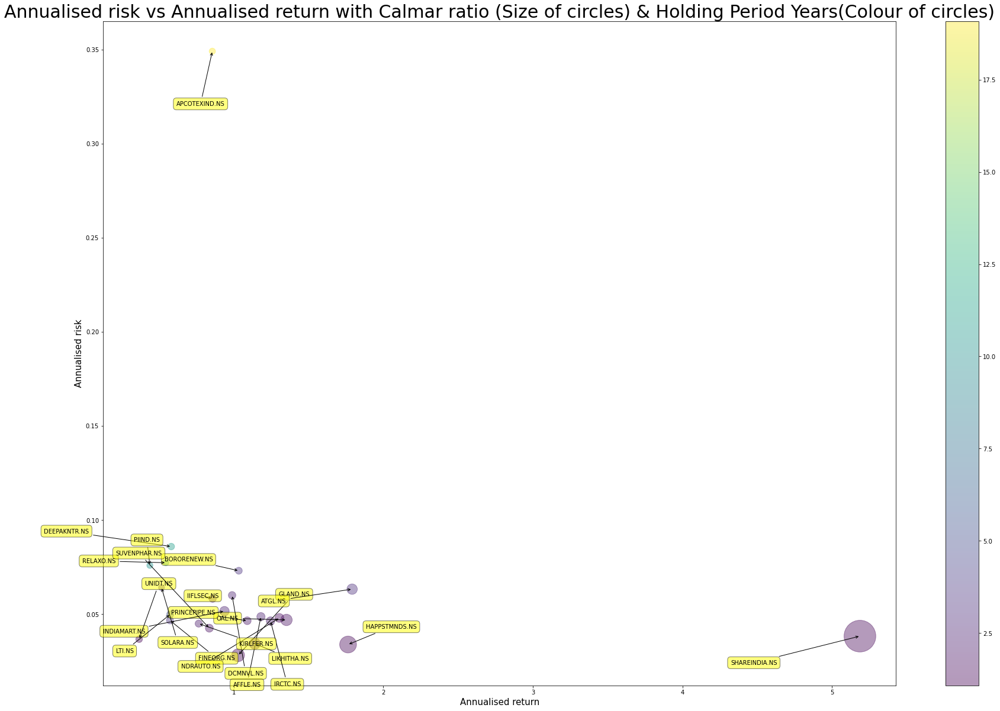

<Figure size 432x288 with 0 Axes>

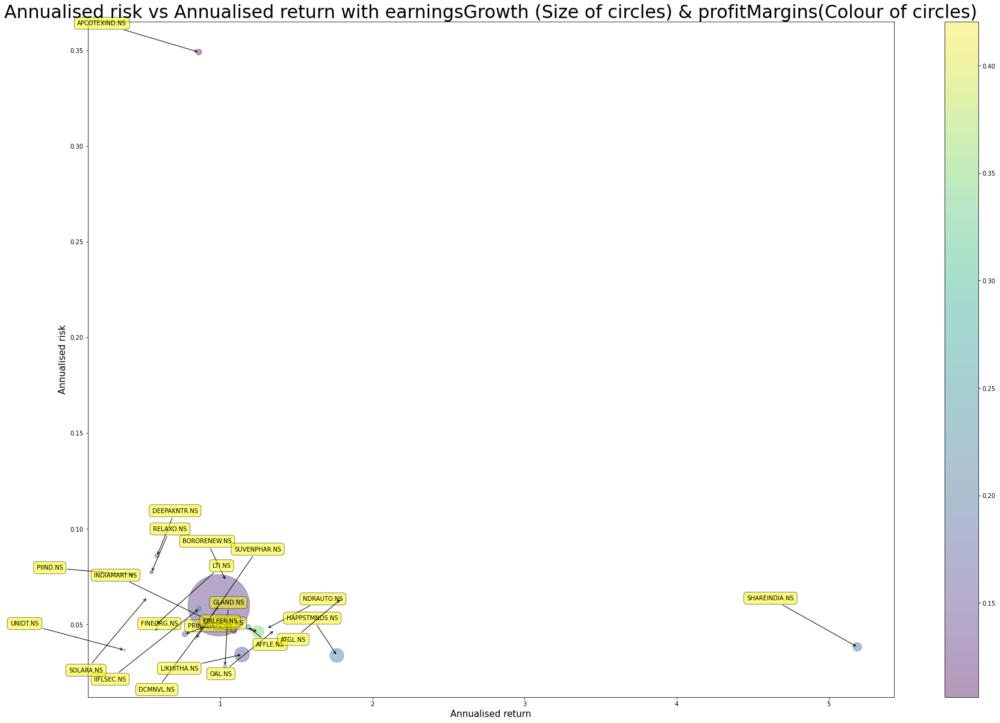

<Figure size 432x288 with 0 Axes>

In [28]:
def display_scatter_graph(data, x_param, y_param, colour_param, circle_size_param):
    #####################################################################
    ############ plt.scatter NOT EFFICIENT FOR large dataset ############ 
    #####################################################################
    rets = data #.dropna()#.sort_values(by=["Average drawdown", 'Max drawdown'])

    labels = rets.index

    rng = np.random.RandomState(0)
    colors = rng.rand(100)
    title = y_param + " vs " + x_param + " with " + circle_size_param + " (Size of circles) & " + colour_param +  "(Colour of circles)"
    fig=plt.figure(figsize=(30,20))
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=30)
    plt.subplots_adjust(bottom = 0.1)
    colors[:len(rets.index)]
    plt.scatter(
    #    data[:, 0], data[:, 1], marker='o', c=data[:, 2], s=data[:, 3] * 1500,
        #rets["Annualised return"], rets["Annualised risk"], marker='o', c=colors[:len(rets.index)], alpha=0.8, s=rets["Calmar ratio"]*50, cmap='viridis')
        rets[x_param], rets[y_param], marker='o', c=rets[colour_param], alpha=0.4, s=rets[circle_size_param]*100, cmap='viridis')
    #    cmap=plt.get_cmap('Spectral'))
    plt.colorbar();  # show color scale

    for label, x, y in zip(labels, rets[x_param], rets[y_param]):
        # plt.annotate(
        #     label,
        #     xy=(x, y), xytext=(-20, 20),
        #     textcoords='offset points', ha='right', va='bottom',
        #     bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
        #     arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
        plt.annotate(
            label,
            xy=(x, y), xytext=(random.randint(-150, 150), random.randint(-150, 150)),
            textcoords='offset points', ha='right', va='bottom',
            bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
            arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
    plt.show()

    #fig.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


data_directory
file = 'gsm_asm_groupby_sector_sorted_all_ratios.csv'
gsm_asm_groupby_sector_sorted_all_ratios = pd.DataFrame()

if (os.path.exists(data_directory + file)):
    #print('Reading from local file. Path:' + data_directory + i + '_info.csv')
    gsm_asm_groupby_sector_sorted_all_ratios = pd.read_csv(data_directory + file, sep = ',', index_col=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
else:
    print("File does not exist!!")

pd.set_option('display.max_columns', 500)
#gsm_asm_groupby_sector_sorted_all_ratios.head()

result = gsm_asm_groupby_sector_sorted_all_ratios

good = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1)] #&
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]
#good
len(good.index)


display_scatter_graph(good, "Annualised return", "Annualised risk", "Holding Period Years", "Calmar ratio")

display_scatter_graph(good, "Annualised return", "Annualised risk", "profitMargins", "earningsGrowth")


Index(['OAL.NS', 'PRINCEPIPE.NS', 'FINEORG.NS', 'DEEPAKNTR.NS',
       'APCOTEXIND.NS', 'PIIND.NS', 'INDIAMART.NS', 'AFFLE.NS', 'NDRAUTO.NS',
       'DCMNVL.NS', 'BORORENEW.NS', 'RELAXO.NS', 'LIKHITHA.NS', 'UNIDT.NS',
       'SHAREINDIA.NS', 'IIFLSEC.NS', 'GLAND.NS', 'SUVENPHAR.NS', 'SOLARA.NS',
       'IRCTC.NS', 'KIRLFER.NS', 'HAPPSTMNDS.NS', 'LTI.NS', 'ATGL.NS'],
      dtype='object')

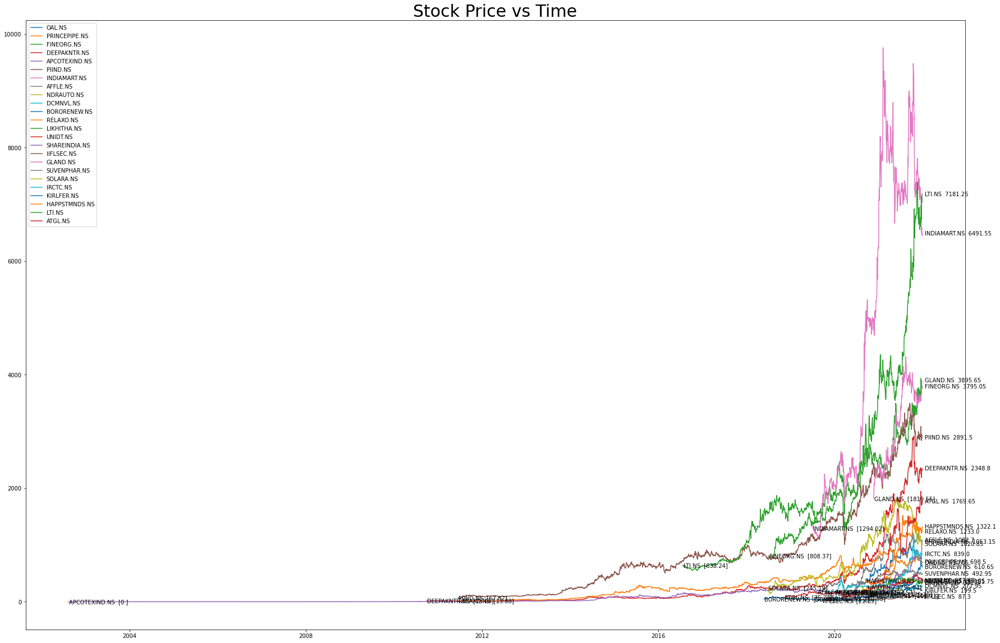

In [29]:
def display_annotated_stock_price(df_all_stock_price, title):
    fig, ax = plt.subplots(1, 1, figsize=(30, 20))
    ax.plot(df_all_stock_price.index ,df_all_stock_price)

    no_of_rows, no_of_columns = df_all_stock_price.shape
    plt.legend(labels=df_all_stock_price.columns)
    plt.title(title, fontsize=30)

    for i in df_all_stock_price.head(1).columns:
        df_cln = clean_dataset(pd.DataFrame(df_all_stock_price[i]))
        txt = i + "  " + str((df_cln.head(1).values[0]).round(2))
        ax.annotate(xy=(df_cln.head(1).index, df_cln.head(1)[i]), xytext=(1,0), textcoords='offset points', text=txt, va='center')

    for i in df_all_stock_price.tail(1).columns:
        txt = i + "  " + str((df_all_stock_price[i].tail(1).values[0]).round(2))
        ax.annotate(xy=(df_all_stock_price.tail(1).index, df_all_stock_price.tail(1)[i]), xytext=(5,0), textcoords='offset points', text=txt, va='center')

    return

#df_adj_close_percent_change, df_all_stock_price, bad_tickers = get_ticker_adj_close_price_and_percent_change(start, end, labels)

good.index

display_annotated_stock_price(df_all_stock_price[good.index], 'Stock Price vs Time')

Date,2021-12-27
SHAREINDIA.NS,1.000000
LTI.NS,0.968472
FINEORG.NS,0.956204
ATGL.NS,0.906097
AFFLE.NS,0.871633
RELAXO.NS,0.857368
BORORENEW.NS,0.838756
HAPPSTMNDS.NS,0.833981
GLAND.NS,0.831538
NDRAUTO.NS,0.826352


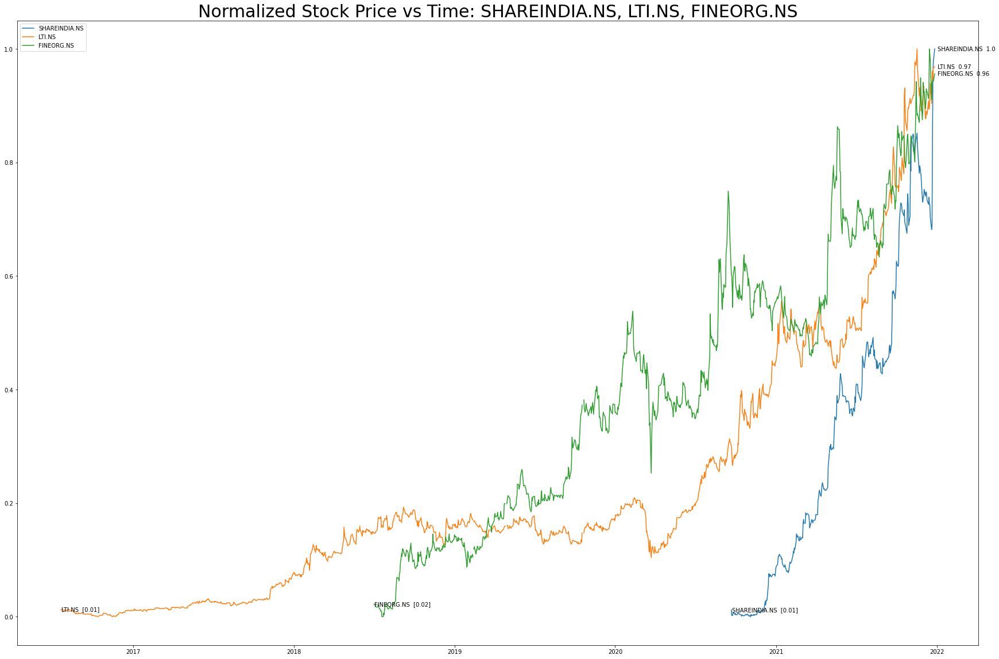

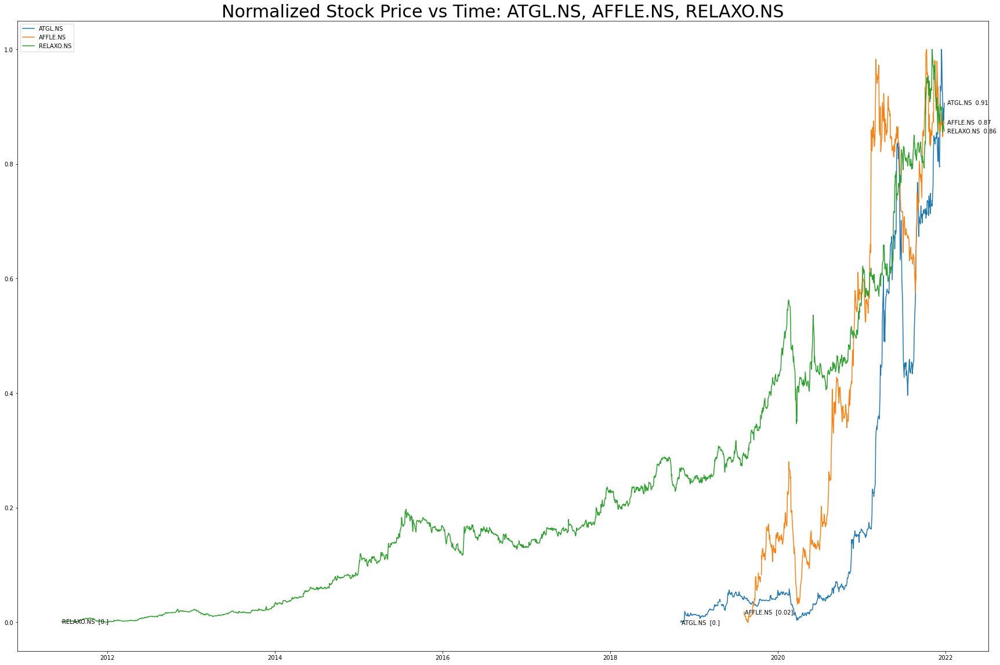

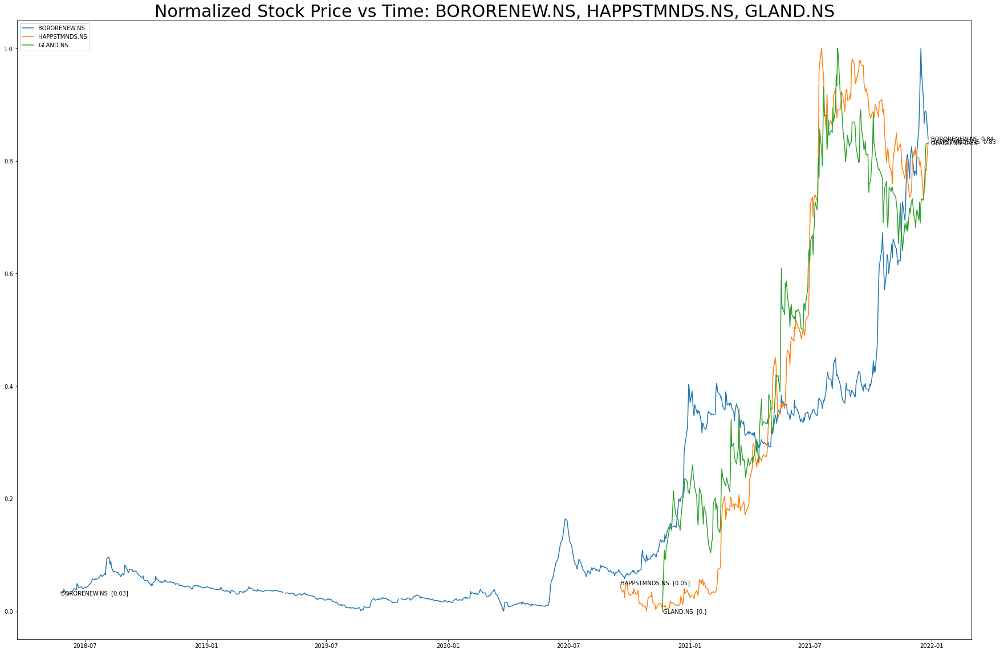

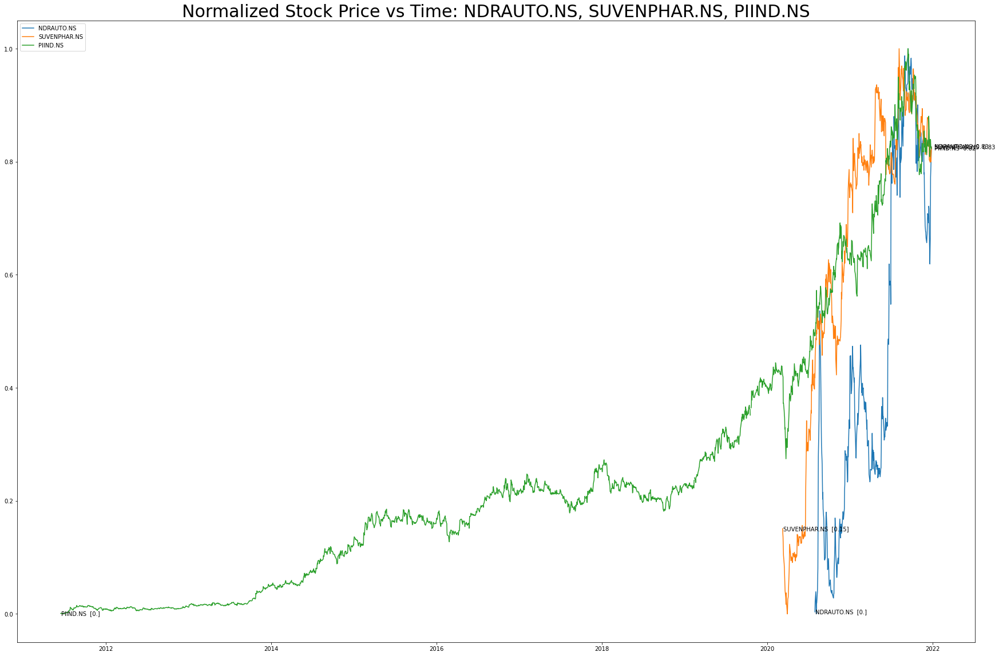

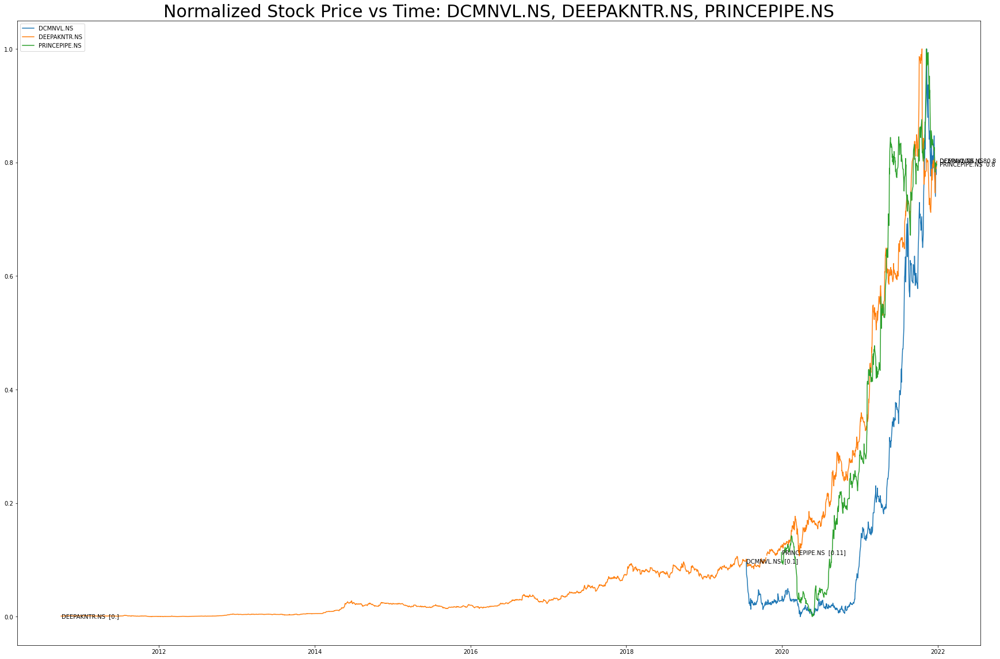

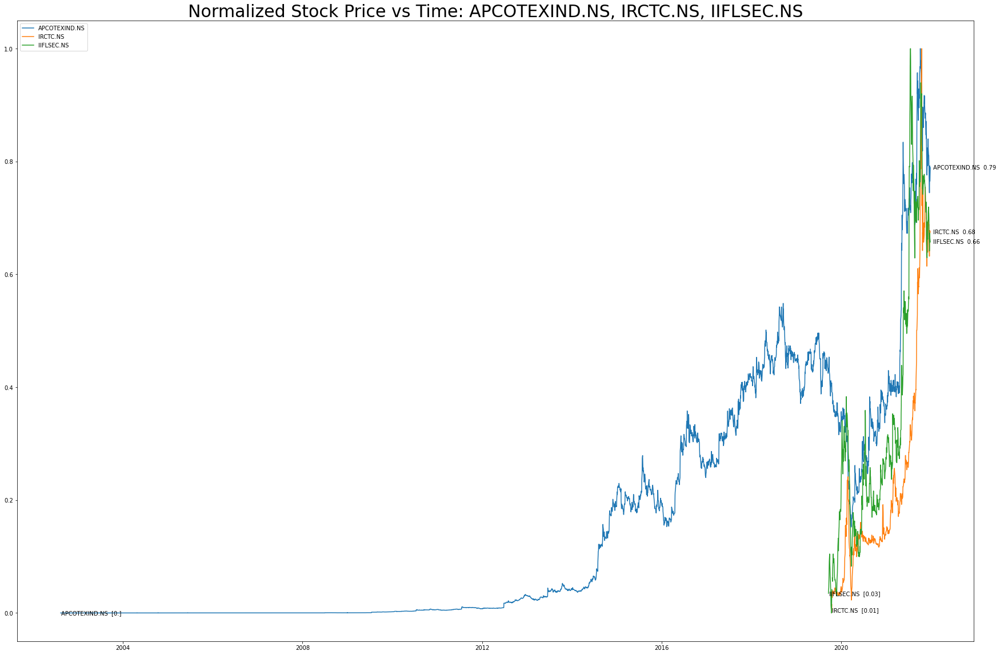

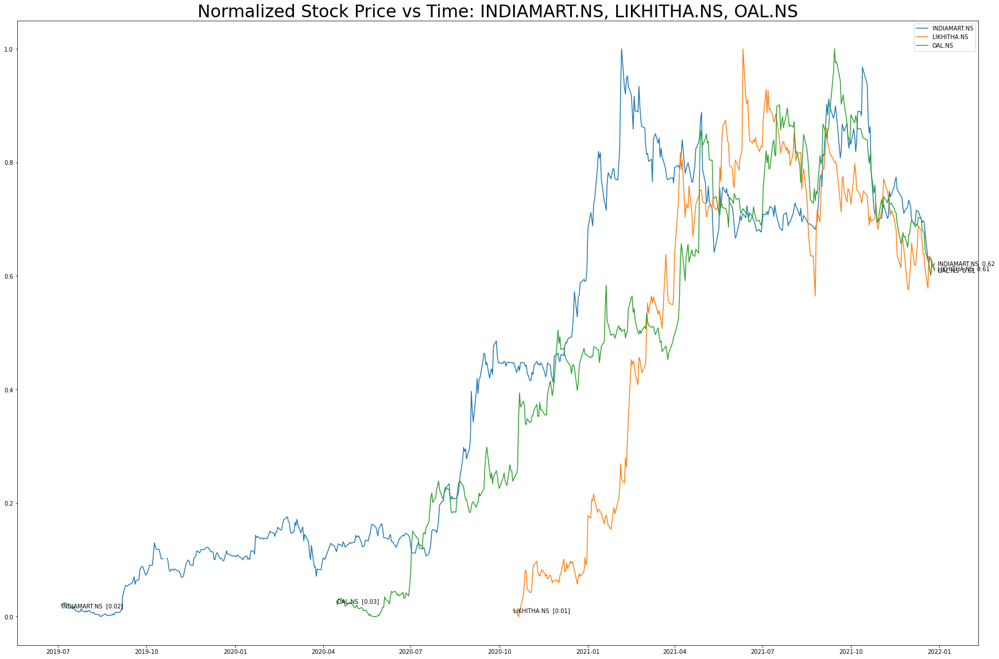

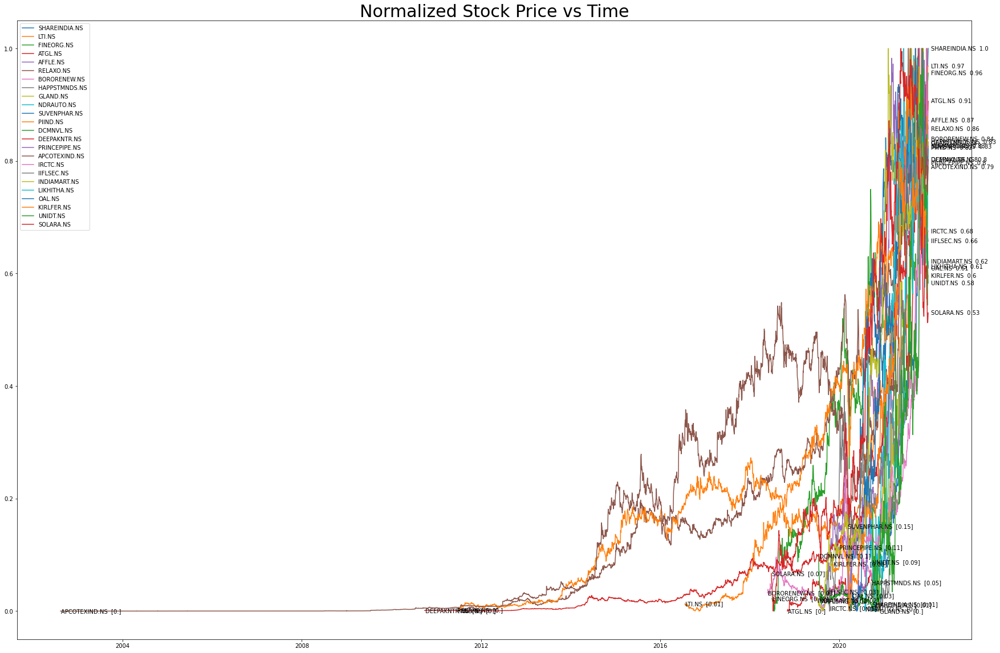

In [30]:
def normalize_data(df):
    # df on input should contain only one column with the price data (plus dataframe index)
    min = df.min()
    max = df.max()
    x = df 
    
    # time series normalization part
    # y will be a column in a dataframe
    y = (x - min) / (max - min)
    return y

df_all_stock_price_normalized = normalize_data(df_all_stock_price[good.index])
no_of_rows, no_of_columns =  df_all_stock_price_normalized.shape
df_all_stock_price_normalized_wo_index = df_all_stock_price_normalized.reset_index(inplace = False, drop = True)
last_day = df_all_stock_price_normalized_wo_index.tail(1)
x = last_day.to_dict('r')

dct = {k: v for k, v in sorted(x[0].items(), key=lambda item: item[1], reverse=True)}
sorted_stock = list(dct.keys())

#df_all_stock_price_normalized.head()
df_all_stock_price_normalized_sorted = df_all_stock_price_normalized[sorted_stock]
df_all_stock_price_normalized_sorted.tail(1).T

no_of_stocks_per_graph = 3
start = 0
for j in np.arange(no_of_stocks_per_graph,len(sorted_stock),no_of_stocks_per_graph):
    t = df_all_stock_price_normalized_sorted.T[start:j].T
    display_annotated_stock_price(t, 'Normalized Stock Price vs Time: ' + ', '.join(pd.Series(t[start:j].columns.values).to_list()))
    start = j

display_annotated_stock_price(df_all_stock_price_normalized_sorted, 'Normalized Stock Price vs Time')

In [31]:
#sorted_all_ratios = sorted_all_ratios[["Annualised return", "Expected return[Equity Risk Premium based]", "Annualised risk", "Calmar ratio", "Sterling ratio", "Sortino ratio", 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Max drawdown", "Average drawdown", "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", "Semideviation"]]
#sorted_all_ratios = sorted_all_ratios.sort_values(by=['Calmar ratio', 'Sterling ratio', 'Sortino ratio', 'Sharpe ratio', 'Treynor ratio', "Jensen's alpha", "Information ratio", "Appraisal ratio", "Tracking error", "Idiosyncratic volatility [Unsystematic Risk]"], ascending=False)

too_good = result.loc[(result["Annualised return"] >= 0.3) & (result['Calmar ratio'] >= 1.0) & 
(result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000) & 
(result['debtToEquity(Ideally 0.3 or less)'] <= 40) & (result['HeldPercentInsiders'] >= 0.45) & (result['profitMargins'] > 0.1)] #&
#(result['Deviation from Ind PE'] <= 250) & (result['Deviation from Ind PB'] <= 250) ]

#too_good = result.loc[(result["Annualised return"] >= 0.5) & (result['Calmar ratio'] >= 3.0) & (result['Sharpe ratio'] >= 3.0) & (result['Holding Period Years'] >= 1.0) & (result['MarketCap'] >= 1000000000)]
too_good


,Sector,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
OAL.NS,Basic Materials,1.35317,1.686508,NaN,NaN,NaN,2.549182e+10,2.583751e+10,-0.635,NaN,757.00,3.758871,-156.070358,15.207486,27.801347,1.446856,1.257026,10.412044,10.044428,0.120246,0.346426,-0.008343,0.123,0.046838,259.099,0.9,0.125147,0.76010,0.00025,165.639,11.831,0.17038,0.10738,0.0020,NaN,24.991745,NaN,845.436,803.15780,0.003266,0.0899,12791.0,2998.0,1.50,2021-12-09,0.999118,Oriental Aromatics Limited manufactures and se...
PRINCEPIPE.NS,Basic Materials,1.09087,1.968254,NaN,Stage I,NaN,8.237123e+10,8.233071e+10,0.629,NaN,747.45,1.737307,-75.238045,10.819920,22.406725,1.155411,0.994726,9.419696,8.693667,0.105068,0.598553,-0.013821,0.123,0.046409,218.426,0.9,0.114420,0.70567,0.15693,100.886,14.475,0.25646,0.10735,0.0057,NaN,37.094296,1.807576,755.923,644.71576,0.004712,0.0723,370060.0,41060.0,4.00,2021-09-07,NaN,Prince Pipes and Fittings Limited manufactures...
FINEORG.NS,Basic Materials,0.57406,3.408730,NaN,NaN,NaN,1.142385e+11,8.703735e+10,-0.075,NaN,3717.95,1.408888,-29.050830,5.415594,11.226921,0.747229,0.487948,5.736489,5.592822,0.082437,0.371257,-0.018005,0.107,0.046590,369.661,0.7,0.087245,0.75000,0.16991,238.571,13.130,0.17823,0.10618,0.0021,NaN,94.724840,NaN,3412.596,2973.70000,0.001627,0.0764,44550.0,3544.0,6.00,2021-08-17,-0.039307,Fine Organic Industries Limited manufactures a...
DEEPAKNTR.NS,Basic Materials,0.58283,10.996032,NaN,NaN,NaN,3.027379e+11,2.945339e+11,0.494,NaN,2219.60,1.244281,-7.312496,2.865800,6.195795,0.759757,0.496718,5.590776,5.542319,0.086154,0.427420,-0.072729,0.107,0.085837,433.006,0.7,0.089623,0.49104,0.16506,207.362,14.478,0.45569,0.18011,0.0020,NaN,39.022503,1.545944,2439.908,2007.08850,0.002092,0.0000,988027.0,1071567.0,4.50,2021-07-20,0.935455,Deepak Nitrite Limited manufactures and sells ...
APCOTEXIND.NS,Basic Materials,0.85734,19.091270,NaN,NaN,NaN,1.882017e+10,1.832936e+10,0.915,NaN,362.60,1.115935,-4.588795,2.741229,2.310084,1.007925,0.766212,3.909921,3.899342,0.193400,0.722569,-0.175719,0.115,0.349052,150.233,0.8,0.196498,0.60362,0.00014,67.992,10.299,0.27048,0.10681,0.0104,NaN,42.573677,1.021589,399.543,313.18200,0.009729,0.2495,97721.0,52213.0,3.50,2021-07-01,0.828028,Apcotex Industries Limited produces and sells ...
PIIND.NS,Basic Materials,0.43988,10.293651,NaN,NaN,NaN,4.480464e+11,4.257982e+11,0.037,2246.483748,2953.25,1.059929,-8.297728,2.366253,5.128079,0.648133,0.358784,4.250586,4.388762,0.079688,0.366893,-0.046866,0.099,0.075833,323.984,0.6,0.081751,0.47088,0.30397,355.368,6.069,0.14735,0.16140,0.0017,35.53,59.195230,NaN,3026.450,2845.72580,0.001699,0.0957,353567.0,416036.0,5.00,2021-09-07,0.524900,PI Industries Limited manufactures and distrib...
INDIAMART.NS,Communication Services,0.93846,2.436508,NaN,NaN,NaN,2.240465e+11,1.943674e+11,0.135,NaN,7367.60,2.591608,-56.812180,8.466344,17.231845,1.267800,0.852348,7.668451,7.508018,0.109188,0.342436,-0.015621,0.107,0.051501,237.024,0.7,0.113525,0.55174,0.25773,543.715,3.942,NaN,0.42057,0.0021,NaN,77.898080,NaN,7949.318,7732.15200,0.002023,0.0000,107721.0,40086.0,15.00,2021-08-23,0.839498,IndiaMART InterMESH Limited operates an online...
AFFLE.NS,Communication Services,1.18240,2.337302,NaN,N

,ATGL.NS,LTI.NS,GLAND.NS,PIIND.NS,RELAXO.NS,DEEPAKNTR.NS,INDIAMART.NS,HAPPSTMNDS.NS,IRCTC.NS,SUVENPHAR.NS,FINEORG.NS,PRINCEPIPE.NS,BORORENEW.NS,SOLARA.NS,AFFLE.NS,KIRLFER.NS,IIFLSEC.NS,SHAREINDIA.NS,OAL.NS,APCOTEXIND.NS,UNIDT.NS,LIKHITHA.NS,DCMNVL.NS,NDRAUTO.NS
MarketCap,182321.007821,121737.235661,59746.779136,44804.639949,31822.102528,30273.788314,22404.651418,17909.329101,13152.319078,12679.882342,11423.847219,8237.123174,7846.574490,4281.589350,3007.655117,2789.619917,2681.151898,2587.262362,2549.182259,1882.017382,846.401075,677.801062,519.613645,189.145715
enterpriseValue,179198.872781,117883.496038,56614.453248,42579.820544,29461.341798,29453.392282,19436.737331,16667.426816,62996.905984,12609.683456,8703.734579,8233.071411,5287.515341,6369.524531,10498.365030,2944.627507,2676.096819,2164.260250,2583.750861,1832.936243,1223.415706,628.904448,564.258253,140.037082


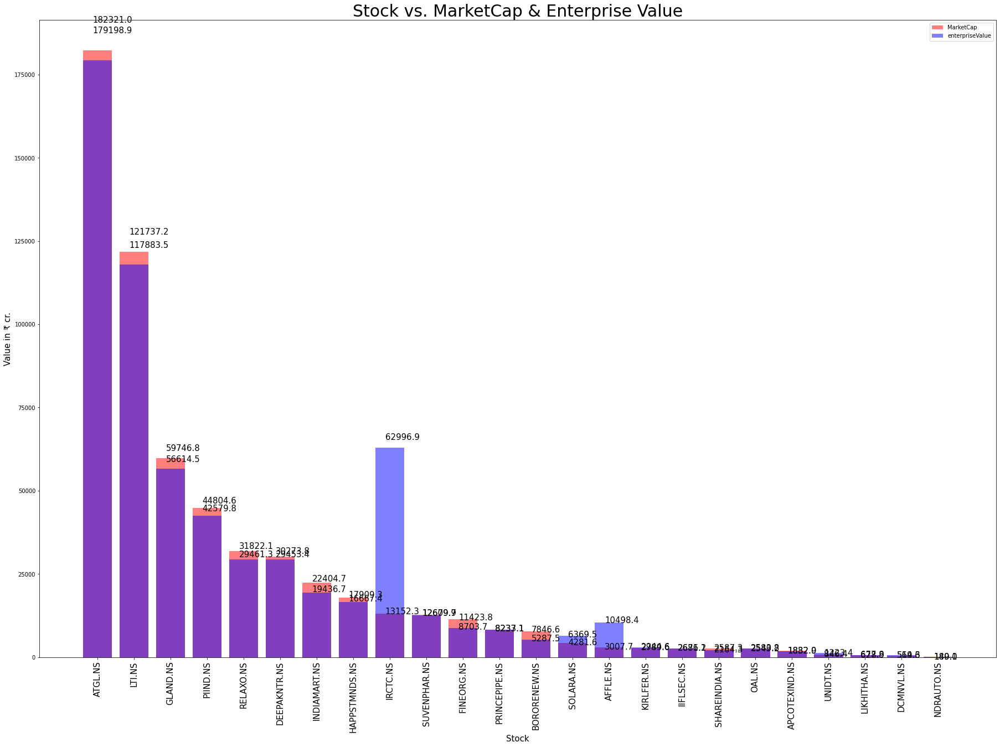

In [32]:
# xtick_parm1, xtick_parm2 are columns names within dataframe data
def display_bar_graph_two_parameters(data, xtick_parm1, xtick_parm2, xlabel, ylabel, title):
    xticks = data.columns

    fig=plt.figure(figsize=(24,16))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel(xlabel, fontsize=15)
    plt.ylabel(ylabel, fontsize=15)
    plt.title(title, fontsize=30)
    plt.xticks(range(len(xticks)), xticks, rotation='vertical', fontsize=15)
    #plt.scatter(range(len(rets.columns)), rets.loc["Calmer Ratio", : ], s=area)

    ax.bar(range(len(xticks)), data.loc[xtick_parm1], color='r', alpha=0.5)
    ax.bar(range(len(xticks)), data.loc[xtick_parm2], color='b', alpha=0.5)
    #ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

    # Annotate Text
    for i, ar in enumerate(data.loc[xtick_parm1]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)


    for i, ar in enumerate(data.loc[xtick_parm2]):
        if (ar > 0):
            ax.text(i-0.125, ar + (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        elif (ar < 0):
            ax.text(i-0.125, ar - (ar * 0.05), round(ar, 1), verticalalignment='center', fontsize=15)
        else:
            ax.text(i-0.125, ar, round(ar, 2), verticalalignment='center', fontsize=15)

    #p1 = patches.Rectangle((.57, -0.005), width=.33, height=.13, alpha=.1,  angle=0.0, facecolor='red', label="red", transform=fig.transFigure)
    #p2 = patches.Rectangle((.124,-0.005), width=.446, height=.13, alpha=.1,  angle=0.0, facecolor='green', label="green", transform=fig.transFigure)
    #fig.add_artist(p1)
    #fig.add_artist(p2)

    ax.legend(labels=[xtick_parm1, xtick_parm2])
    plt.savefig(data_directory + title + ".svg")

    return

title = "Stock vs. MarketCap & Enterprise Value"

#rets = sorted_all_ratios.dropna().sort_values(by=['Annualised return'], ascending=False)
rets = too_good[['MarketCap', 'enterpriseValue']].sort_values(by=['MarketCap'], ascending=False)
rets = np.divide(rets, 10000000)
rets = rets.T
rets

display_bar_graph_two_parameters(rets, 'MarketCap', 'enterpriseValue', "Stock", "Value in ₹ cr.", title)

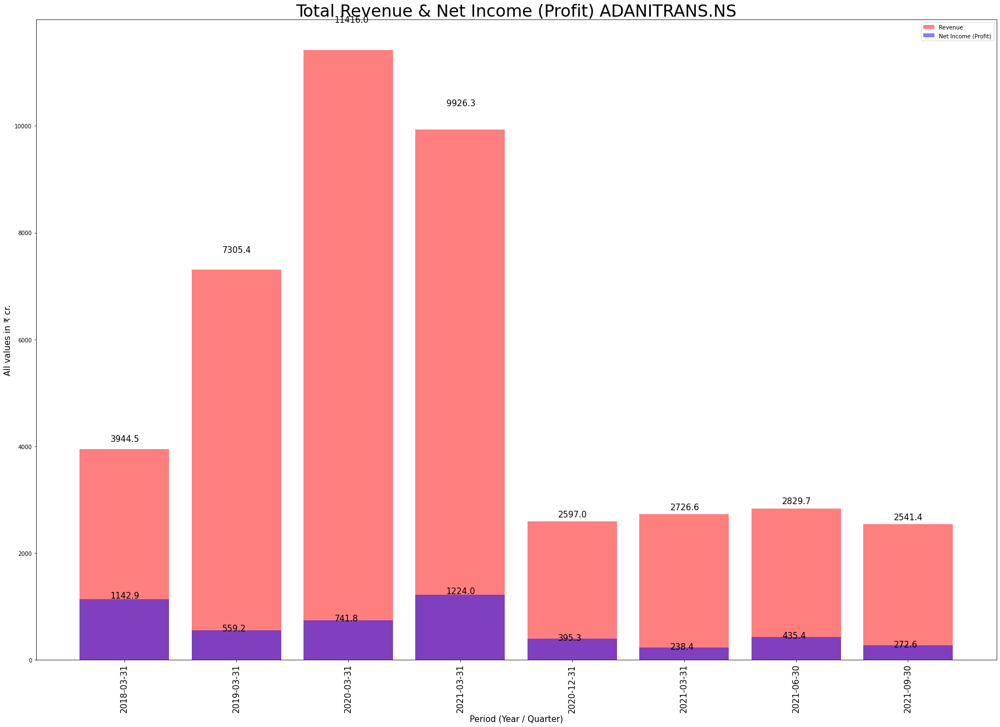

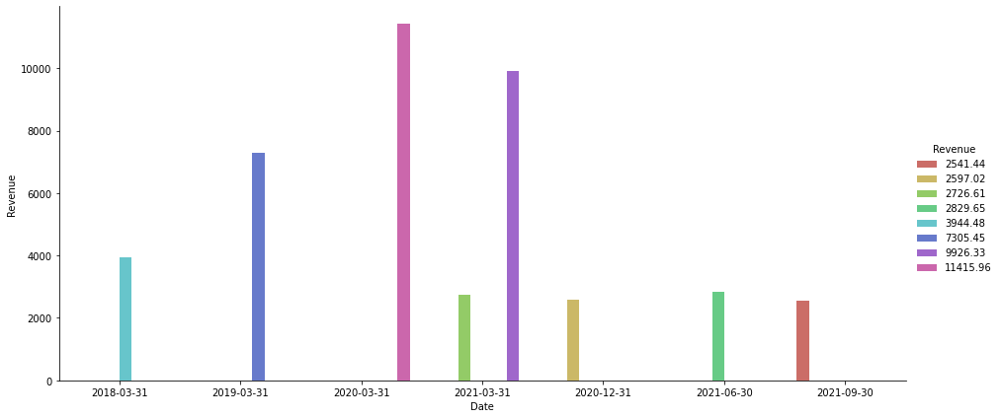

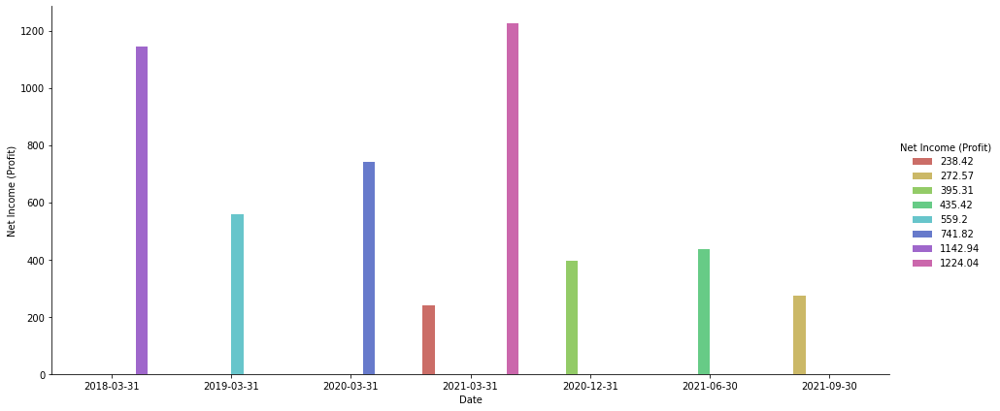

In [33]:
import seaborn as sns

def get_financial(stock):
    if (os.path.exists(data_directory + stock + '_financials.csv')):
        financial_yearly = pd.read_csv(data_directory + stock + '_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial_quarterly = pd.read_csv(data_directory + stock + '_quarterly_financials.csv', sep = ',', index_col=0, header=0).sort_index(axis=1) # pointing the header to row# 0 assigns column name information to be parsed from the top row.
        financial = pd.concat([financial_yearly, financial_quarterly], axis=1)
        financial = financial.T

        financial.rename(columns = {'Total Revenue':'Revenue'}, inplace = True)
        financial.rename(columns = {'Net Income':'Net Income (Profit)'}, inplace = True)
        financial = financial[['Revenue', 'Net Income (Profit)']].T
    else:
        print("File does not exist!!")
    
    return financial


title = "Total Revenue & Net Income (Profit)"

for i in ['ADANITRANS.NS']: #too_good.index[:1]:
    financial  = get_financial(i).divide(10000000) #Convert into crore

    display_bar_graph_two_parameters(financial, 'Revenue', 'Net Income (Profit)', 'Period (Year / Quarter)', 'All values in ₹ cr.', title + " " + i)

    financial = financial.T.reset_index()
    financial.columns = ["Date", "Revenue", "Net Income (Profit)"]
    sns.catplot(x='Date', y='Revenue', hue='Revenue', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')
    sns.catplot(x='Date', y='Net Income (Profit)', hue='Net Income (Profit)', data=financial, kind='bar', height=6, aspect=13/6, legend=True, palette='hls')

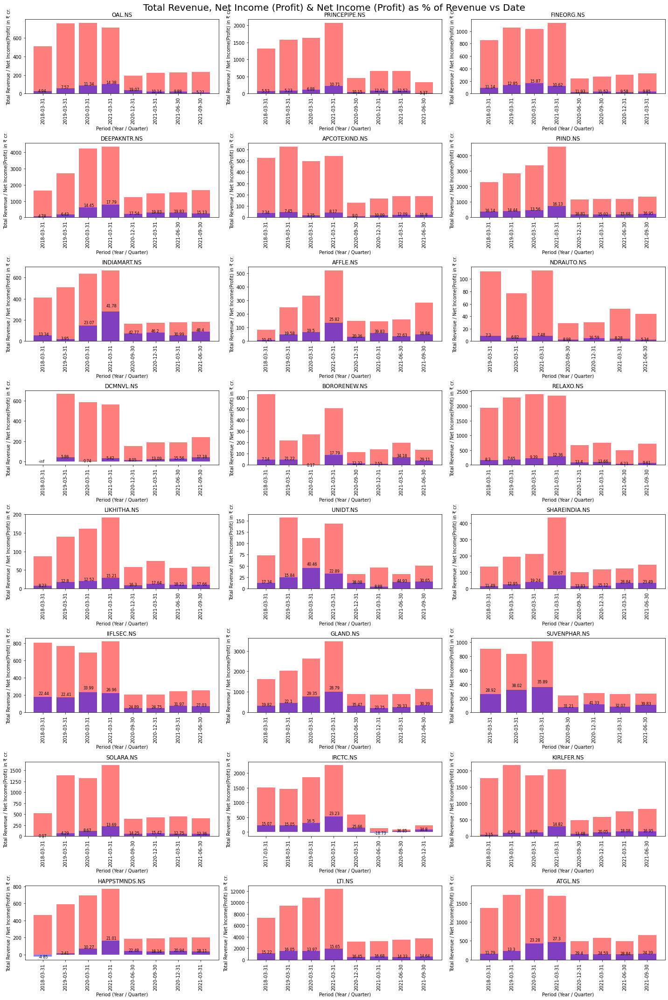

In [34]:

def display_multigrid_bar_graph(list_of_stocks, num_of_columns_in_subplot):
    length = len(list_of_stocks)
    length

    num_of_columns_in_subplot
    num_of_rows_in_subplot = math.ceil(length / num_of_columns_in_subplot)
    num_of_rows_in_subplot

    fig, ax_lst = plt.subplots(num_of_rows_in_subplot, num_of_columns_in_subplot)  # a figure with a 2x2 grid of Axes
    fig.set_figheight(6 * 5)
    fig.set_figwidth(4 * 5)

    fig.suptitle('Total Revenue, Net Income (Profit) & Net Income (Profit) as % of Revenue vs Date', fontsize=20,  y=0.99 )  # add a overall title

    for i, v in enumerate(list_of_stocks):
        r= int(i/num_of_columns_in_subplot)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_title(list_of_stocks[i])
        financial  = get_financial(v).divide(10000000).T.reset_index() #Convert into crore
        percent_profit_of_revenue = ((financial['Net Income (Profit)'] / financial['Revenue']) * 100).round(2)
        #percent_profit_of_revenue
        financial = pd.concat([financial, percent_profit_of_revenue], axis=1)
        financial.columns = ["Date", "Revenue", "Net Income (Profit)", "Profit as % of revenue"]
        ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Revenue'])), financial['Revenue'], color='r', alpha=0.5)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].bar(range(len(financial['Net Income (Profit)'])), financial['Net Income (Profit)'], color='b', alpha=0.5)
        #g = sns.catplot(x='Date', y='Revenue', hue='Revenue', data=f, kind='bar', legend=True, palette='hls', ax=ax_lst[r,i-(num_of_columns_in_subplot*r)]) # pass ax

        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticks(range(len(financial['Date'])))
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set_xticklabels(financial['Date'], rotation='vertical', fontsize=10)
        ax_lst[r,i-(num_of_columns_in_subplot*r)].set(xlabel='Period (Year / Quarter)', ylabel='Total Revenue / Net Income(Profit) in ₹ cr.')

        # Annotate Text
        for y, profit_percentage in enumerate(financial['Net Income (Profit)']):
            ax_lst[r,i-(num_of_columns_in_subplot*r)].text(y-0.2, financial['Net Income (Profit)'][y] * 1.20, financial["Profit as % of revenue"][y], verticalalignment='center', fontsize=8)
        
    plt.tight_layout()




display_multigrid_bar_graph(too_good.index, 3)

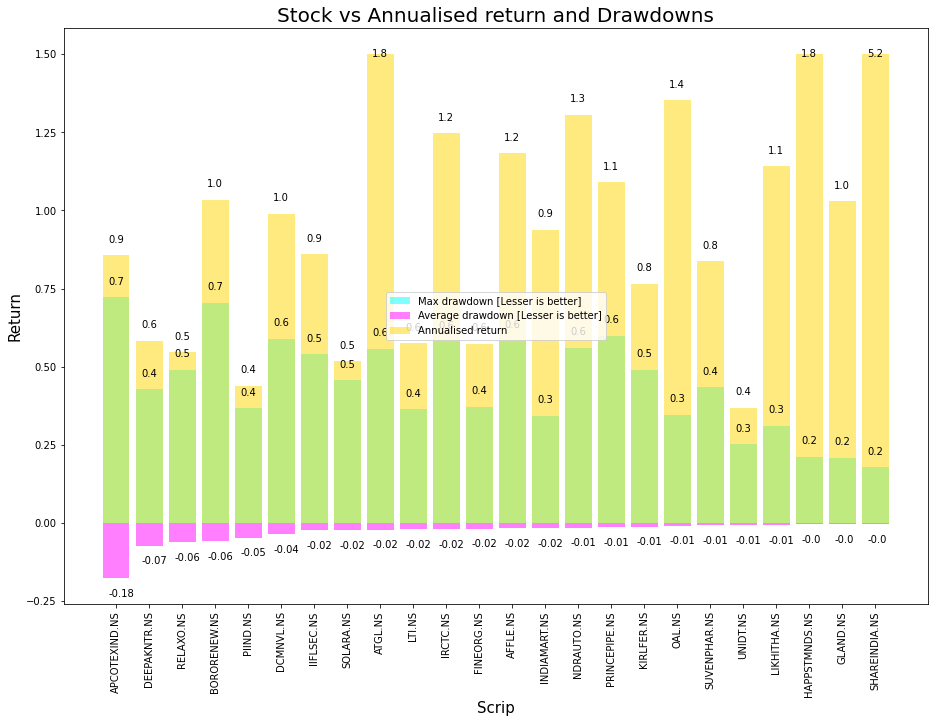

In [35]:


def add_annotate_text(y_axis_values, ax, lower_clip_limit=0, upper_clip_limit=100000):
    # # Annotate Text
    for i, ar in enumerate(y_axis_values):
        if (ar > 0.0):
            if (ar > upper_clip_limit):
                ax.text(i-0.25, upper_clip_limit, round(ar, 1), verticalalignment='center')
            else:
                ax.text(i-0.25, ar+0.05, round(ar, 1), verticalalignment='center')
        elif (ar < 0.0):
            if (ar > lower_clip_limit):
                ax.text(i-0.25, lower_clip_limit, round(ar, 2), verticalalignment='center')
            else:
                ax.text(i-0.25, ar-0.05, round(ar, 2), verticalalignment='center')
        else:
            ax.text(i-0.25, ar, round(ar, 2), verticalalignment='center')


def display_overlapping_multi_bar_graph(rets):
    title = "Stock vs Annualised return and Drawdowns"

    fig=plt.figure(figsize=(12,8))
    ax=fig.add_axes([0,0,1,1])
    plt.xlabel("Scrip", fontsize=15)
    plt.ylabel("Return", fontsize=15)
    plt.title(title, fontsize=20)
    plt.xticks(range(len(rets.columns)), rets.columns, rotation='vertical')

    ax.bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    add_annotate_text(rets.loc["Max drawdown", : ], ax)
    ax.bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)
    add_annotate_text(rets.loc["Average drawdown", : ], ax)
    lower_clip_limit = -0.5
    upper_clip_limit = 1.5
    ax.bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ], lower_clip_limit, upper_clip_limit), color='gold', alpha=0.5)
    add_annotate_text(rets.loc['Annualised return', : ], ax, lower_clip_limit, upper_clip_limit)


    ax.legend(labels=["Max drawdown [Lesser is better]", "Average drawdown [Lesser is better]", "Annualised return"],  loc='center' )
    plt.savefig(data_directory + title + ".svg")


rets = too_good[['Annualised return', 'Average drawdown', 'Max drawdown']].dropna().sort_values(by=["Average drawdown", 'Max drawdown'])
rets = rets.T
display_overlapping_multi_bar_graph(rets)


,Sector,Annualised return,Holding Period Years,GSM STAGE,LT ASM STAGE,ST ASM STAGE,MarketCap,enterpriseValue,earningsGrowth,pegRatio,CurrentPrice,Calmar ratio,Sterling ratio,Sortino ratio,Sharpe ratio,Treynor ratio,Jensen's alpha,Information ratio,Appraisal ratio,Tracking error,Max drawdown,Average drawdown,Expected return[Equity Risk Premium based],Annualised risk,RevenuePerShare,Beta [Systematic Risk],Idiosyncratic volatility [Unsystematic Risk],HeldPercentInsiders,HeldPercentInstitutions,bookValue,debtToEquity(Ideally 0.3 or less),returnOnEquity(Ideally > 20%),profitMargins,dividendYield,ForwardEPS,TrailingPE(CurrentPrice/TrailingEPS) Lower better,52WeekChange,fiftyDayAverage,TwoHundredDayAverage,TrailingAnnualDividendYield,PayoutRatio,AverageVolume10days,RegularMarketVolume,DividendRate,ExDividendDate,Beta from YF,longBusinessSummary
APCOTEXIND.NS,Basic Materials,0.85734,19.091270,NaN,NaN,NaN,1.882017e+10,1.832936e+10,0.915,NaN,362.60,1.115935,-4.588795,2.741229,2.310084,1.007925,0.766212,3.909921,3.899342,0.193400,0.722569,-0.175719,0.115,0.349052,150.233,0.8,0.196498,0.60362,0.00014,67.992,10.299,0.27048,0.10681,0.0104,NaN,42.573677,1.021589,399.543,313.1820,0.009729,0.2495,97721.0,52213.0,3.5,2021-07-01,0.828028,Apcotex Industries Limited produces and sells ...
DEEPAKNTR.NS,Basic Materials,0.58283,10.996032,NaN,NaN,NaN,3.027379e+11,2.945339e+11,0.494,NaN,2219.60,1.244281,-7.312496,2.865800,6.195795,0.759757,0.496718,5.590776,5.542319,0.086154,0.427420,-0.072729,0.107,0.085837,433.006,0.7,0.089623,0.49104,0.16506,207.362,14.478,0.45569,0.18011,0.0020,NaN,39.022503,1.545944,2439.908,2007.0885,0.002092,0.0000,988027.0,1071567.0,4.5,2021-07-20,0.935455,Deepak Nitrite Limited manufactures and sells ...
RELAXO.NS,Consumer Cyclical,0.54681,10.285714,NaN,NaN,NaN,3.182210e+11,2.946134e+11,0.278,307.315189,1280.65,1.009945,-7.961849,3.098511,6.418525,0.991620,0.470730,5.392676,5.654481,0.082640,0.490928,-0.062273,0.091,0.077247,100.325,0.5,0.083249,0.74660,0.10161,55.260,9.168,NaN,0.11967,0.0021,14.99,132.025770,NaN,1309.502,1110.2120,0.000000,0.0000,260038.0,122694.0,2.5,2021-08-17,0.252131,Relaxo Footwears Limited manufactures and sell...
BORORENEW.NS,Consumer Cyclical,1.03434,3.511905,NaN,NaN,NaN,7.846574e+10,5.287515e+10,NaN,NaN,602.85,1.395799,-17.260255,7.094412,13.472192,1.229175,0.943212,7.166583,6.992498,0.130213,0.704500,-0.056971,0.115,0.072990,47.933,0.8,0.134889,0.68506,0.00091,47.326,9.996,NaN,0.22442,NaN,NaN,79.742060,NaN,444.382,318.7480,NaN,0.0000,1402649.0,141354.0,NaN,2019-12-18,2.757602,Borosil Renewables Limited engages in the manu...
PIIND.NS,Basic Materials,0.43988,10.293651,NaN,NaN,NaN,4.480464e+11,4.257982e+11,0.037,2246.483748,2953.25,1.059929,-8.297728,2.366253,5.128079,0.648133,0.358784,4.250586,4.388762,0.079688,0.366893,-0.046866,0.099,0.075833,323.984,0.6,0.081751,0.47088,0.30397,355.368,6.069,0.14735,0.16140,0.0017,35.53,59.195230,NaN,3026.450,2845.7258,0.001699,0.0957,353567.0,416036.0,5.0,2021-09-07,0.524900,PI Industries Limited manufactures and distrib...


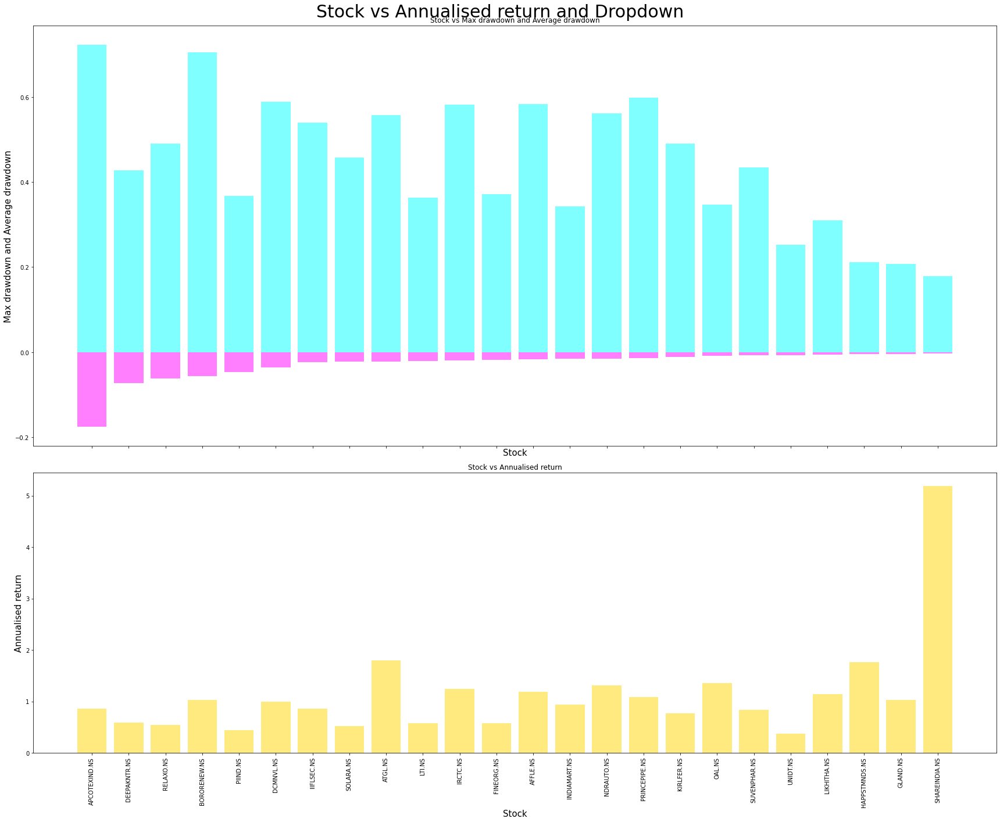

In [36]:
#color='rgbycmk'
#ax.set_color_cycle(colors)

def display_hortzontal_subplots(rets):
    # using subplot function and creating plot one
    # row 2, column 1, count 1
    fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, sharey=False, gridspec_kw={'height_ratios':[3,2]}, figsize=(24,20))
    fig.suptitle("Stock vs Annualised return and Dropdown", fontsize=30)
    #ax[0].plot(x, y, color='red')
    #ax[1].plot(x, y, color='blue')
    plt.gca().set_xlabel('Stock', fontsize=15)
    ax[0].set_xticks(range(len(rets.columns)))
    ax[0].set_xticklabels(rets.columns, rotation='vertical')
    ax[0].title.set_text('Stock vs Max drawdown and Average drawdown')
    ax[0].set_xlabel('Stock', fontsize=15)
    ax[0].set_ylabel('Max drawdown and Average drawdown', fontsize=15)
    ax[0].bar(range(len(rets.columns)), rets.loc["Max drawdown", : ], color='aqua', alpha=0.5)
    ax[0].bar(range(len(rets.columns)), rets.loc["Average drawdown", : ], color='magenta', alpha=0.5)

    ax[1].set_xticks(range(len(rets.columns)))
    ax[1].set_xticklabels(rets.columns, rotation='vertical')
    ax[1].title.set_text('Stock vs Annualised return')
    ax[1].set_xlabel('Stock', fontsize=15)
    ax[1].set_ylabel('Annualised return', fontsize=15)
    ax[1].bar(range(len(rets.columns)), np.clip(rets.loc["Annualised return", : ],-100, 150 ), color='gold', alpha=0.5)

    plt.subplots_adjust(left=1,
                        bottom=0.8, 
                        right=2, 
                        top=1, 
                        wspace=1,
                        hspace=1)
    fig.tight_layout()
    
    # show plot
    plt.show()

rets = too_good.sort_values(by=["Average drawdown", 'Max drawdown'])
rets.head()
rets = rets.T
display_hortzontal_subplots(rets)

Text(0.5, 0, 'Stock')

Text(0, 0.5, 'Risks')

Text(0.5, 1.0, 'Stock vs Systematic and Unsystematic Risks')

([<matplotlib.axis.XTick at 0xffff15bc8430>,
 [Text(0.6, 0, 'OAL.NS'),
  Text(2.6, 0, 'PRINCEPIPE.NS'),
  Text(4.6, 0, 'FINEORG.NS'),
  Text(6.6, 0, 'DEEPAKNTR.NS'),
  Text(8.6, 0, 'APCOTEXIND.NS'),
  Text(10.6, 0, 'PIIND.NS'),
  Text(12.6, 0, 'INDIAMART.NS'),
  Text(14.6, 0, 'AFFLE.NS'),
  Text(16.6, 0, 'NDRAUTO.NS'),
  Text(18.6, 0, 'DCMNVL.NS'),
  Text(20.6, 0, 'BORORENEW.NS'),
  Text(22.6, 0, 'RELAXO.NS'),
  Text(24.6, 0, 'LIKHITHA.NS'),
  Text(26.6, 0, 'UNIDT.NS'),
  Text(28.6, 0, 'SHAREINDIA.NS'),
  Text(30.6, 0, 'IIFLSEC.NS'),
  Text(32.6, 0, 'GLAND.NS'),
  Text(34.6, 0, 'SUVENPHAR.NS'),
  Text(36.6, 0, 'SOLARA.NS'),
  Text(38.6, 0, 'IRCTC.NS'),
  Text(40.6, 0, 'KIRLFER.NS'),
  Text(42.6, 0, 'HAPPSTMNDS.NS'),
  Text(44.6, 0, 'LTI.NS'),
  Text(46.6, 0, 'ATGL.NS')])

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

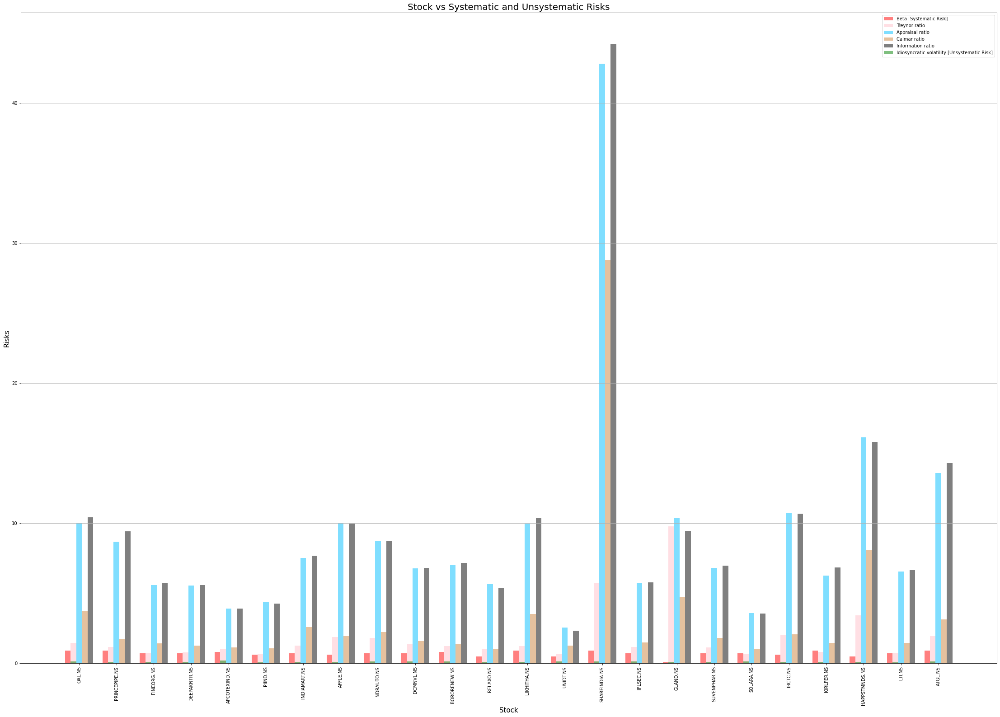

<Figure size 432x288 with 0 Axes>

In [50]:
#index = ["Annualised return", "Expected return", "Annualised risk", "Sharpe ratio", "Beta [Systematic Risk]", 
#        "Treynor ratio", "Jensen's alpha", "Tracking error", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]", "Appraisal ratio", 
#        "Semideviation", "Max drawdown", "Average drawdown", "Sortino ratio", "Calmar ratio", "Sterling ratio"]

title = "Stock vs Systematic and Unsystematic Risks"

#rets = sorted_all_ratios.dropna()
rets = too_good
bar_width=0.3

X = np.arange(len(rets.index.values))
fig=plt.figure(figsize=(30,20))
ax=fig.add_axes([0,0,1,1])
plt.xlabel("Stock", fontsize=15)
plt.ylabel("Risks", fontsize=15)
plt.title(title, fontsize=20)
plt.xticks(X+range(len(rets.index.values))+(bar_width*2), rets.index.values, rotation='vertical')

# ax.bar(X + range(len(rets.columns))+0.0, rets.loc["Beta [Systematic Risk]", : ], color='r', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*1), rets.loc["Treynor ratio", : ], color='pink', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*2), rets.loc["Appraisal ratio", : ], color='deepskyblue', alpha=0.5, width=bar_width)
# ax.bar(X + range(len(rets.columns))+(bar_width*3), rets.loc["Semideviation", : ], color='lawngreen', alpha=0.5, width=bar_width)

ax.bar(X + range(len(rets.index.values))+0.0, rets["Beta [Systematic Risk]"], color='r', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Treynor ratio"], color='pink', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Appraisal ratio"], color='deepskyblue', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*3), rets["Calmar ratio"], color='peru', alpha=0.5, width=bar_width)
ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets["Information ratio"], color='black', alpha=0.5, width=bar_width)

ax.bar(X + range(len(rets.index.values))+(bar_width*1), rets["Idiosyncratic volatility [Unsystematic Risk]"], color='g', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*2), rets["Annualised return"], color='b', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*4), rets.loc["Jensen's alpha", : ], color='aqua', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*5), rets.loc["Tracking error", : ], color='grey', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*7), rets["Annualised return"], color='orange', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*8), rets.loc["Expected return", : ], color='lawngreen', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*9), rets["Annualised risk"], color='peru', alpha=0.5, width=bar_width)
#ax.bar(X + range(len(rets.index.values))+(bar_width*10), rets.loc["Information ratio", : ], color='black', alpha=0.5, width=bar_width)

plt.legend(labels=["Beta [Systematic Risk]", "Treynor ratio", "Appraisal ratio", "Calmar ratio", "Information ratio", "Idiosyncratic volatility [Unsystematic Risk]"])
plt.grid(axis = 'y')
plt.show()
plt.savefig(data_directory + title + ".svg")

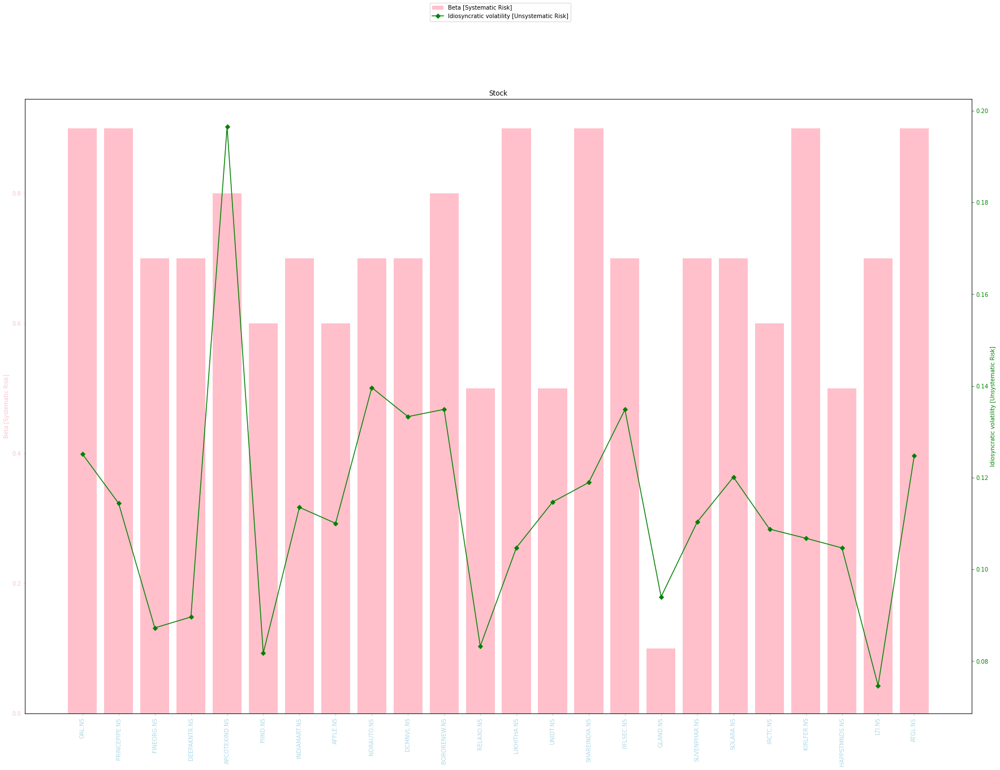

<Figure size 432x288 with 0 Axes>

In [49]:
def graph_with_two_y_axes(rets, x_param, y_param1, y_param2, title, color1, color2):
    #create basic bar plot
    fig, ax = plt.subplots()
    ax.bar(range(len(rets.columns)), rets.loc[y_param1, : ], color=color1)
    fig.set_figheight(20)
    fig.set_figwidth(30)

    # Set the ticks and ticklabels for all axes
    plt.setp(ax, xticks=range(len(x_param)), xticklabels= x_param, )
    ax.set_title('Stock')
    ax.set_xticks(range(len(x_param)), )
    ax.set_xticklabels(x_param)
    for tick in ax.get_xticklabels():
        tick.set_rotation(90)
    ax.tick_params(axis='x', colors='lightblue')
    ax.set_ylabel(y_param1)
    #specify axis colors
    ax.tick_params(axis='y', colors=color1)
    ax.yaxis.label.set_color(color1)

    ax2 = ax.twinx()
    ax2.plot(range(len(x_param)), rets.loc[y_param2, :], color=color2, marker="D", ms=line_size)
    ax2.set_ylabel(y_param2)
    ax2.yaxis.label.set_color(color2)
    ax2.tick_params(axis='y', colors=color2)

    #display Pareto chart
    fig.legend(labels=[y_param1, y_param2, "Annualised return"], loc='upper center')
    plt.show()
    plt.savefig(data_directory + title + ".svg")


rets = too_good.T

color1 = 'pink'
color2 = 'green'
line_size = 6
title = "Stock vs Beta [Systematic Risk] and Idiosyncratic volatility [Unsystematic Risk]"

graph_with_two_y_axes(rets, rets.columns, "Beta [Systematic Risk]", "Idiosyncratic volatility [Unsystematic Risk]", title, color1, color2 )



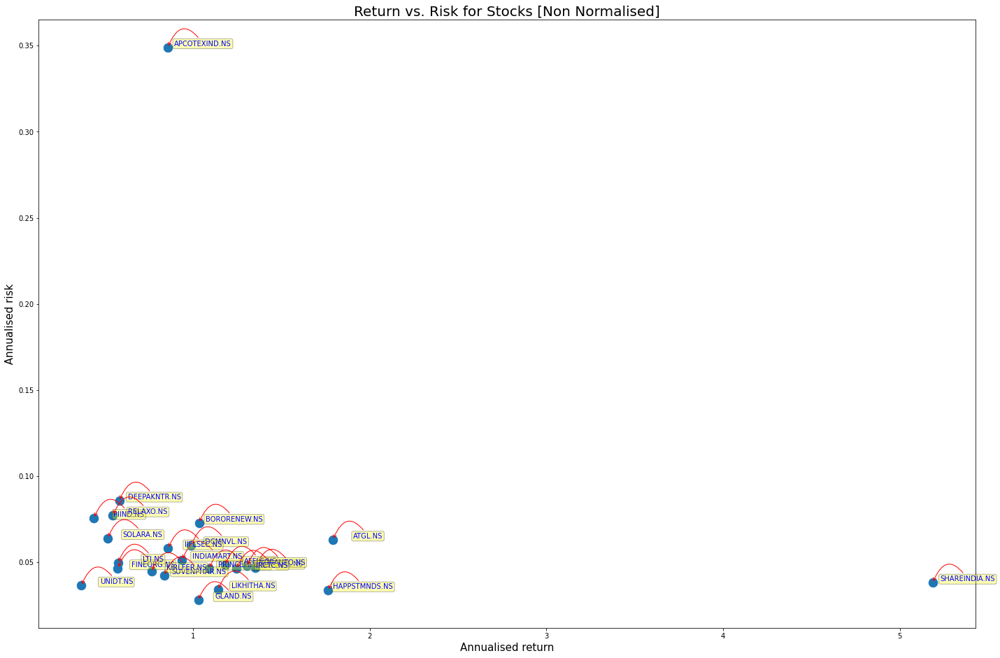

In [47]:
def scatter_graph_with_annotation(rets, x_param, y_param, title):
    area = np.pi*50.0
    # sns.set(style='darkgrid')
    plt.figure(figsize=(24,16))
    plt.scatter(rets[x_param], rets[y_param], s=area)
    plt.xlabel(x_param, fontsize=15)
    plt.ylabel(y_param, fontsize=15)
    plt.title(title, fontsize=20)

    for label, x, y in zip(rets.index, rets[x_param], rets[y_param]) : 
        plt.annotate(label, xy=(x,y), xytext=(50, 0), 
            textcoords='offset points', ha='center', va='bottom',color='blue',
            bbox=dict(boxstyle='round,pad=0.2', fc='yellow', alpha=0.3),
            arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.95', 
                                color='r'))

    plt.savefig(data_directory + title + ".svg")



rets = too_good#.dropna()
#rets = stock_Parameters.dropna()
title = "Return vs. Risk for Stocks [Non Normalised]"

scatter_graph_with_annotation(rets, "Annualised return", "Annualised risk", title)


OAL.NS           15.207486
PRINCEPIPE.NS    10.819920
FINEORG.NS        5.415594
DEEPAKNTR.NS      2.865800
APCOTEXIND.NS     2.741229
PIIND.NS          2.366253
INDIAMART.NS      8.466344
AFFLE.NS         11.506219
NDRAUTO.NS       14.076090
DCMNVL.NS         6.817466
BORORENEW.NS      7.094412
RELAXO.NS         3.098511
LIKHITHA.NS      17.368474
UNIDT.NS          4.334136
SHAREINDIA.NS    94.067257
IIFLSEC.NS        6.698918
GLAND.NS         18.800407
SUVENPHAR.NS      9.505593
SOLARA.NS         3.342862
IRCTC.NS         11.654931
KIRLFER.NS        6.887196
HAPPSTMNDS.NS    28.028007
LTI.NS            4.885315
ATGL.NS          13.582225
Name: Sortino ratio, dtype: float64

Text(0.5, 0, 'Scrip')

Text(0, 0.5, 'Calmer Ratio')

Text(0.5, 1.0, 'Scrip vs Calmer Ratio Sortino Ratio')

([<matplotlib.axis.XTick at 0xffff14258af0>,
 [Text(0, 0, 'OAL.NS'),
  Text(1, 0, 'PRINCEPIPE.NS'),
  Text(2, 0, 'FINEORG.NS'),
  Text(3, 0, 'DEEPAKNTR.NS'),
  Text(4, 0, 'APCOTEXIND.NS'),
  Text(5, 0, 'PIIND.NS'),
  Text(6, 0, 'INDIAMART.NS'),
  Text(7, 0, 'AFFLE.NS'),
  Text(8, 0, 'NDRAUTO.NS'),
  Text(9, 0, 'DCMNVL.NS'),
  Text(10, 0, 'BORORENEW.NS'),
  Text(11, 0, 'RELAXO.NS'),
  Text(12, 0, 'LIKHITHA.NS'),
  Text(13, 0, 'UNIDT.NS'),
  Text(14, 0, 'SHAREINDIA.NS'),
  Text(15, 0, 'IIFLSEC.NS'),
  Text(16, 0, 'GLAND.NS'),
  Text(17, 0, 'SUVENPHAR.NS'),
  Text(18, 0, 'SOLARA.NS'),
  Text(19, 0, 'IRCTC.NS'),
  Text(20, 0, 'KIRLFER.NS'),
  Text(21, 0, 'HAPPSTMNDS.NS'),
  Text(22, 0, 'LTI.NS'),
  Text(23, 0, 'ATGL.NS')])

<BarContainer object of 24 artists>

<BarContainer object of 24 artists>

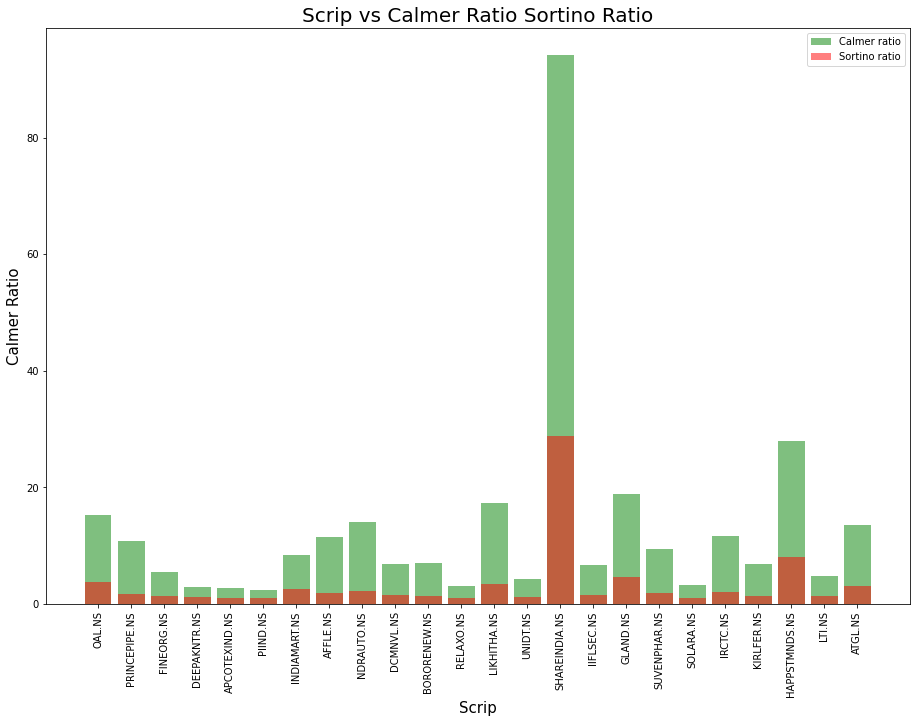

In [43]:

#params = stock_RiskAdjustedReturn_parameters.dropna()

#############################################################
#          Remove Outlier Stocks for better graph display   #
#############################################################
#params = params.drop(columns=['HAPPSTMNDS.NS', 'INTLCONV.NS'])

title = "Scrip vs Calmer Ratio Sortino Ratio"
rets = too_good[["Sortino ratio", "Calmar ratio"]] #.dropna()
rets["Sortino ratio"]

fig=plt.figure(figsize=(12,8))
ax=fig.add_axes([0,0,1,1])

plt.xlabel("Scrip", fontsize=15)
plt.ylabel("Calmer Ratio", fontsize=15)
plt.title(title, fontsize=20)
plt.xticks(range(len(rets.index)), rets.index, rotation='vertical')

#############################################################
#          Data has been clipped for Outlier Stocks         #
#############################################################
#ax.bar(range(len(rets.columns)), np.clip(rets["Calmer Ratio"], -0.5, 1.5), color='r', alpha=0.5)
#ax.bar(range(len(rets.index)), rets.loc["Calmer Ratio"], color='r', alpha=0.5)
#ax.bar(range(len(rets.columns)), np.clip(rets["Sortino Ratio"], -0.5, 1.5), color='g', alpha=0.5)
ax.bar(range(len(rets["Sortino ratio"])), rets["Sortino ratio"], color='g', alpha=0.5)
ax.bar(range(len(rets["Calmar ratio"])), rets["Calmar ratio"], color='r', alpha=0.5)
#ax.bar(range(len(rets.index)), rets.loc["Sortino Ratio"], color='g', alpha=0.5)
#ax.bar(range(len(rets.columns)), np.clip(rets.loc["Sterling Ratio", : ], -0.5, 1.5), color='b')

plt.legend(labels=["Calmer ratio", "Sortino ratio"])
plt.savefig(data_directory + title + ".svg")

In [44]:
def cumulative_returns(returns):
    
    return returns

def downside_risk(returns, risk_free=0):
    adj_returns = returns - risk_free
    sqr_downside = np.square(np.clip(adj_returns, np.NINF, 0))
    return np.sqrt(np.nanmean(sqr_downside) * 252)

def sortino(returns, risk_free=0):
    adj_returns = returns - risk_free
    drisk = downside_risk(adj_returns)
    if drisk == 0:
        return np.nan
    return (np.nanmean(adj_returns) * np.sqrt(252)) / drisk

def annual_returns(returns):
    num_years = len(returns) / 252
    cum_ret_final = (returns + 1).prod().squeeze()
    return cum_ret_final ** (1 / num_years) - 1

def calmar(returns):
    max_dd = max_drawdown(cumulative_returns(returns))
    if max_dd < 0:
        return annual_returns(returns) / abs(max_dd)
    return np.nan